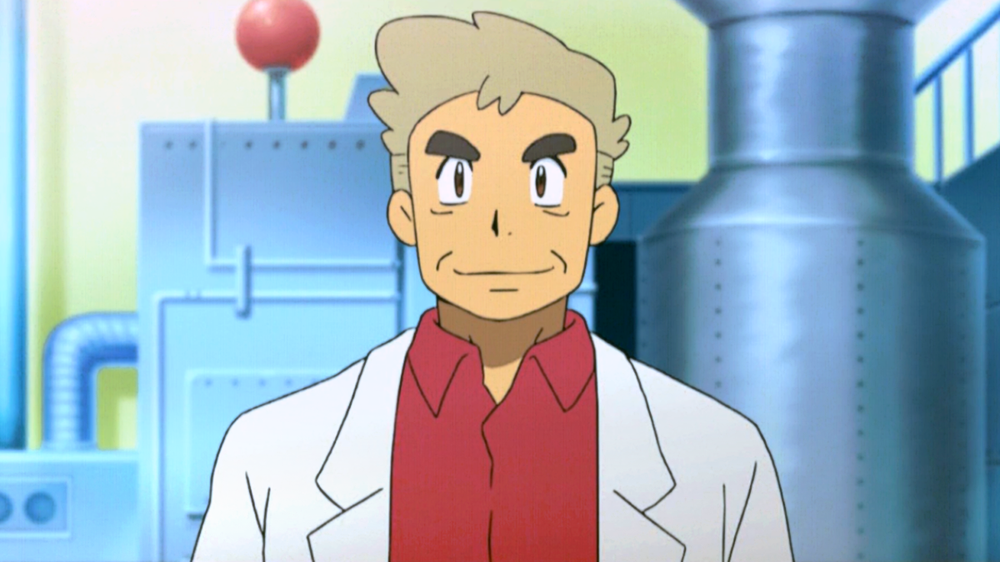

## Jupyter notebook TMT tutorial

#### Warning: this is a pilot (I'm still very new to this) - I'm submitting this work looking for criticism/suggestions/corrections: 

### Rationale: Continue the pipeline started by Robert Mills. He chose this platform while performing microbiome research, particularly because you can create an environment that is fully compatible with QIIME software (Knight lab), and I believe it is also useful for other independent machine learning platforms... You can also create an R environment and run R to create Jupyter notebook tutorials, which is something that I (or if somebody else wants to do it?) plan to use to help convert our lab codes into educational materials next...

#### One goal is to share with eachother/create a pipeline for every incoming student. 
####  Another goal is to create a bootcamp to train the next generation of scientists



### Before beginning, you need to have miniconda installed on your computer. 

### You can find installation instructions for miniconda here: https://docs.conda.io/en/latest/miniconda.html

Next, you will need to access the terminal (command on a PC and terminal on a mac) and create a conda environment. You can create an environment with the name "myfirstenv" by typing the following code in your terminal:

In [ ]:
conda create -n myfirstenv

Now that the environment is created, you can access it by typing the following command:

In [ ]:
conda activate myfirstenv

Use the codes below to create your first graph in jupyter notebook... Note that anything that starts with "#" is a comment, which is not part of the initiated code.

Now that you have activated your new environment, you will need to install some packages into it. For this tutorial, you will need to install matplotlib, pandas, seaborn, openpyxl, and jupyter notebook. Install each component by entering the following commands (one at a time):


In [ ]:
conda install matplotlib #This will install matplotlib in your environment

conda install pandas #This will install pandas in your environment

conda install openpyxl #This will install openpyxl in your environment

conda install jupyter notebook #This will install jupyter lab notebook in your environment

conda install seaborn #This will install seaborn in your environment

pip install -U scikit-learn #This will install sklearn

pip install python-math #This will install math

pip install bioinfokit #This will install bioinfokit

pip install miceforest #This will install miceforest

By this point hopefully you can continue installing all of the packages you will need below... Some of them may need to be install via pip instead of conda (i.e. "pip install pandas")... Continue this type of installation in your environment until you have installed all of the packages. Once complete, you can run jupyter notebook by entering the following command in the terminal:

In [ ]:
Jupyter notebook

## Now that you are in Jupyter notebook, you can import the packages you installed in your environment (myenv)

Info on packages used during this tutorial:

Math - https://docs.python.org/3/library/math.html

Pandas - https://pandas.pydata.org/

Numpy - https://numpy.org/

Seaborn - https://seaborn.pydata.org/

Matplotlib - https://matplotlib.org/

Bioinforkit - https://pypi.org/project/bioinfokit/0.3/

Sklearn - https://scikit-learn.org/stable/

Miceforest - https://pypi.org/project/miceforest/

#### All of the code below (including defining the functions) needs to be implemented (either by hitting the Run button above, or hitting  shift + enter)

In [6]:
#Import packages
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
from scipy import stats
from scipy.stats import linregress
from bioinfokit import analys, visuz
from bioinfokit.analys import stat
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import miceforest as mf

In [7]:
#Set figure resolution to 300dpi
import matplotlib as mpl
%matplotlib inline
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [8]:
#Optional for disabling warnings 
import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

## User defined functions (created by Robert) applied during Data Normalization:
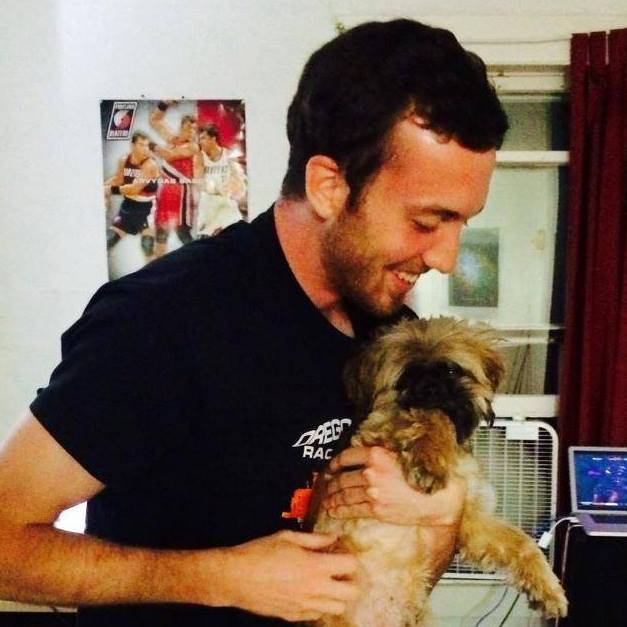

## Filtration (written by Robert):

In [9]:
def PSM_quality_filters(df, labels_df):
    """
    This function takes the raw PSM output file from proteome discoverer and applies several
    quality control filtering; 1) A redundancy filter which removes redundant PSMs that should
    not be included in the protein quantitation, 2) An average signal to noise filter removing
    PSMs with an average signal to noise ratio <10, 3) A spectral interference filter removing
    PSMs with more than 25% interference, 4) Removal of rejected and low confidence PSMs.
    
    As part of the average signal to noise filter, we add a pseudocount of 1 to channels
    missing any quantitation.
    
    parameters
    ----------
    df: pd.DataFrame
    labels_df: pd.DataFrame
    
    returns
    -------
    input dataframe with low quality PSMs removed
    
    """
    channels = ['126', '127N', '127C', '128N',
       '128C', '129N', '129C', '130N', '130C', '131']
    
    #Remove low confidence PSMs, report number removed
    df2 = df[df['Confidence'] == 'High']
    removed = (len(df) - len(df2))
    print("Number of low confidence PSMs removed: %s" % removed)
    
    #Remove Rejected PSMs, report number removed
    df3 = df2[df2['PSM Ambiguity'] != 'Rejected']
    removed = (len(df2) - len(df3))
    print("Number of ambiguous 'rejected' PSMs removed: %s" % removed)
    
    #Remove the PSMs with high interference
    df4 = df3[df3['Isolation Interference [%]'] < 25]
    removed = (len(df3) - len(df4))
    print("Number of PSMs with high interference removed: %s" % removed)
    
    #Remove duplicate & redundant PSMs
    #here we collect the index of each PSM that should not be included
    Keep_list = list(df4[(df4["Peptide Quan Usage"] != "DoNotUse") & (df4["Quan Info"] != "Redundant")].index)
    
    
    #Subset out the keep list PSMs
    df5 = df4.loc[df4.index.isin(Keep_list)]
    removed = (len(df4) - len(df5))
    print("Number of redundant PSMs removed: %s" % removed)
    
    #Remove PSMs with low avg signal
    
    #Replace NaN with 1
    df5 = df5.replace(np.nan, 1)
    #Replace 0 with 1
    df5 = df5.replace(0, 1)
    
    #Detect the na valued channels so we don't count them in the average
    
    #Find and save the channels to use per experiment in a dictionary
    global dataframe_collection
    dataframe_collection = {}
    Experiments = list(labels_df['Experiment'])
    Experiment_labels={}
    Low_avg_removed = 0
    
    for i in Experiments:
        NA_Channels = []
        exp_channels = ['126', '127N', '127C', '128N', '128C', '129N', '129C', '130N','130C','131']
        for j in channels:
            if pd.isnull(labels_df.loc[i][j]) == True:
                NA_Channels.append(j)
        for j in NA_Channels:
            exp_channels.remove(j)
            
        df_sep = df5[df5['Experiment'] == i]
        df_sep[exp_channels] = df_sep[exp_channels].astype('float64')
        df_sep['Avg_Sig2Noise'] = df_sep[exp_channels].mean(axis=1)
        df_sep2 = df_sep[df_sep['Avg_Sig2Noise'] > 10]
        
       
        Low_avg_removed = (len(df_sep) - len(df_sep2)) + Low_avg_removed
        #Save to collection
        dataframe_collection["%s" % i] = df_sep2
        #dataframe_collection["%s_LowSignalFiltered" % i] = df_sep3
        #dataframe_collection["%s_RejectPSMs" % i] = PSM_Reject
    
    removed = (len(df5) - Low_avg_removed)
    print("Number of PSMs with low average signal removed: %s" % Low_avg_removed)
    
    #Report the percent of PSMs removed in quality control
    removed_percent = (len(df) - removed)/len(df)
    print("Percent of PSMs removed during quality filtering: %s" % removed_percent)
    
    return print("Dataframes per experiment with low quality PSMs removed saved under name: dataframe_collection")

## Summation (written by Robert)

In [10]:
def Sum_PSMs_per_Experiment(df_collection, labels_df, experiment_column, bridge_channel):
    """
    This function takes a dictionary of  dataframes containing PSMs seperated per experiment,
    a column name which contains the name of the experiment each PSMs was found in, 
    and a string listing the channel name which was used as a bridge channel. 
    The function outputs the dataframes containing summed signal to noise ratios per protein 
    for each experiment. Each dataframe is placed in a new collection of dataframes.
    
    parameters
    ----------
    df_collection: pd.DataFrame
    labels_df: pd.DataFrame
    experiment_column: string
    bridge_channel: string
    
    returns
    -------
    A collection of dataframes
    
    """
    channels = ['126', '127N', '127C', '128N',
       '128C', '129N', '129C', '130N', '130C', '131']
    
    
    
    Experiment_list = list(labels_df['Experiment'])
    
    #Create dataframes per experiment & sum PSMs per protein
    global dataframe_collection2
    global current_df
    dataframe_collection2 = {}
    bridge_vals = []
    for i in Experiment_list:
        #Subset df
        current_df = df_collection[i]
        #Remove columns without a master protein
        current_df = current_df[current_df['Master Protein Accessions'] != 'nan']
        
        # Take the first Master Protein Accession from the protein groups as the representative
        # Protein. Place this protein name in a new column named "Master Protein"
        current_df['Master Protein Accessions'] = current_df['Master Protein Accessions'].astype('str')
        current_df['Master Protein'] = current_df['Master Protein Accessions'].apply(lambda x: x.split(';')[0])
        
        #Change index
        current_df.index = current_df['Master Protein']
        NA_Channels = []
        for j in channels:
            if pd.isnull(labels_df.loc[i][j]) == True:
                NA_Channels.append(j)
        exp_channels = ['126', '127N', '127C', '128N',
       '128C', '129N', '129C', '130N', '130C', '131']
        for j in NA_Channels:
            exp_channels.remove(j)        
        #subset out only the used channels
        current_df = current_df[exp_channels].astype('float64')
        #Sum by protein
        current_df = current_df[exp_channels].astype('float64').groupby([current_df.index]).agg(['sum'])
        #Add bridge channel values to one list
        bridge_vals = list(current_df[bridge_channel]['sum']) + bridge_vals
        #Print the number of proteins quantified in each experiment
        print("Number of proteins quantified in Experiment %s: %s" % (i, len(current_df)))
        #Save to collection
        dataframe_collection2["%s" % i] = current_df
    global bridge_median
    bridge_median = np.median(bridge_vals)
    
    return print('Collection of dataframes per experiments saved under name: dataframe_collection2; Median of bridge channel saved under name: bridge_median')

## Normalization (written by Robert)

In [11]:
def One_Bridge_Normalization(df_collection,label_df,bridge_channel,bridge_median):
    """
    This function performs two normalization steps analagous to what was developed for 
    normalization of RNA seq data. The first step of normalization largely accounts 
    for differences in the number of peptides used to quantify each protein which would 
    drive all associations when comparing protein quant values between experiments where 
    a different number of PSMs was identified within the same protein. The second step helps
    remove some of the systematic errors that occur between samples
    
    The function takes a collection dataframes with summed protein quant values in separate 
    dataframes dependent on the experiment.
    
    Side note - don't have any sample names that are named 126 or 131 as they interfere with channel names.
    
    parameters
    ----------
    df_collection: pd.dict
    label_df: pd.DataFrame
    bridge_channel: string
    bridge_median: float
    
    returns
    -------
    A new dataframe with normalized values per protein.
    
    """
    channels = ['126', '127N', '127C', '128N',
       '128C', '129N', '129C', '130N', '130C', '131']
    
    #First Normalization step
    #Value/(protein val in bridge/Median of all bridge)
    
    global dataframe_collection3
    global current_df2
    global labels
    global Exp_labels
    global all_samples
    
    dataframe_collection3 = {}
    Experiment_list = list(label_df.index)
    for i in Experiment_list:
        #Subset out label metadata for current experiment
        Exp_labels = label_df[label_df.index == '%s' % i]
        
        #Make a list of channels containing samples in the current experiment
        NA_Channels = []
        for j in channels:
            if pd.isnull(label_df.loc[i][j]) == True:
                NA_Channels.append(j)
        exp_channels = ['126', '127N', '127C', '128N',
       '128C', '129N', '129C', '130N', '130C', '131']
        for j in NA_Channels:
            exp_channels.remove(j)        
        exp_channels.remove(bridge_channel)
        
        #Subset df
        current_df2 = df_collection['%s' % i]
        #Perform normalization into a new column labeled by actual sample name
        #Create a list of the names of samples in this experiment, to subset out only the channels containing names
        Experiment_samples = []
        for j in exp_channels:
            name = Exp_labels.loc['%s' % i][j]
            Experiment_samples.append(name)
            current_df2['%s' % name] = current_df2['%s' % j]/(current_df2[bridge_channel]/bridge_median)
        #Subset out the columns with names of samples
        current_df2 = current_df2[Experiment_samples]
        #Save to collection of dfs with columns containing sample names
        dataframe_collection3["%s" % i] = current_df2
    
    #Make another list of dataframes to merge with first experiment
    Exp1 = Experiment_list[0]
    Experiment_list_remove1 = Experiment_list
    Experiment_list_remove1.remove(Exp1)
    
    #Merge all dataframes by protein accession
    #Start with first experiment in separate df
    global combined_df
    combined_df = dataframe_collection3['%s' % Exp1]
    for i in Experiment_list_remove1:
        current_df3 = dataframe_collection3['%s' % i]
        combined_df = combined_df.merge(current_df3, left_index = True, right_index = True, how = 'outer')
    
    #Remove "Sums" fromt the multi index
    combined_df.columns = combined_df.columns.droplevel(1)
    
    #Create list of all samples
    all_samples = list(combined_df.columns)
    
    #Second Normalization step
    #Value/(Median Value in Sample/Median of all values)
    global Overall_Median
    Overall_Median = np.nanmedian(combined_df)
    for i in all_samples:
            combined_df['%s_adj2' % i] = combined_df[i]/(combined_df[i].median()/Overall_Median)
    #Remove "_adj2" characters
    global Normalized_df
    combined_df2 = combined_df.drop(columns=all_samples)
    combined_df2 = combined_df2.rename(columns = lambda x : str(x)[:-5])
    Normalized_df = combined_df2
    
    return print("Dataframe with normalized protein quants saved under name: Normalized_df")

### Once you are into Jupyter notebook, you will create a new dataframe. You can name this dataframe whatever you want. We will call our first dataframe df (short for dataframe).

### Load PSMs and label layout to perform functions (filter, sum, normalize) on:


#### Please note: It's important to append the spectrum files with the experiment or 10plex name. For example, if DG142207 and DG142208 are in the first 10plex and DG142217 and DG142218 are in the second 10plex, you would label them DG142207_10plex1, DG142208_10plex1, DG142207_10plex2, DG142208_10plex2 etc... 

#### All 12 fractions for each 10plex should be appended with the appropriate name after the underscore. The name after the underscore should also match the name of the "Experiment" column in the "Labels" csv file (as shown below).  

In [12]:
#LOAD DATA
df = pd.read_csv('./HeadPlasma_PSMs3.txt',sep='\t') #This is the txt file output from PD imported as dataframe "df"

#visualize dataframe
df

,Checked,Confidence,Identifying Node,PSM Ambiguity,Annotated Sequence,Modifications,# Protein Groups,# Proteins,Protein,Master Protein Accessions,...,126,127N,127C,128N,128C,129N,129C,130N,130C,131
0,False,High,Sequest HT (A2),Unambiguous,nSITLTNLNPGTEYVVSIIAVNGR,N-Term(TMT6plex),1,7,A0A087WSN6,A0A087WSN6,...,14.9,25.5,46.5,29.4,24.4,20.6,25.3,31.6,30.4,23.3
1,False,High,Sequest HT (A2),Unambiguous,vLDGYLFSk,N-Term(TMT6plex); K9(TMT6plex),1,2,A0A571BF69,A0A571BF69,...,122.2,90.1,145.7,89.8,130.1,131.9,141.2,103.5,116.3,96.3
2,False,High,Sequest HT (A2),Unambiguous,tPFITNPGYDTENGIQLPGTTHQQPSVGQQMIFEEHGFR,N-Term(TMT6plex),1,5,A0A087WSN6,A0A087WSN6,...,23.3,22.8,29.5,28.5,16.9,15.3,32.1,21.1,35.1,15.8
3,False,High,Sequest HT (A2),Unambiguous,aTLTVDkPSSTAYMQLSSLTSEDSAVYYcAR,N-Term(TMT6plex); K7(TMT6plex); C29(Carbamidom...,1,2,P01754,P01754,...,37.8,57.6,88.3,106.6,30.9,27.5,240.5,111.4,192.5,54.7
4,False,High,Sequest HT (A2),Unambiguous,dQSPASHEIATNLGDFAISLYR,N-Term(TMT6plex),4,7,P22599; Q00898; A0A0R4J0X5; A0A0A0MQA3,P22599; Q00898; A0A0R4J0X5; A0A0A0MQA3,...,30.8,47.9,26.2,26.7,19.3,30.8,52.9,28.5,57.6,22.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56281,False,High,Sequest HT (A2),Unambiguous,vGQPGAAGPVSPmcPGR,N-Term(TMT6plex); M13(Oxidation); C14(Carbamid...,1,4,P29699,P29699,...,9.4,16.7,16.1,13.0,10.7,16.7,17.1,15.3,11.9,17.5
56282,False,High,Sequest HT (A2),Unambiguous,lLEAcTFHkH,N-Term(TMT6plex); C5(Carbamidomethyl); K9(TMT6...,1,1,Q921I1,Q921I1,...,49.1,104.8,168.1,117.7,81.6,24.7,72.5,241.1,62.8,123.2
56283,False,High,Sequest HT (A2),Unambiguous,gTGFLSIEPLDPR,N-Term(TMT6plex),1,1,P01029,P01029,...,60.5,120.7,81.3,93.9,75.6,73.6,83.9,90.8,68.8,79.5
56284,False,High,Sequest HT (A2),Unambiguous,hGTDDGVVWmNWk,N-Term(TMT6plex); M10(Oxidation); K13(TMT6plex),1,1,Q8K0E8,Q8K0E8,...,34.8,NaN,59.8,47.5,39.8,36.6,48.1,70.4,25.5,42.1


In [13]:
Labels = pd.read_csv('./LabelLayout.csv',dtype='str') #This is a label layout of the samples imported to dataframe "Labels"
Labels.index = Labels['Experiment'] #This sets the index column of the label layout to the "Experiment" column

In [14]:
#View 10plex Label scheme (dataframe Labels)
Labels

,Experiment,126,127N,127C,128N,128C,129N,129C,130N,130C,131
Experiment,,,,,,,,,,,
10plex1,10plex1,29,23,33,27,22,36,42,21,41,bridge1
10plex2,10plex2,39,35,37,20,18,32,28,45,26,bridge2
10plex3,10plex3,19,25,38,30,44,34,24,31,40,bridge3


In [15]:
#View dataframe df (data imported from Proteome Discoverer)
df.head(10)

,Checked,Confidence,Identifying Node,PSM Ambiguity,Annotated Sequence,Modifications,# Protein Groups,# Proteins,Protein,Master Protein Accessions,...,126,127N,127C,128N,128C,129N,129C,130N,130C,131
0,False,High,Sequest HT (A2),Unambiguous,nSITLTNLNPGTEYVVSIIAVNGR,N-Term(TMT6plex),1,7,A0A087WSN6,A0A087WSN6,...,14.9,25.5,46.5,29.4,24.4,20.6,25.3,31.6,30.4,23.3
1,False,High,Sequest HT (A2),Unambiguous,vLDGYLFSk,N-Term(TMT6plex); K9(TMT6plex),1,2,A0A571BF69,A0A571BF69,...,122.2,90.1,145.7,89.8,130.1,131.9,141.2,103.5,116.3,96.3
2,False,High,Sequest HT (A2),Unambiguous,tPFITNPGYDTENGIQLPGTTHQQPSVGQQMIFEEHGFR,N-Term(TMT6plex),1,5,A0A087WSN6,A0A087WSN6,...,23.3,22.8,29.5,28.5,16.9,15.3,32.1,21.1,35.1,15.8
3,False,High,Sequest HT (A2),Unambiguous,aTLTVDkPSSTAYMQLSSLTSEDSAVYYcAR,N-Term(TMT6plex); K7(TMT6plex); C29(Carbamidom...,1,2,P01754,P01754,...,37.8,57.6,88.3,106.6,30.9,27.5,240.5,111.4,192.5,54.7
4,False,High,Sequest HT (A2),Unambiguous,dQSPASHEIATNLGDFAISLYR,N-Term(TMT6plex),4,7,P22599; Q00898; A0A0R4J0X5; A0A0A0MQA3,P22599; Q00898; A0A0R4J0X5; A0A0A0MQA3,...,30.8,47.9,26.2,26.7,19.3,30.8,52.9,28.5,57.6,22.6
5,False,High,Sequest HT (A2),Unambiguous,lSQTFPNADFAEITk,N-Term(TMT6plex); K15(TMT6plex),1,1,P07724,P07724,...,71.7,68.4,95.0,61.3,95.4,77.0,100.2,69.8,96.3,53.2
6,False,High,Sequest HT (A2),Unambiguous,iFNSGADLSGITEENAPLk,N-Term(TMT6plex); K19(TMT6plex),1,1,Q00898,Q00898,...,70.9,185.2,90.6,59.3,41.4,90.8,200.5,46.1,184.3,80.0
7,False,High,Sequest HT (A2),Unambiguous,lVAYYTLIGASGQR,N-Term(TMT6plex),1,1,P01027,P01027,...,18.8,24.2,35.1,27.6,21.4,13.3,24.3,31.6,30.9,15.1
8,False,High,Sequest HT (A2),Unambiguous,lFVDPSQGLEVTGk,N-Term(TMT6plex); K14(TMT6plex),2,3,E9PVD2; A6X935,E9PVD2; A6X935,...,190.7,409.7,228.2,201.9,117.5,244.3,487.1,152.9,482.5,195.8
9,False,High,Sequest HT (A2),Unambiguous,iFNSGADLSGITEENAPLk,N-Term(TMT6plex); K19(TMT6plex),1,1,Q00898,Q00898,...,91.6,241.5,119.2,75.7,57.6,140.7,270.9,65.6,308.9,123.0


In [16]:
#Removing characters from beginning and end of the spectrum files to make a columns consistent for each experiment
def remove_raw_f(x):
    return x[9:-4]

df['Experiment'] = df['Spectrum File'].apply(remove_raw_f)
df['Experiment']

0        10plex1
1        10plex1
2        10plex1
3        10plex1
4        10plex1
          ...   
56281    10plex3
56282    10plex3
56283    10plex3
56284    10plex3
56285    10plex3
Name: Experiment, Length: 56286, dtype: object

In [17]:
#Remove duplicate rows based on all columns
df['Experiment'].drop_duplicates()

0        10plex1
18677    10plex2
37636    10plex3
Name: Experiment, dtype: object

In [18]:
#Perform quality filtering function (shown above in user defined functions)
PSM_quality_filters(df, Labels)

Number of low confidence PSMs removed: 0
Number of ambiguous 'rejected' PSMs removed: 29
Number of PSMs with high interference removed: 10651
Number of redundant PSMs removed: 3168
Number of PSMs with low average signal removed: 2645
Percent of PSMs removed during quality filtering: 0.2930213552215471
Dataframes per experiment with low quality PSMs removed saved under name: dataframe_collection


In [19]:
#Sum the data using sum function *shown above in user defined functions)
Sum_PSMs_per_Experiment(df_collection=dataframe_collection, labels_df=Labels, experiment_column='Experiment',bridge_channel='131')

Number of proteins quantified in Experiment 10plex1: 676
Number of proteins quantified in Experiment 10plex2: 668
Number of proteins quantified in Experiment 10plex3: 664
Collection of dataframes per experiments saved under name: dataframe_collection2; Median of bridge channel saved under name: bridge_median


In [20]:
#If curious, you can check the bridge median:
bridge_median

155.2

In [21]:
#Apply the one bridge normalization function (shown above in user defined functions)
One_Bridge_Normalization(df_collection=dataframe_collection2,label_df=Labels,bridge_channel='131', bridge_median=bridge_median)

Dataframe with normalized protein quants saved under name: Normalized_df


In [22]:
#If curious, you can check Normalized_df
Normalized_df

,29,23,33,27,22,36,42,21,41,39,...,26,19,25,38,30,44,34,24,31,40
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,364.338575,112.903267,138.240201,124.442726,98.758266,255.299453,178.989838,165.674286,183.975238,106.755853,...,117.205388,149.455396,100.466405,174.591700,220.022180,147.155775,127.934449,122.270686,500.675708,165.060503
A0A075B5K2,314.600469,178.041912,231.303910,135.333896,82.257854,164.596444,184.328125,134.813408,175.445522,144.908942,...,108.579084,167.275585,69.319974,138.197279,129.281858,131.335315,170.392253,91.110384,197.801262,127.806684
A0A075B5K6,250.808397,109.799638,156.952938,109.195173,135.845034,194.076338,222.853993,148.077972,192.882902,167.345348,...,249.768354,89.670999,112.410310,186.851484,126.690255,143.479821,196.214906,90.643023,107.835970,232.885617
A0A075B5L1,134.925285,91.270391,319.192166,123.452601,120.367252,130.937027,187.671429,126.460023,220.775422,85.443715,...,127.445550,52.255501,168.980525,55.902964,395.870746,133.953459,96.172195,141.061164,122.252164,68.601525
A0A075B5L3,133.060455,65.451233,470.370640,57.168664,66.670667,178.754522,72.117660,228.406080,209.578596,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,39.521323,37.291501,43.979228,42.667970,58.515460,50.430442,28.146328,202.776510,35.878917,150.447283,...,140.919226,155.662106,154.255451,152.972834,132.195046,162.562763,265.676715,197.816836,183.046955,111.263676
Q9Z2L6,155.716268,271.086037,215.214448,318.155723,248.637140,136.640537,158.183398,147.438329,155.537306,175.746491,...,179.767682,141.424181,175.017280,151.010837,173.758950,155.566052,149.546141,173.694392,136.422662,164.715267
Q9Z2U0,160.394209,139.080826,192.965840,165.341787,145.515410,167.694086,163.655865,139.866469,185.696159,6.865450,...,97.345615,172.130514,180.361788,170.116475,170.523353,140.511273,172.838089,177.535300,254.057414,162.181186


In [23]:
#Import protein names from head dataset for reference - we will use this later to add annotation to the Master Protein list
proteinlist = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Genenames.xlsx', index_col=0) 

#View dataframe
proteinlist.head()

,Protein
Master Protein,
E9Q414,Apob
P01027,C3
P28665,Mug1
A0A087WSN6,Fn1
Q61838,Pzp


In [24]:
#Determine the number of missing values in each sample column
Normalized_df.isnull().sum()

29    185
23    185
33    185
27    185
22    185
36    185
42    185
21    185
41    185
39    193
35    193
37    193
20    193
18    193
32    193
28    193
45    193
26    193
19    197
25    197
38    197
30    197
44    197
34    197
24    197
31    197
40    197
dtype: int64

In [25]:
#Determine the % of total missing values in each column
copydf = Normalized_df
copydf.isnull().sum()/len(copydf)

29    0.214866
23    0.214866
33    0.214866
27    0.214866
22    0.214866
36    0.214866
42    0.214866
21    0.214866
41    0.214866
39    0.224158
35    0.224158
37    0.224158
20    0.224158
18    0.224158
32    0.224158
28    0.224158
45    0.224158
26    0.224158
19    0.228804
25    0.228804
38    0.228804
30    0.228804
44    0.228804
34    0.228804
24    0.228804
31    0.228804
40    0.228804
dtype: float64

## Visualizing the data without imputation (preferred method for some)

In [27]:
#Drop all missing values from Normalized_df and assign a new name (df1)
df1 = Normalized_df.dropna()

#View missing values in df1 dataframe
df1.isnull().sum().head()

29    0
23    0
33    0
27    0
22    0
dtype: int64

In [140]:
#Use numpy to log2transform the data
df1 = np.log2(df1) #log2transforms the data
df1

,29,23,33,27,22,36,42,21,41,39,...,26,19,25,38,30,44,34,24,31,40
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,8.509136,6.818943,7.111033,6.959338,6.625830,7.996047,7.483734,7.372206,7.523368,6.738171,...,6.872895,7.223571,6.650569,7.447841,7.781505,7.201200,6.999261,6.933935,8.967733,7.366851
A0A075B5K2,8.297377,7.476073,7.853646,7.080379,6.362082,7.362789,7.526132,7.074820,7.454879,7.179003,...,6.762602,7.386083,6.115199,7.110585,7.014376,7.037111,7.412716,6.509544,7.627908,6.997819
A0A075B5K6,7.970442,6.778729,7.294188,6.770765,7.085818,7.600480,7.799955,7.210213,7.591581,7.386685,...,7.964447,6.486570,6.812631,7.545748,6.985162,7.164704,7.616291,6.502124,6.752695,7.863478
A0A075B5L1,7.076017,6.512075,8.318281,6.947813,6.911299,7.032729,7.552065,6.982538,7.786436,6.416902,...,6.993737,5.707511,7.400713,5.804853,8.628886,7.065588,6.587548,7.140177,6.933716,6.100169
A0A075B5L7,7.241130,7.552765,7.636530,7.293519,7.331405,7.605460,8.104452,7.385761,8.317210,8.043998,...,6.535389,6.917270,7.025740,8.068137,6.774245,7.457984,7.549687,7.268135,7.203331,7.352288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z1T2,7.381351,7.991441,7.151996,7.777604,7.552648,7.244764,7.320819,7.533358,7.215472,7.256588,...,7.796483,7.511955,7.508248,7.051450,7.132684,7.515665,7.396329,7.341856,7.176166,7.206921
Q9Z2K1,5.304559,5.220775,5.458750,5.415082,5.870746,5.656223,4.814875,7.663747,5.165064,7.233114,...,7.138725,7.282274,7.269178,7.257132,7.046524,7.344853,8.053528,7.628021,7.516070,6.797839
Q9Z2L6,7.282776,8.082607,7.749631,8.313589,7.957898,7.094242,7.305454,7.203968,7.281117,7.457352,...,7.489990,7.143885,7.451354,7.238508,7.440943,7.281383,7.224447,7.440407,7.091940,7.363830


array([[<AxesSubplot:title={'center':'29'}>,
        <AxesSubplot:title={'center':'23'}>,
        <AxesSubplot:title={'center':'33'}>,
        <AxesSubplot:title={'center':'27'}>,
        <AxesSubplot:title={'center':'22'}>],
       [<AxesSubplot:title={'center':'36'}>,
        <AxesSubplot:title={'center':'42'}>,
        <AxesSubplot:title={'center':'21'}>,
        <AxesSubplot:title={'center':'41'}>,
        <AxesSubplot:title={'center':'39'}>],
       [<AxesSubplot:title={'center':'35'}>,
        <AxesSubplot:title={'center':'37'}>,
        <AxesSubplot:title={'center':'20'}>,
        <AxesSubplot:title={'center':'18'}>,
        <AxesSubplot:title={'center':'32'}>],
       [<AxesSubplot:title={'center':'28'}>,
        <AxesSubplot:title={'center':'45'}>,
        <AxesSubplot:title={'center':'26'}>,
        <AxesSubplot:title={'center':'19'}>,
        <AxesSubplot:title={'center':'25'}>],
       [<AxesSubplot:title={'center':'38'}>,
        <AxesSubplot:title={'center':'30'}>,
      

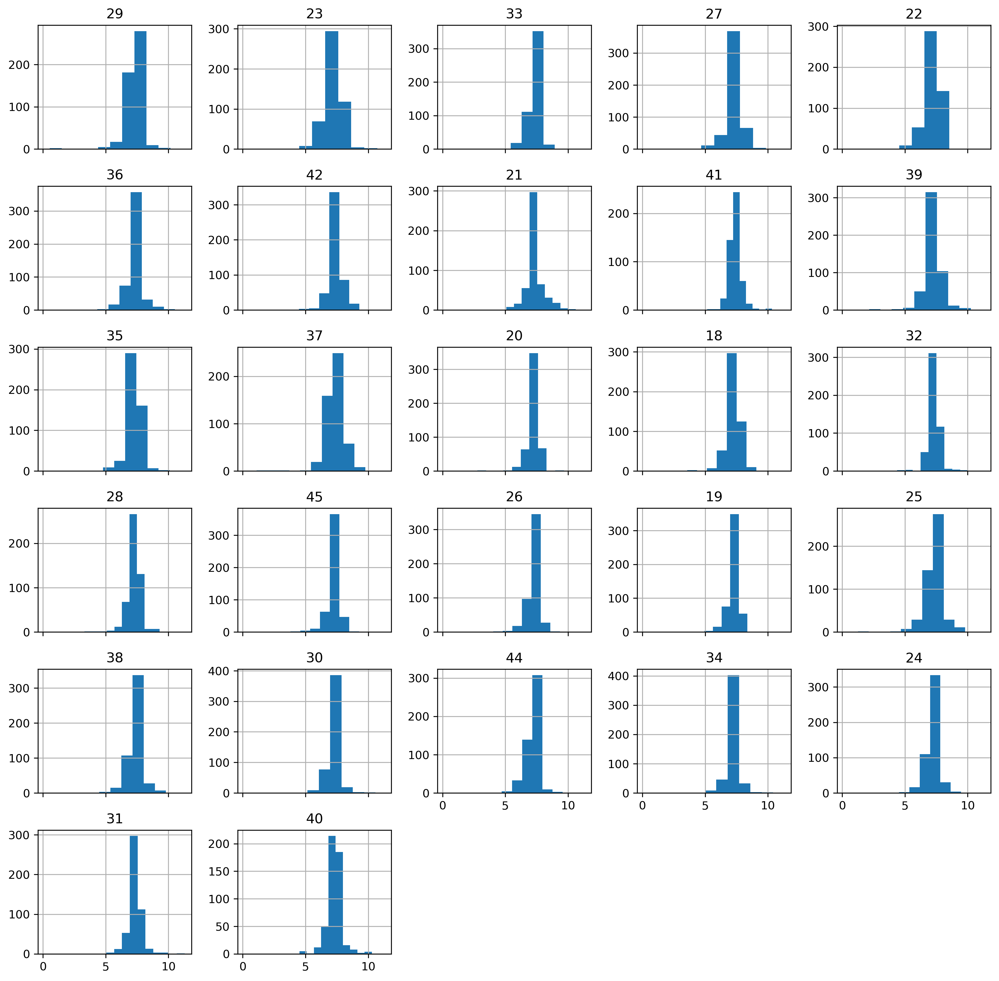

In [141]:
#View the distribution of each column
df1.hist(figsize=(15,15), sharex = True)

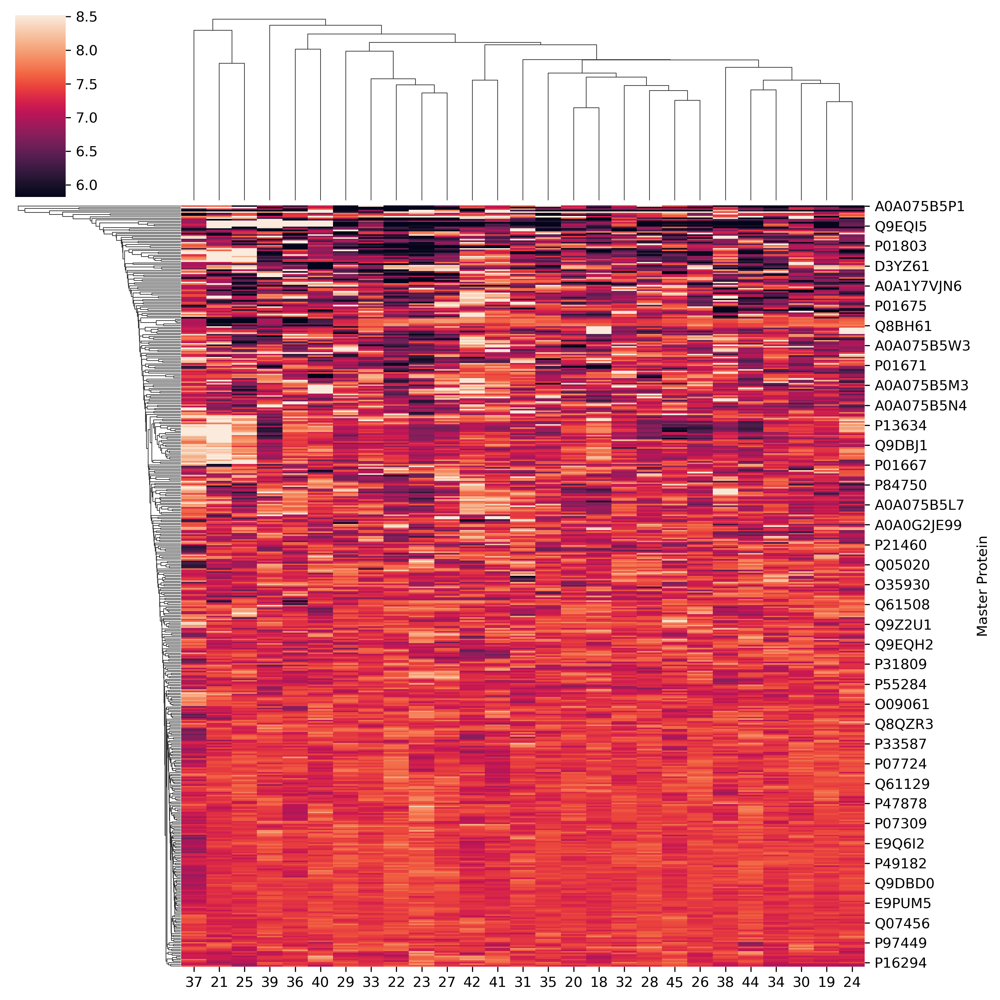

In [142]:
#Perform a mainly default settings (added robustness for better visualization) heirchical clustering analysis on the data using seaborn clustermap to look for batch effects
sns.clustermap(df1, robust = True)

In [29]:
#View the labels (batches) to compare and contrast) 
Labels

,Experiment,126,127N,127C,128N,128C,129N,129C,130N,130C,131
Experiment,,,,,,,,,,,
10plex1,10plex1,29,23,33,27,22,36,42,21,41,bridge1
10plex2,10plex2,39,35,37,20,18,32,28,45,26,bridge2
10plex3,10plex3,19,25,38,30,44,34,24,31,40,bridge3


In [30]:
#Export dataframes to csv with index - 
Normalized_df.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Normalized_df.csv')


At this point I opened the Normalized_df file in excel, renamed the columns with the correct genotypes, and saved it as an excel file (Normalized_df_named). For some reason in this stem, I couldn't rename them in pandas. I had to rename them in excel and upload them for downstream steps to be compatible for reasons I don't yet entirely understand

In [39]:
# load data file
Normalized_df2 = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Normalized_df_named.xlsx', index_col=0)

## ANOVA by group on normalized data (no imputation)

In [40]:
#Visualize data
Normalized_df2

,3m - wt,3m - wt.1,3m - wt.2,3m - wt.3,3m - wt.4,3m - appki,3m - appki.1,3m - appki.2,3m - appki.3,3m - appki.4,...,6m - appki.2,6m - appki.3,6m - appki.4,12m - wt,12m - wt.1,12m - wt.2,12m - appki,12m - appki.1,12m - appki.2,12m - appki.3
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,...,138.240201,127.934449,221.879408,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,...,231.303910,170.392253,217.500829,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,...,156.952938,196.214906,224.137667,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,...,319.192166,96.172195,145.560006,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L3,NaN,NaN,NaN,228.406080,66.670667,65.451233,NaN,NaN,NaN,57.168664,...,470.370640,NaN,NaN,178.754522,NaN,NaN,NaN,NaN,209.578596,72.117660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460,37.291501,197.816836,154.255451,140.919226,42.667970,...,43.979228,265.676715,81.688972,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140,271.086037,173.694392,175.017280,179.767682,318.155723,...,215.214448,149.546141,179.392235,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,6.917337,172.130514,6.868211,139.866469,145.515410,139.080826,177.535300,180.361788,97.345615,165.341787,...,192.965840,172.838089,6.933033,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865


In [41]:
#Drop missing values
df2 = Normalized_df2.dropna()
df2

,3m - wt,3m - wt.1,3m - wt.2,3m - wt.3,3m - wt.4,3m - appki,3m - appki.1,3m - appki.2,3m - appki.3,3m - appki.4,...,6m - appki.2,6m - appki.3,6m - appki.4,12m - wt,12m - wt.1,12m - wt.2,12m - appki,12m - appki.1,12m - appki.2,12m - appki.3
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,...,138.240201,127.934449,221.879408,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,...,231.303910,170.392253,217.500829,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,...,156.952938,196.214906,224.137667,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,...,319.192166,96.172195,145.560006,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173,...,198.986925,187.362298,300.806980,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z1T2,219.284377,182.525597,227.753663,185.253666,187.747318,254.485677,162.225457,182.057165,222.318250,219.428020,...,142.221550,168.467820,185.637906,151.667064,171.967732,132.647176,152.915208,147.740427,148.618749,159.877045
Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460,37.291501,197.816836,154.255451,140.919226,42.667970,...,43.979228,265.676715,81.688972,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140,271.086037,173.694392,175.017280,179.767682,318.155723,...,215.214448,149.546141,179.392235,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398


In [42]:
#Use numpy to log2transform the data
df2 = np.log2(df2) #log2transforms the data
df2 

,3m - wt,3m - wt.1,3m - wt.2,3m - wt.3,3m - wt.4,3m - appki,3m - appki.1,3m - appki.2,3m - appki.3,3m - appki.4,...,6m - appki.2,6m - appki.3,6m - appki.4,12m - wt,12m - wt.1,12m - wt.2,12m - appki,12m - appki.1,12m - appki.2,12m - appki.3
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,6.960917,7.223571,6.680968,7.372206,6.625830,6.818943,6.933935,6.650569,6.872895,6.959338,...,7.111033,6.999261,7.793632,7.996047,7.374076,7.447841,6.738171,7.366851,7.523368,7.483734
A0A075B5K2,6.963976,7.386083,7.855503,7.074820,6.362082,7.476073,6.509544,6.115199,6.762602,7.080379,...,7.853646,7.412716,7.764877,7.362789,7.004587,7.110585,7.179003,6.997819,7.454879,7.526132
A0A075B5K6,7.622107,6.486570,7.402371,7.210213,7.085818,6.778729,6.502124,6.812631,7.964447,6.770765,...,7.294188,7.616291,7.808241,7.600480,7.733654,7.545748,7.386685,7.863478,7.591581,7.799955
A0A075B5L1,6.696484,5.707511,6.776522,6.982538,6.911299,6.512075,7.140177,7.400713,6.993737,6.947813,...,8.318281,6.587548,7.185470,7.032729,7.524981,5.804853,6.416902,6.100169,7.786436,7.552065
A0A075B5L7,6.687803,6.917270,6.860866,7.385761,7.331405,7.552765,7.268135,7.025740,6.535389,7.293519,...,7.636530,7.549687,8.232694,7.605460,7.989802,8.068137,8.043998,7.352288,8.317210,8.104452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z1T2,7.776659,7.511955,7.831330,7.533358,7.552648,7.991441,7.341856,7.508248,7.796483,7.777604,...,7.151996,7.396329,7.536348,7.244764,7.425994,7.051450,7.256588,7.206921,7.215472,7.320819
Q9Z2K1,8.147797,7.282274,7.642445,7.663747,5.870746,5.220775,7.628021,7.269178,7.138725,5.415082,...,5.458750,8.053528,6.352069,5.656223,7.712666,7.257132,7.233114,6.797839,5.165064,4.814875
Q9Z2L6,7.571231,7.143885,7.389599,7.203968,7.957898,8.082607,7.440407,7.451354,7.489990,8.313589,...,7.749631,7.224447,7.486974,7.094242,7.066845,7.238508,7.457352,7.363830,7.281117,7.305454


In [43]:
# reshape the d dataframe suitable for statsmodels package 
df_melt = pd.melt(df2.reset_index(), id_vars=['Master Protein'], value_vars=['3m - wt', '3m - appki', '6m - wt', '6m - appki', '12m - wt', '12m - appki'])
# replace column names
df_melt.columns = ['index', 'group', 'value']
df_melt

,index,group,value
0,A0A075B5K0,3m - wt,6.960917
1,A0A075B5K2,3m - wt,6.963976
2,A0A075B5K6,3m - wt,7.622107
3,A0A075B5L1,3m - wt,6.696484
4,A0A075B5L7,3m - wt,6.687803
...,...,...,...
2977,Q9Z1T2,12m - appki,7.256588
2978,Q9Z2K1,12m - appki,7.233114
2979,Q9Z2L6,12m - appki,7.457352
2980,Q9Z2U0,12m - appki,2.779354


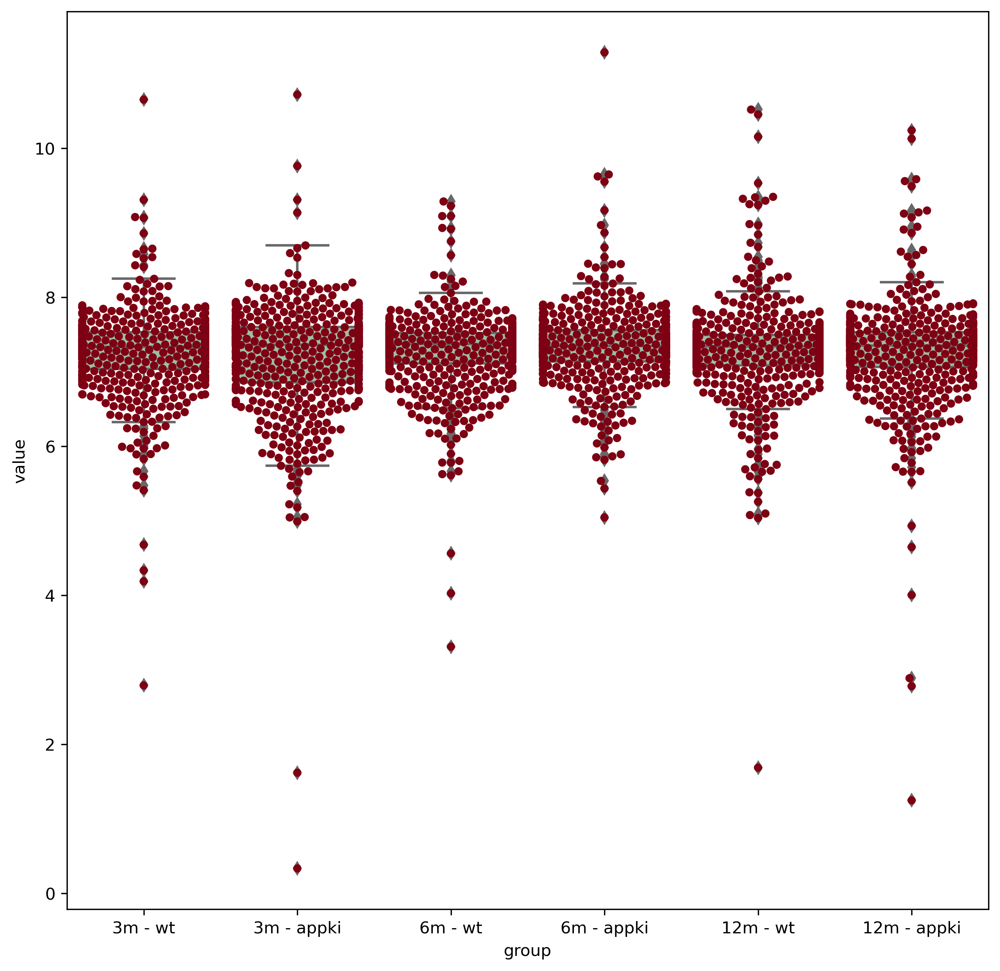

In [44]:
# generate a boxplot to see the data distribution
plt.figure(figsize=(10, 10))
ax = sns.boxplot(x='group', y='value', data=df_melt, color='#99c2a2')
ax = sns.swarmplot(x="group", y="value", data=df_melt, color='#7d0013')
plt.show()

In [45]:
# ANOVA table using bioinfokit v1.0.3 or later 
res = stat()
res.anova_stat(df=df_melt, res_var='value', anova_model='value ~ C(group)')
res.anova_summary
# output (ANOVA F and p value)

,df,sum_sq,mean_sq,F,PR(>F)
C(group),5.0,5.733798,1.146760,2.727041,0.018279
Residual,2976.0,1251.450311,0.420514,NaN,NaN


In [46]:
# perform multiple pairwise comparison (Tukey's HSD)
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='group', anova_model='value ~ C(group)')
res.tukey_summary

,group1,group2,Diff,Lower,Upper,q-value,p-value
0,3m - wt,3m - appki,0.061762,-0.055540,0.179064,2.123293,0.641857
1,3m - wt,6m - wt,0.017833,-0.099469,0.135135,0.613077,0.900000
2,3m - wt,6m - appki,0.085566,-0.031736,0.202868,2.941648,0.298061
3,3m - wt,12m - wt,0.029952,-0.087350,0.147254,1.029701,0.900000
4,3m - wt,12m - appki,0.001577,-0.115725,0.118879,0.054210,0.900000
5,3m - appki,6m - wt,0.079595,-0.037707,0.196897,2.736370,0.382169
6,3m - appki,6m - appki,0.147328,0.030026,0.264630,5.064941,0.004674
7,3m - appki,12m - wt,0.091714,-0.025588,0.209016,3.152993,0.224452
8,3m - appki,12m - appki,0.060185,-0.057117,0.177487,2.069083,0.663984
9,6m - wt,6m - appki,0.067733,-0.049569,0.185035,2.328571,0.558064


In [55]:
#create a new dataframe that contains renamed columns
df_pca = df2
df_pca.columns = ['3m wt', '3m wt', '3m wt', '3m wt', '3m wt', '3m appki', '3m appki', '3m appki', '3m appki', '3m appki', '6m wt', '6m wt', '6m wt', '6m wt', '6m wt', '6m appki', '6m appki', '6m appki', '6m appki', '6m appki', '12m wt', '12m wt', '12m wt',  '12m appki', '12m appki', '12m appki', '12m appki']
df_pca

,3m wt,3m wt,3m wt,3m wt,3m wt,3m appki,3m appki,3m appki,3m appki,3m appki,...,6m appki,6m appki,6m appki,12m wt,12m wt,12m wt,12m appki,12m appki,12m appki,12m appki
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,6.960917,7.223571,6.680968,7.372206,6.625830,6.818943,6.933935,6.650569,6.872895,6.959338,...,7.111033,6.999261,7.793632,7.996047,7.374076,7.447841,6.738171,7.366851,7.523368,7.483734
A0A075B5K2,6.963976,7.386083,7.855503,7.074820,6.362082,7.476073,6.509544,6.115199,6.762602,7.080379,...,7.853646,7.412716,7.764877,7.362789,7.004587,7.110585,7.179003,6.997819,7.454879,7.526132
A0A075B5K6,7.622107,6.486570,7.402371,7.210213,7.085818,6.778729,6.502124,6.812631,7.964447,6.770765,...,7.294188,7.616291,7.808241,7.600480,7.733654,7.545748,7.386685,7.863478,7.591581,7.799955
A0A075B5L1,6.696484,5.707511,6.776522,6.982538,6.911299,6.512075,7.140177,7.400713,6.993737,6.947813,...,8.318281,6.587548,7.185470,7.032729,7.524981,5.804853,6.416902,6.100169,7.786436,7.552065
A0A075B5L7,6.687803,6.917270,6.860866,7.385761,7.331405,7.552765,7.268135,7.025740,6.535389,7.293519,...,7.636530,7.549687,8.232694,7.605460,7.989802,8.068137,8.043998,7.352288,8.317210,8.104452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z1T2,7.776659,7.511955,7.831330,7.533358,7.552648,7.991441,7.341856,7.508248,7.796483,7.777604,...,7.151996,7.396329,7.536348,7.244764,7.425994,7.051450,7.256588,7.206921,7.215472,7.320819
Q9Z2K1,8.147797,7.282274,7.642445,7.663747,5.870746,5.220775,7.628021,7.269178,7.138725,5.415082,...,5.458750,8.053528,6.352069,5.656223,7.712666,7.257132,7.233114,6.797839,5.165064,4.814875
Q9Z2L6,7.571231,7.143885,7.389599,7.203968,7.957898,8.082607,7.440407,7.451354,7.489990,8.313589,...,7.749631,7.224447,7.486974,7.094242,7.066845,7.238508,7.457352,7.363830,7.281117,7.305454


In [56]:
#transpose the data and reset index
dfidgroup = df_pca.transpose()
dfidgroup2 = dfidgroup.reset_index()
dfidgroup2

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z0L8,Q9Z121,Q9Z126,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1
0,3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,...,7.429256,7.857479,6.877556,7.354349,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444
1,3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,...,7.397351,7.071329,5.077722,7.632111,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714
2,3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,...,7.445609,7.280410,6.364371,7.481286,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761
3,3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,...,7.259152,6.956156,8.934750,7.377963,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671
4,3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,...,7.445192,7.135605,4.987075,7.683251,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888
5,3m appki,6.818943,7.476073,6.778729,6.512075,7.552765,5.818746,6.205259,7.063958,7.359646,...,7.373593,7.784761,5.049366,7.714507,6.877758,7.991441,5.220775,8.082607,7.119780,7.341145
6,3m appki,6.933935,6.509544,6.502124,7.140177,7.268135,6.412059,6.843763,6.619875,5.633696,...,7.406617,6.800026,6.497555,7.632024,7.070997,7.341856,7.628021,7.440407,7.471962,7.442954
7,3m appki,6.650569,6.115199,6.812631,7.400713,7.025740,5.903441,6.755174,6.736355,5.528434,...,7.274629,6.552389,9.221203,7.430733,7.081943,7.508248,7.269178,7.451354,7.494750,7.335363
8,3m appki,6.872895,6.762602,7.964447,6.993737,6.535389,7.433901,8.400010,7.553207,6.399270,...,7.229492,6.795253,5.205347,7.452941,6.947013,7.796483,7.138725,7.489990,6.605044,7.697946
9,3m appki,6.959338,7.080379,6.770765,6.947813,7.293519,5.750123,7.302124,6.402537,7.029632,...,7.338479,7.014322,5.636752,7.335397,6.926397,7.777604,5.415082,8.313589,7.369308,7.463000


In [57]:
#create two new columns (age and genotype) after splitting the index by the space in between them
dfidgroup2[['age','genotype']] = dfidgroup2['index'].str.split(' ',expand=True)
dfidgroup2.head()

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z126,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,age,genotype
0,3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,...,6.877556,7.354349,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444,3m,wt
1,3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,...,5.077722,7.632111,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714,3m,wt
2,3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,...,6.364371,7.481286,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761,3m,wt
3,3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,...,8.934750,7.377963,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671,3m,wt
4,3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,...,4.987075,7.683251,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888,3m,wt


In [58]:
#Assign unique numbers based upon the age column
dfidgroup2['ageid'] = dfidgroup2.groupby(['age']).ngroup()
dfidgroup2

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,age,genotype,ageid
0,3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,...,7.354349,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444,3m,wt,1
1,3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,...,7.632111,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714,3m,wt,1
2,3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,...,7.481286,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761,3m,wt,1
3,3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,...,7.377963,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671,3m,wt,1
4,3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,...,7.683251,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888,3m,wt,1
5,3m appki,6.818943,7.476073,6.778729,6.512075,7.552765,5.818746,6.205259,7.063958,7.359646,...,7.714507,6.877758,7.991441,5.220775,8.082607,7.119780,7.341145,3m,appki,1
6,3m appki,6.933935,6.509544,6.502124,7.140177,7.268135,6.412059,6.843763,6.619875,5.633696,...,7.632024,7.070997,7.341856,7.628021,7.440407,7.471962,7.442954,3m,appki,1
7,3m appki,6.650569,6.115199,6.812631,7.400713,7.025740,5.903441,6.755174,6.736355,5.528434,...,7.430733,7.081943,7.508248,7.269178,7.451354,7.494750,7.335363,3m,appki,1
8,3m appki,6.872895,6.762602,7.964447,6.993737,6.535389,7.433901,8.400010,7.553207,6.399270,...,7.452941,6.947013,7.796483,7.138725,7.489990,6.605044,7.697946,3m,appki,1
9,3m appki,6.959338,7.080379,6.770765,6.947813,7.293519,5.750123,7.302124,6.402537,7.029632,...,7.335397,6.926397,7.777604,5.415082,8.313589,7.369308,7.463000,3m,appki,1


In [59]:
#Assign unique numbers based upon the genotype column
dfidgroup2['genotypeid'] = dfidgroup2.groupby(['genotype']).ngroup()
dfidgroup2

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,age,genotype,ageid,genotypeid
0,3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,...,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444,3m,wt,1,1
1,3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,...,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714,3m,wt,1,1
2,3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,...,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761,3m,wt,1,1
3,3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,...,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671,3m,wt,1,1
4,3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,...,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888,3m,wt,1,1
5,3m appki,6.818943,7.476073,6.778729,6.512075,7.552765,5.818746,6.205259,7.063958,7.359646,...,6.877758,7.991441,5.220775,8.082607,7.119780,7.341145,3m,appki,1,0
6,3m appki,6.933935,6.509544,6.502124,7.140177,7.268135,6.412059,6.843763,6.619875,5.633696,...,7.070997,7.341856,7.628021,7.440407,7.471962,7.442954,3m,appki,1,0
7,3m appki,6.650569,6.115199,6.812631,7.400713,7.025740,5.903441,6.755174,6.736355,5.528434,...,7.081943,7.508248,7.269178,7.451354,7.494750,7.335363,3m,appki,1,0
8,3m appki,6.872895,6.762602,7.964447,6.993737,6.535389,7.433901,8.400010,7.553207,6.399270,...,6.947013,7.796483,7.138725,7.489990,6.605044,7.697946,3m,appki,1,0
9,3m appki,6.959338,7.080379,6.770765,6.947813,7.293519,5.750123,7.302124,6.402537,7.029632,...,6.926397,7.777604,5.415082,8.313589,7.369308,7.463000,3m,appki,1,0


In [60]:
#set the index
dfidgroups = dfidgroup2.set_index('index')
dfidgroups

Master Protein,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,A0A075B5N3,...,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,age,genotype,ageid,genotypeid
index,,,,,,,,,,,,,,,,,,,,,
3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,6.994071,...,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444,3m,wt,1,1
3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,7.234925,...,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714,3m,wt,1,1
3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,7.382396,...,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761,3m,wt,1,1
3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,6.017614,...,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671,3m,wt,1,1
3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,6.722735,...,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888,3m,wt,1,1
3m appki,6.818943,7.476073,6.778729,6.512075,7.552765,5.818746,6.205259,7.063958,7.359646,6.930753,...,6.877758,7.991441,5.220775,8.082607,7.119780,7.341145,3m,appki,1,0
3m appki,6.933935,6.509544,6.502124,7.140177,7.268135,6.412059,6.843763,6.619875,5.633696,6.906333,...,7.070997,7.341856,7.628021,7.440407,7.471962,7.442954,3m,appki,1,0
3m appki,6.650569,6.115199,6.812631,7.400713,7.025740,5.903441,6.755174,6.736355,5.528434,7.261984,...,7.081943,7.508248,7.269178,7.451354,7.494750,7.335363,3m,appki,1,0
3m appki,6.872895,6.762602,7.964447,6.993737,6.535389,7.433901,8.400010,7.553207,6.399270,7.231894,...,6.947013,7.796483,7.138725,7.489990,6.605044,7.697946,3m,appki,1,0


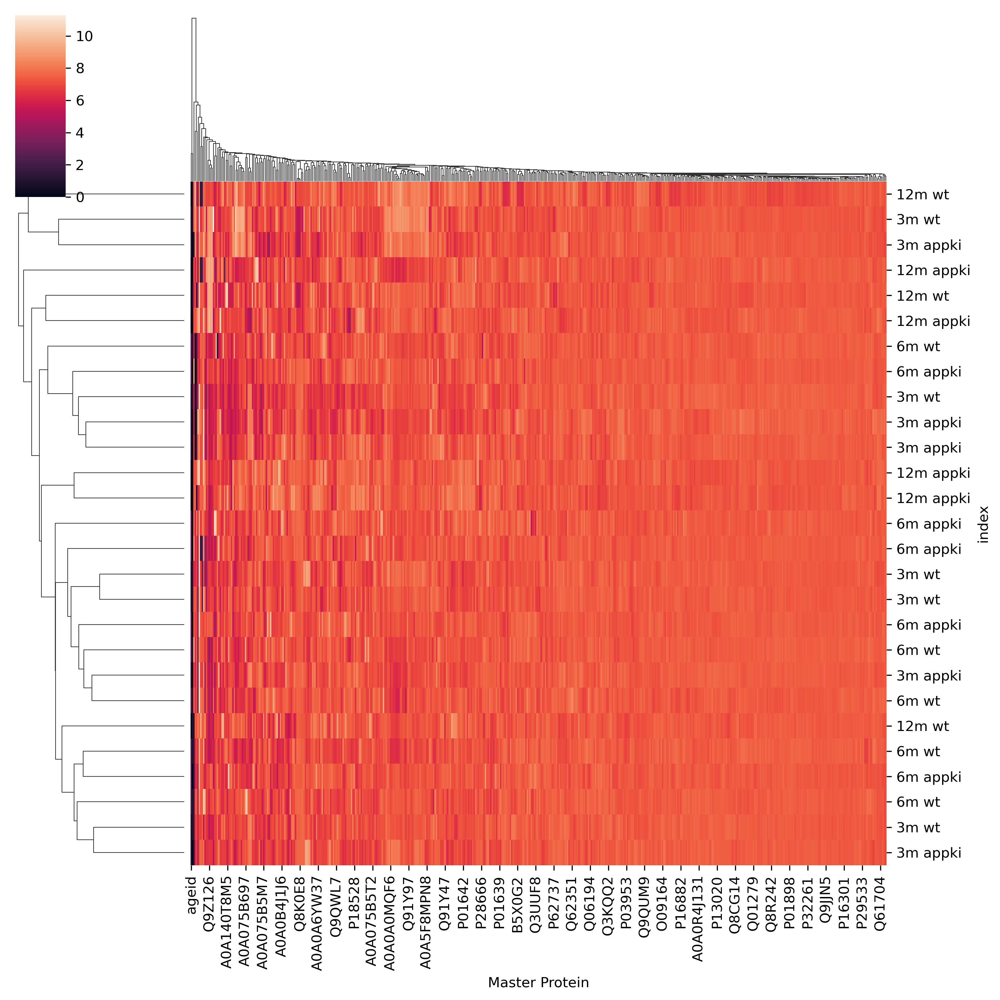

In [61]:
#delete the age and genotype columns
del dfidgroups['age']
del dfidgroups['genotype']
sns.clustermap(dfidgroups)

Text(0.5, 1.3, 'Hierarchical Clustering of WT and APPki Mouse Plasma Proteomics - No imputation')

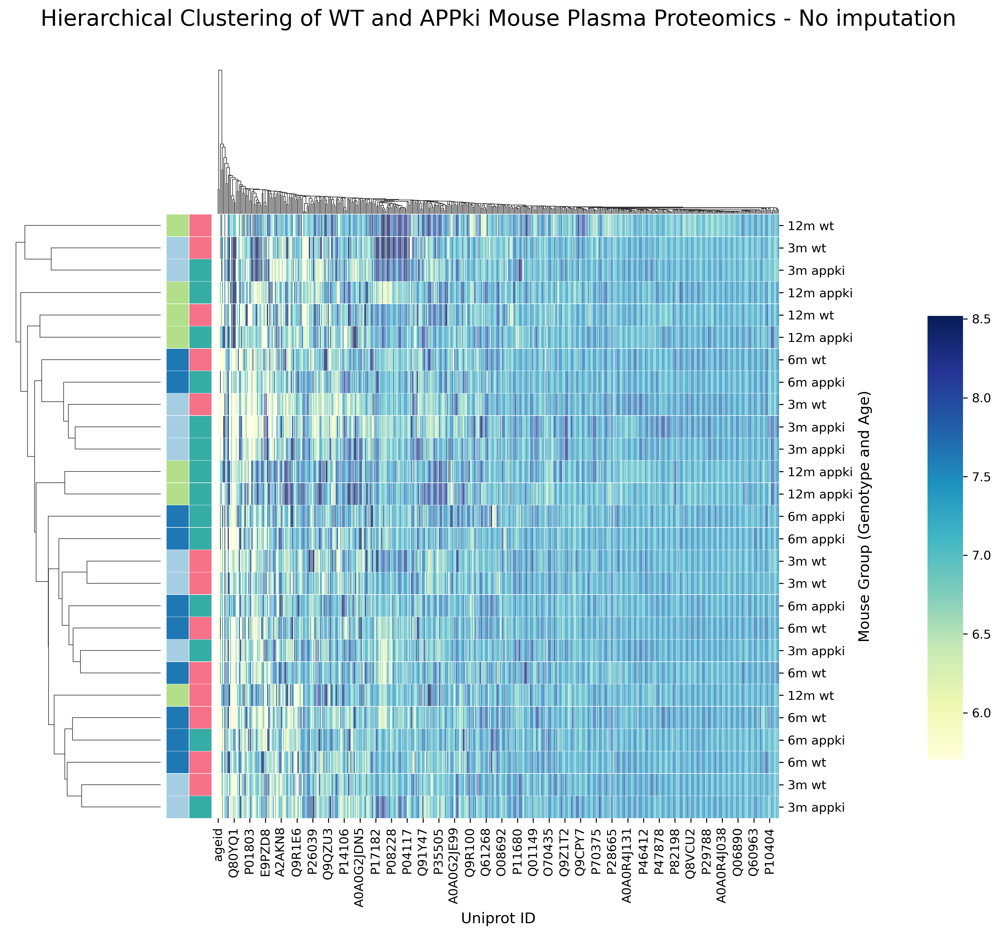

In [62]:
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.color_palette('Paired', len(dfidgroups.ageid.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(dfidgroups.ageid.unique(), network_pal))

#get the series of all of the categories
networks = dfidgroups.ageid

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors = pd.Series(networks).map(network_lut)

#create a second color palette with the same number of colors as unique values in the Source column
network_pal2 = sns.color_palette('husl', len(dfidgroups.genotypeid.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut2 = dict(zip(dfidgroups.genotypeid.unique(), network_pal2))

#get the series of all of the categories
networks2 = dfidgroups.genotypeid

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors2 = pd.Series(networks2).map(network_lut2)

#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column
g = sns.clustermap(dfidgroups, robust = True, cmap = "YlGnBu", linewidths=0.1, cbar_pos=(1.05, .2, .04, .5), row_colors=[network_colors, network_colors2])
ax = g.ax_heatmap
ax.set_xlabel("Uniprot ID", fontsize = 12)
ax.set_ylabel("Mouse Group (Genotype and Age)", fontsize = 12)
ax.set_title('Hierarchical Clustering of WT and APPki Mouse Plasma Proteomics - No imputation', y=1.3, fontsize = 18)

In [63]:
#Create a new transposed dataframe for PCA analysis
dfpcax = df_pca.transpose()
dfpcarx = dfpcax.reset_index()
dfpcarx

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z0L8,Q9Z121,Q9Z126,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1
0,3m wt,6.960917,6.963976,7.622107,6.696484,6.687803,7.056873,7.241895,7.150489,5.662964,...,7.429256,7.857479,6.877556,7.354349,7.102156,7.776659,8.147797,7.571231,2.790217,7.566444
1,3m wt,7.223571,7.386083,6.486570,5.707511,6.917270,6.241744,7.694640,6.915061,6.093708,...,7.397351,7.071329,5.077722,7.632111,7.108514,7.511955,7.282274,7.143885,7.427359,6.766714
2,3m wt,6.680968,7.855503,7.402371,6.776522,6.860866,6.844369,6.613603,6.241210,5.878353,...,7.445609,7.280410,6.364371,7.481286,7.212869,7.831330,7.642445,7.389599,2.779934,7.414761
3,3m wt,7.372206,7.074820,7.210213,6.982538,7.385761,5.666929,6.837074,6.498795,6.884795,...,7.259152,6.956156,8.934750,7.377963,6.996380,7.533358,7.663747,7.203968,7.127906,7.509671
4,3m wt,6.625830,6.362082,7.085818,6.911299,7.331405,5.914977,7.285993,6.850146,5.843773,...,7.445192,7.135605,4.987075,7.683251,7.189876,7.552648,5.870746,7.957898,7.185028,7.658888
5,3m appki,6.818943,7.476073,6.778729,6.512075,7.552765,5.818746,6.205259,7.063958,7.359646,...,7.373593,7.784761,5.049366,7.714507,6.877758,7.991441,5.220775,8.082607,7.119780,7.341145
6,3m appki,6.933935,6.509544,6.502124,7.140177,7.268135,6.412059,6.843763,6.619875,5.633696,...,7.406617,6.800026,6.497555,7.632024,7.070997,7.341856,7.628021,7.440407,7.471962,7.442954
7,3m appki,6.650569,6.115199,6.812631,7.400713,7.025740,5.903441,6.755174,6.736355,5.528434,...,7.274629,6.552389,9.221203,7.430733,7.081943,7.508248,7.269178,7.451354,7.494750,7.335363
8,3m appki,6.872895,6.762602,7.964447,6.993737,6.535389,7.433901,8.400010,7.553207,6.399270,...,7.229492,6.795253,5.205347,7.452941,6.947013,7.796483,7.138725,7.489990,6.605044,7.697946
9,3m appki,6.959338,7.080379,6.770765,6.947813,7.293519,5.750123,7.302124,6.402537,7.029632,...,7.338479,7.014322,5.636752,7.335397,6.926397,7.777604,5.415082,8.313589,7.369308,7.463000


In [64]:
#assign all protein values in dataframe to x
x = dfpcarx.iloc[:, 1: 498].values
#assign groups to y 
y = dfpcarx.loc[:,['index']].values

#view x and y values
x, y

(array([[6.96091654, 6.96397642, 7.62210739, ..., 7.57123134, 2.79021681,
         7.5664436 ],
        [7.22357118, 7.38608308, 6.48656957, ..., 7.14388501, 7.42735906,
         6.76671366],
        [6.68096783, 7.85550259, 7.40237148, ..., 7.38959905, 2.77993428,
         7.4147612 ],
        ...,
        [7.36685113, 6.99781947, 7.86347773, ..., 7.36383047, 7.34146266,
         7.43688815],
        [7.52336779, 7.45487931, 7.59158145, ..., 7.28111684, 7.53680016,
         7.65014065],
        [7.48373387, 7.52613241, 7.799955  , ..., 7.30545438, 7.35452149,
         7.41695989]]),
 array([['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m appki'],
        ['6m appki'],
        ['6m appki'],
        ['6m appki'],
        ['6m appki'],

Standardizing/Scaling the Data¶

There are probably better ways to do this such as assigning % to component axis of nonscaled data, but since PCA yields a feature subspace that maximizes the variance along the axes, it makes sense to standardize the data. Let us continue with the transformation of the data onto unit scale (mean=0 and variance=1), which is a requirement for the optimal performance of many machine learning algorithms. We can accomplish this using StandardScaler from sklearn

In [65]:
#Scale the data using Standardscaler from sklearn to remove  - this is important for PCA and machine learning processes
x = StandardScaler().fit_transform(x)
x

array([[-0.53118627, -0.59065293,  0.55941158, ...,  0.52233494,
        -2.06176415,  0.28698809],
       [-0.06501905,  0.0981995 , -1.95277409, ..., -0.92179769,
         0.51596214, -2.88423956],
       [-1.02804751,  0.86426363,  0.07328301, ..., -0.09145556,
        -2.06748008, -0.31448924],
       ...,
       [ 0.18927845, -0.53542313,  1.09340271, ..., -0.17853538,
         0.46821346, -0.22674763],
       [ 0.46706884,  0.21047077,  0.4918781 , ..., -0.45804978,
         0.576799  ,  0.61887812],
       [ 0.3967254 ,  0.3267515 ,  0.9528694 , ..., -0.37580586,
         0.47547269, -0.30577063]])

In [67]:
#Perform 2 component PCA analysis using sklearn
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf.head()

,principal component 1,principal component 2
0,-0.074439,10.953344
1,-4.190623,6.398469
2,-2.306288,6.860811
3,12.925943,15.294096
4,-12.535047,8.457640


In [68]:
#Merge x PCA analysis with y (groups) into a single dataframe
finalDf = pd.concat([principalDf, dfpcarx[['index']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,index
0,-0.074439,10.953344,3m wt
1,-4.190623,6.398469,3m wt
2,-2.306288,6.860811,3m wt
3,12.925943,15.294096,3m wt
4,-12.535047,8.457640,3m wt


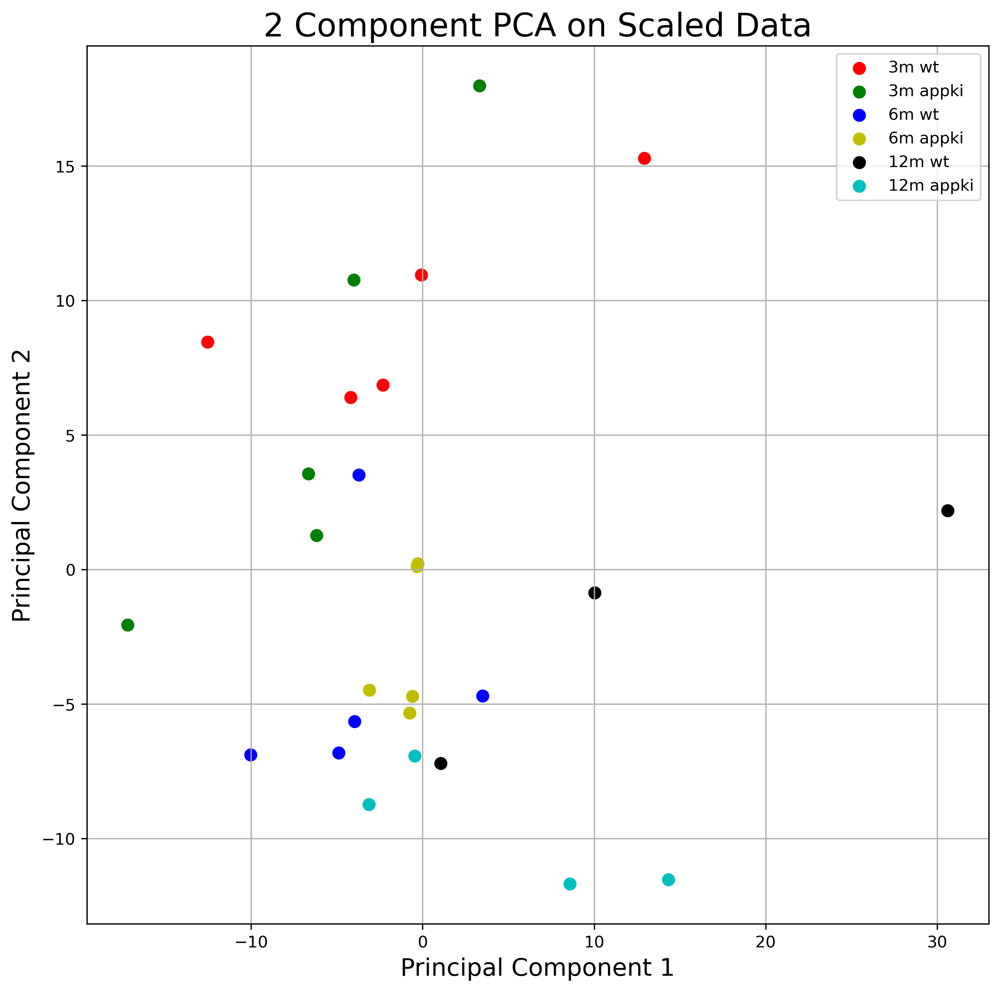

In [69]:
#Plot PCA dataframe
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA on Scaled Data', fontsize = 20)


targets = ['3m wt', '3m appki', '6m wt', '6m appki', '12m wt', '12m appki']
colors = ['r', 'g', 'b', 'y', 'k', 'c']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['index'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## Binary comparisons (no imputation)

Should be noted that I am still doing my binary statistics (f test, t test, FC, Log2FC) in excel... I have also not performed FDR correction yet...

In [193]:
#Import 3m group (both WT and APPki) as dataframe df3m, with Master Protein set to index column
df3mm = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Binary_Analyzed_3m2.xlsx', index_col=0) 

#View dataframe df3m
df3mm 

,protein,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
Q8C7G5,Q8C7G5,NaN,NaN,NaN,231.664708,233.866789,151.128715,NaN,NaN,NaN,142.480544,0.317458,0.002684,232.765748,146.804629,0.630697,-0.664981
A0A1Y7VJN6,A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902
P11438,P11438,182.281187,202.088726,184.153897,NaN,NaN,NaN,156.395500,157.179436,135.219239,NaN,0.870333,0.014032,189.507936,149.598058,0.789403,-0.341167
A0A0R4J1C6,A0A0R4J1C6,NaN,NaN,NaN,242.079369,224.512117,149.401529,NaN,NaN,NaN,126.723872,0.839181,0.021939,233.295743,138.062701,0.591793,-0.756836
A0A075B5Y4,A0A075B5Y4,246.178505,198.659600,225.066586,248.429999,259.791299,173.628624,186.264186,224.452961,139.214584,207.052973,0.574657,0.026054,235.625198,186.122666,0.789910,-0.340240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F8VQL0,F8VQL0,153.471969,NaN,170.065095,139.185015,114.231471,132.753263,NaN,NaN,178.067126,121.288357,0.669471,0.992385,144.238388,144.036249,0.998599,-0.002023
P14847,P14847,157.546046,159.987815,148.460496,155.805246,195.850748,186.761086,168.623625,152.578629,161.445163,147.727703,0.718735,0.992615,163.530070,163.427241,0.999371,-0.000907
Q69ZK7,Q69ZK7,NaN,NaN,NaN,217.040446,70.374593,114.665914,NaN,NaN,NaN,174.329136,0.491919,0.992944,143.707520,144.497525,1.005497,0.007909


In [194]:
del df3mm['protein']
df3mm.head()

,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,
Q8C7G5,NaN,NaN,NaN,231.664708,233.866789,151.128715,NaN,NaN,NaN,142.480544,0.317458,0.002684,232.765748,146.804629,0.630697,-0.664981
A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902
P11438,182.281187,202.088726,184.153897,NaN,NaN,NaN,156.395500,157.179436,135.219239,NaN,0.870333,0.014032,189.507936,149.598058,0.789403,-0.341167
A0A0R4J1C6,NaN,NaN,NaN,242.079369,224.512117,149.401529,NaN,NaN,NaN,126.723872,0.839181,0.021939,233.295743,138.062701,0.591793,-0.756836
A0A075B5Y4,246.178505,198.659600,225.066586,248.429999,259.791299,173.628624,186.264186,224.452961,139.214584,207.052973,0.574657,0.026054,235.625198,186.122666,0.789910,-0.340240


In [196]:
#Annotate the file with protein names
df3mmm = pd.merge(df3mm, proteinlist, left_index=True, right_index=True)
df3mmm

,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,
Q8C7G5,NaN,NaN,NaN,231.664708,233.866789,151.128715,NaN,NaN,NaN,142.480544,0.317458,0.002684,232.765748,146.804629,0.630697,-0.664981,Apoa5
A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902,Ighg3
P11438,182.281187,202.088726,184.153897,NaN,NaN,NaN,156.395500,157.179436,135.219239,NaN,0.870333,0.014032,189.507936,149.598058,0.789403,-0.341167,Lamp1
A0A0R4J1C6,NaN,NaN,NaN,242.079369,224.512117,149.401529,NaN,NaN,NaN,126.723872,0.839181,0.021939,233.295743,138.062701,0.591793,-0.756836,Btnl10
A0A075B5Y4,246.178505,198.659600,225.066586,248.429999,259.791299,173.628624,186.264186,224.452961,139.214584,207.052973,0.574657,0.026054,235.625198,186.122666,0.789910,-0.340240,Ighv1-81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F8VQL0,153.471969,NaN,170.065095,139.185015,114.231471,132.753263,NaN,NaN,178.067126,121.288357,0.669471,0.992385,144.238388,144.036249,0.998599,-0.002023,Met
P14847,157.546046,159.987815,148.460496,155.805246,195.850748,186.761086,168.623625,152.578629,161.445163,147.727703,0.718735,0.992615,163.530070,163.427241,0.999371,-0.000907,Crp
Q69ZK7,NaN,NaN,NaN,217.040446,70.374593,114.665914,NaN,NaN,NaN,174.329136,0.491919,0.992944,143.707520,144.497525,1.005497,0.007909,Fam214a


In [198]:
#replace nan with 0
df3mmmm = df3mmm.fillna(0)
df3mmmm.head()

,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,
Q8C7G5,0.000000,0.000000,0.000000,231.664708,233.866789,151.128715,0.000000,0.000000,0.000000,142.480544,0.317458,0.002684,232.765748,146.804629,0.630697,-0.664981,Apoa5
A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902,Ighg3
P11438,182.281187,202.088726,184.153897,0.000000,0.000000,0.000000,156.395500,157.179436,135.219239,0.000000,0.870333,0.014032,189.507936,149.598058,0.789403,-0.341167,Lamp1
A0A0R4J1C6,0.000000,0.000000,0.000000,242.079369,224.512117,149.401529,0.000000,0.000000,0.000000,126.723872,0.839181,0.021939,233.295743,138.062701,0.591793,-0.756836,Btnl10
A0A075B5Y4,246.178505,198.659600,225.066586,248.429999,259.791299,173.628624,186.264186,224.452961,139.214584,207.052973,0.574657,0.026054,235.625198,186.122666,0.789910,-0.340240,Ighv1-81


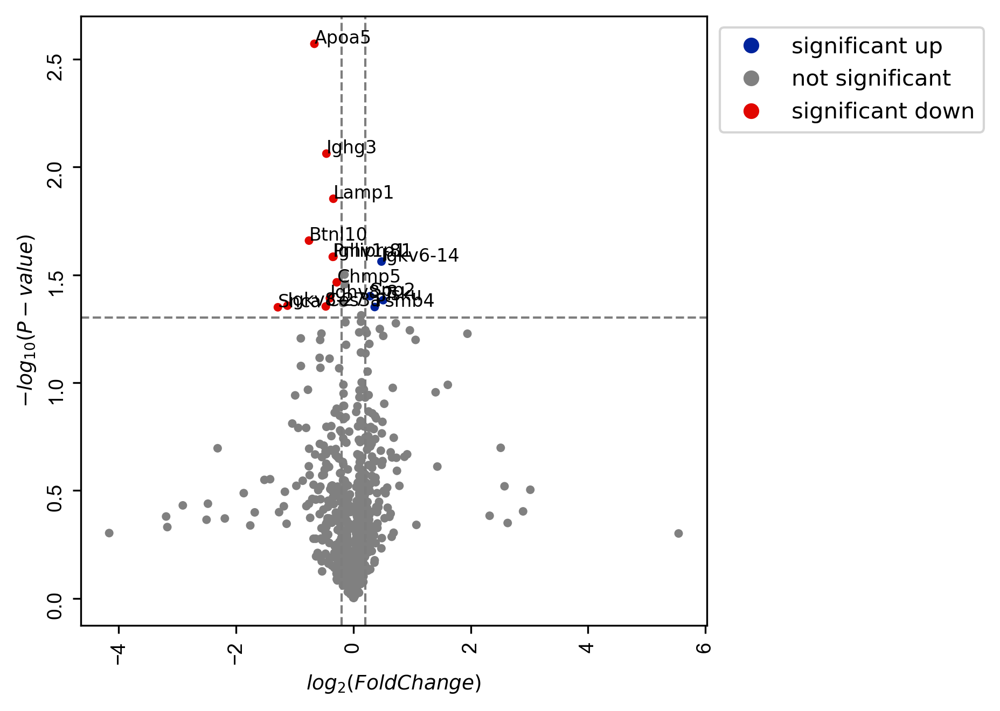

In [199]:
#Visualize binary comparison of 3m group (WT vs APPki)
visuz.gene_exp.volcano(df=df3mmmm, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1), r=1200)

In [202]:
#Import 6m group
dfc = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Binary_Analyzed_6m2.xlsx', index_col=0, na_values=0) 
dfc

,protein,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
P01865,P01865,130.669116,175.279088,110.214051,123.294714,115.610553,223.978926,197.112767,197.024850,176.933782,205.590113,0.433360,0.001073,131.013504,200.128088,1.527538,0.611208
D3YXF5,D3YXF5,165.408019,152.684957,173.131483,154.128175,144.053726,174.224573,197.808788,190.604473,197.087328,187.551195,0.737836,0.001459,157.881272,189.455271,1.199986,0.263017
G3X9H5,G3X9H5,NaN,NaN,190.289449,190.564775,NaN,161.082877,NaN,NaN,163.427574,NaN,0.148828,0.001751,190.427112,162.255226,0.852059,-0.230974
Q80YC5,Q80YC5,174.793430,191.047624,177.065955,183.247903,167.863469,163.051123,163.074437,149.647172,149.963740,156.334921,0.599428,0.001874,178.803676,156.414278,0.874782,-0.193004
P00687,P00687,184.337998,191.049187,190.713914,189.819270,174.573160,151.826721,169.165125,164.800989,132.401880,162.790120,0.177105,0.003463,186.098706,156.196967,0.839323,-0.252702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z0Z4,Q9Z0Z4,148.945047,219.722286,NaN,NaN,108.555561,NaN,134.776678,195.803741,NaN,147.484525,0.493316,0.994376,159.074298,159.354981,1.001764,0.002543
Q61982,Q61982,176.714143,261.219311,NaN,NaN,123.135440,NaN,209.886597,144.122596,NaN,206.171076,0.439454,0.995118,187.022965,186.726756,0.998416,-0.002287
O88968,O88968,89.328008,152.234864,166.733726,163.855474,128.898554,196.939571,90.538644,146.518841,172.195917,95.524841,0.484545,0.995932,140.210125,140.343563,1.000952,0.001372


In [203]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfc = pd.merge(dfc, proteinlist, left_index=True, right_index=True)

#Export dataframe to csv with index
dfc.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/6m_Proteinlist.csv')

In [204]:
#replace nan with 0
dfcn = dfc.fillna(0)

dfcn

,protein,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,,
P01865,P01865,130.669116,175.279088,110.214051,123.294714,115.610553,223.978926,197.112767,197.024850,176.933782,205.590113,0.433360,0.001073,131.013504,200.128088,1.527538,0.611208,Igh-1a
D3YXF5,D3YXF5,165.408019,152.684957,173.131483,154.128175,144.053726,174.224573,197.808788,190.604473,197.087328,187.551195,0.737836,0.001459,157.881272,189.455271,1.199986,0.263017,C7
G3X9H5,G3X9H5,0.000000,0.000000,190.289449,190.564775,0.000000,161.082877,0.000000,0.000000,163.427574,0.000000,0.148828,0.001751,190.427112,162.255226,0.852059,-0.230974,Htt
Q80YC5,Q80YC5,174.793430,191.047624,177.065955,183.247903,167.863469,163.051123,163.074437,149.647172,149.963740,156.334921,0.599428,0.001874,178.803676,156.414278,0.874782,-0.193004,F12
P00687,P00687,184.337998,191.049187,190.713914,189.819270,174.573160,151.826721,169.165125,164.800989,132.401880,162.790120,0.177105,0.003463,186.098706,156.196967,0.839323,-0.252702,Amy1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z0Z4,Q9Z0Z4,148.945047,219.722286,0.000000,0.000000,108.555561,0.000000,134.776678,195.803741,0.000000,147.484525,0.493316,0.994376,159.074298,159.354981,1.001764,0.002543,Heph
Q61982,Q61982,176.714143,261.219311,0.000000,0.000000,123.135440,0.000000,209.886597,144.122596,0.000000,206.171076,0.439454,0.995118,187.022965,186.726756,0.998416,-0.002287,Notch3
O88968,O88968,89.328008,152.234864,166.733726,163.855474,128.898554,196.939571,90.538644,146.518841,172.195917,95.524841,0.484545,0.995932,140.210125,140.343563,1.000952,0.001372,Tcn2


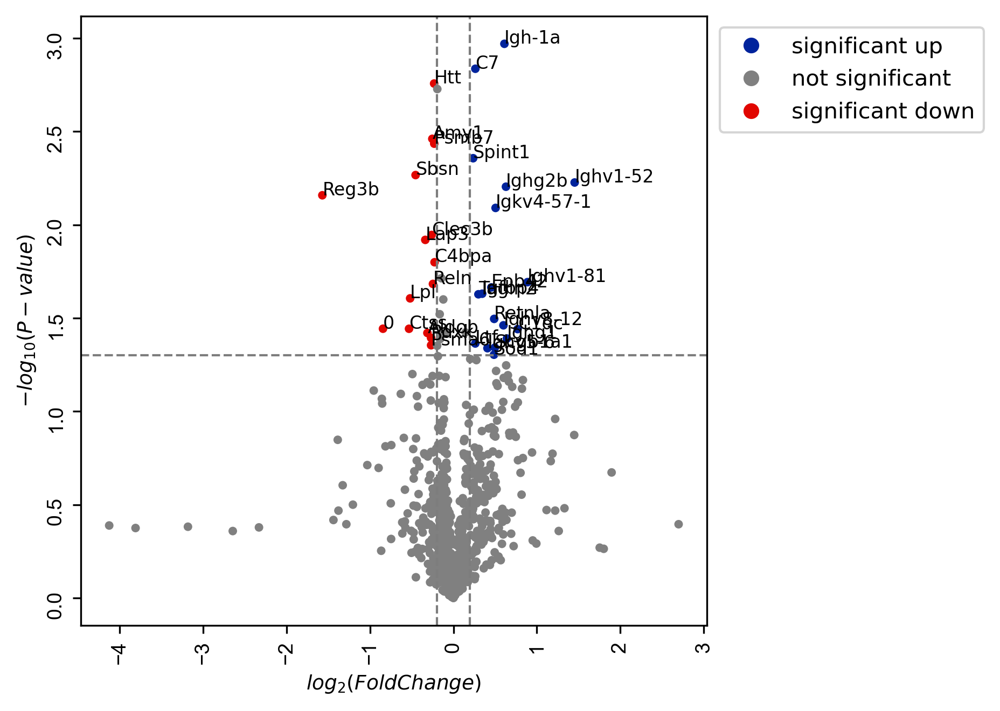

In [205]:
#Visualize 6m group
visuz.gene_exp.volcano(df=dfcn, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1))


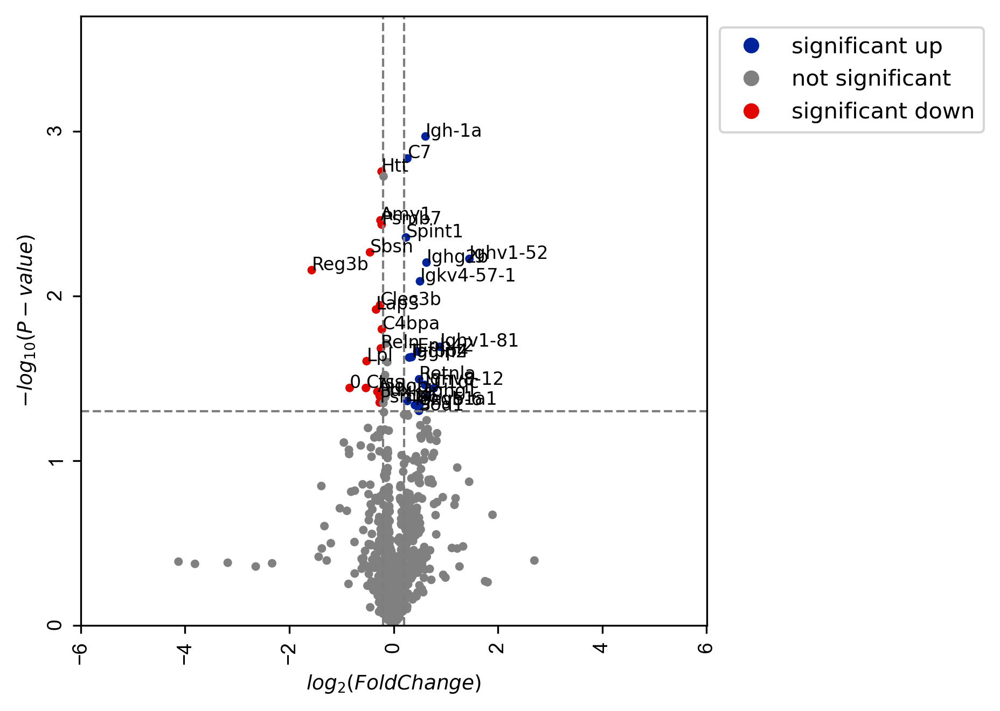

In [206]:
#Visualize binary comparison of 6m group (WT vs APPki) - normalized (changing the axis)
visuz.gene_exp.volcano(df=dfcn, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, xlm=(-6,6.01,2), ylm=(0,3.7,1), gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1))

In [207]:
#Import 12m group as dfb
dfb = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Binary_Analyzed_12m3.xlsx', index_col=0, na_values=0) 
dfb

,protein,12m - wt1,12m - wt2,12m - wt3,12m - appki1,12m - appki2,12m - appki3,12m - appki4,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
index,,,,,,,,,,,,,,
P07361,P07361,103.264741,91.592843,119.163850,210.481091,216.975002,199.508772,185.639761,0.919878,0.000234,104.673811,203.151157,1.940802,0.956653
P10493,P10493,204.224121,227.156747,184.397651,147.044437,149.800317,133.490678,131.329278,0.210334,0.002650,205.259506,140.416177,0.684091,-0.547740
Q8BH35,Q8BH35,128.980801,144.434072,135.707713,161.708060,184.174901,166.502662,163.483776,0.759671,0.006123,136.374195,168.967350,1.238998,0.309174
B8JJN0,B8JJN0,136.993875,144.224944,153.856395,171.961527,173.591581,173.086520,157.072912,0.857906,0.012109,145.025071,168.928135,1.164820,0.220107
Q9QUK9,Q9QUK9,171.755772,207.071064,199.693540,167.160436,138.908767,139.608529,144.721973,0.570107,0.012820,192.840125,147.599926,0.765400,-0.385713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F6WR04,F6WR04,113.752217,209.591409,198.725611,204.235789,219.836945,135.577724,138.386627,0.730856,0.989819,174.023079,174.509271,1.002794,0.004025
A0A140T8M3,A0A140T8M3,250.760830,155.890224,135.177326,174.025172,111.089247,242.071660,193.111360,0.786952,0.990714,180.609460,180.074360,0.997037,-0.004281
A0A140T8N4,A0A140T8N4,141.870256,166.917439,210.892485,124.421739,136.495775,165.812891,267.916494,0.462215,0.992156,173.226727,173.661725,1.002511,0.003618


In [208]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfb = pd.merge(dfb, proteinlist, left_index=True, right_index=True)

#Export dataframe to csv with index
dfb.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/12m_Proteinlist.csv')

#replace nan with 0
dfbb = dfb.fillna(0)

dfbb

,protein,12m - wt1,12m - wt2,12m - wt3,12m - appki1,12m - appki2,12m - appki3,12m - appki4,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
P07361,P07361,103.264741,91.592843,119.163850,210.481091,216.975002,199.508772,185.639761,0.919878,0.000234,104.673811,203.151157,1.940802,0.956653,Orm2
P10493,P10493,204.224121,227.156747,184.397651,147.044437,149.800317,133.490678,131.329278,0.210334,0.002650,205.259506,140.416177,0.684091,-0.547740,Nid1
Q8BH35,Q8BH35,128.980801,144.434072,135.707713,161.708060,184.174901,166.502662,163.483776,0.759671,0.006123,136.374195,168.967350,1.238998,0.309174,C8b
B8JJN0,B8JJN0,136.993875,144.224944,153.856395,171.961527,173.591581,173.086520,157.072912,0.857906,0.012109,145.025071,168.928135,1.164820,0.220107,Gm20547
Q9QUK9,Q9QUK9,171.755772,207.071064,199.693540,167.160436,138.908767,139.608529,144.721973,0.570107,0.012820,192.840125,147.599926,0.765400,-0.385713,Try5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F6WR04,F6WR04,113.752217,209.591409,198.725611,204.235789,219.836945,135.577724,138.386627,0.730856,0.989819,174.023079,174.509271,1.002794,0.004025,Ctss
A0A140T8M3,A0A140T8M3,250.760830,155.890224,135.177326,174.025172,111.089247,242.071660,193.111360,0.786952,0.990714,180.609460,180.074360,0.997037,-0.004281,Igkv8-30
A0A140T8N4,A0A140T8N4,141.870256,166.917439,210.892485,124.421739,136.495775,165.812891,267.916494,0.462215,0.992156,173.226727,173.661725,1.002511,0.003618,Igkv5-37
Q07968,Q07968,104.925822,124.211746,161.855406,122.884902,90.472639,160.133168,148.544084,0.998150,0.994138,130.330992,130.508698,1.001364,0.001966,F13b


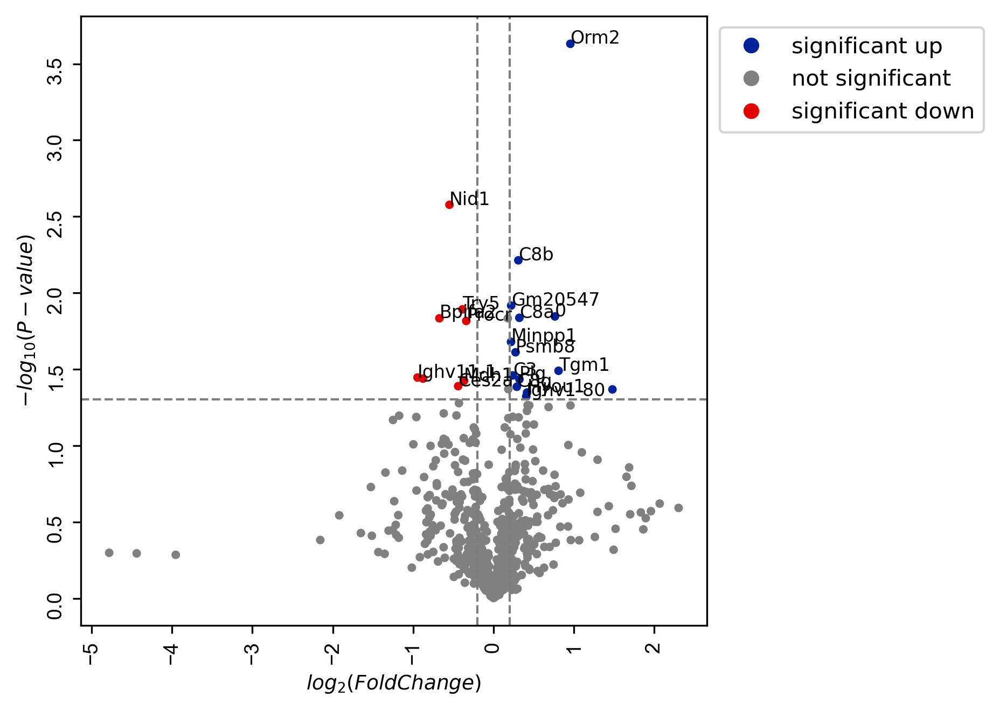

In [209]:
#Visualize 12m group
visuz.gene_exp.volcano(df=dfbb, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1))


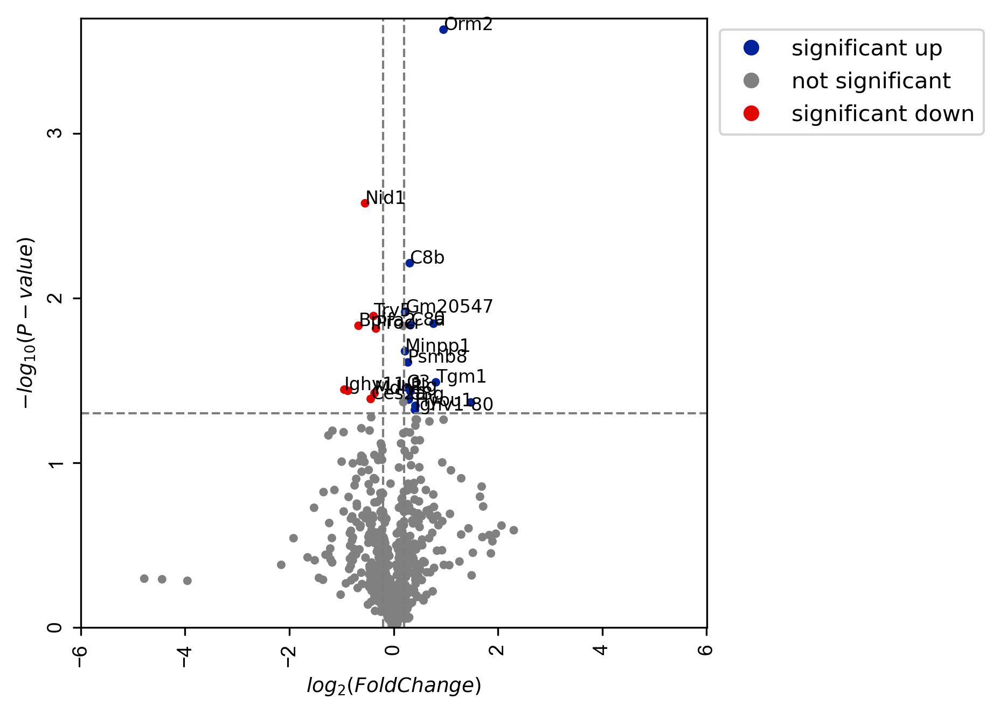

In [210]:
#Visualize binary comparison of 12m group (WT vs APPki) - normalized
visuz.gene_exp.volcano(df=dfbb, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), r=1200, plotlegend=True, xlm=(-6,6.01,2), ylm=(0,3.7,1), gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1))

## Comparing 3m vs 6m - WT and appki 

In [211]:
#import 3m vs 6m WT
dfwt3m6m = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/wt3m6m.xlsx', index_col=0, na_values=0)
dfwt3m6m

,protein,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Unnamed: 18
Master Protein,,,,,,,,,,,,,,,,,,
P49182,P49182,157.060591,166.430679,164.766291,156.264955,199.132663,189.388582,205.840804,187.408332,203.206631,205.116591,0.502167,0.000041,161.130629,198.348934,1.230982,0.299810,NaN
Q921I1,Q921I1,155.368710,160.042551,151.477519,148.794099,170.045530,170.344487,175.647259,178.537589,174.837349,174.591585,0.402190,0.000049,153.920720,174.000633,1.130456,0.176905,NaN
P00687,P00687,148.871968,168.404904,156.352404,159.572076,190.678750,184.337998,191.049187,190.713914,189.819270,174.573160,0.628432,0.000264,158.300338,186.862047,1.180427,0.239309,NaN
F7BAE9,F7BAE9,159.726589,162.681129,154.566693,153.264929,167.250169,166.644098,165.888746,168.521915,170.666405,177.769653,0.927772,0.003065,157.559835,169.456831,1.075508,0.105018,NaN
P16294,P16294,139.376260,163.703262,148.744318,116.823059,178.357738,187.219752,190.278102,166.469210,179.346938,210.874738,0.555348,0.004108,142.161725,185.424413,1.304320,0.383298,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q8R1E9,Q8R1E9,98.355890,NaN,128.349686,NaN,NaN,98.506194,NaN,NaN,NaN,127.987244,0.989023,0.996433,113.352788,113.246719,0.999064,-0.001351,NaN
P02772,P02772,151.594400,NaN,140.073690,211.391198,185.949129,105.818164,112.399319,NaN,NaN,267.440157,0.421176,0.996625,167.686429,167.901692,1.001284,0.001851,NaN
A0A0A6YWC7,A0A0A6YWC7,129.430179,NaN,134.188161,106.396966,85.058958,103.803340,108.469749,NaN,NaN,196.509185,0.166170,0.996945,123.338435,123.460308,1.000988,0.001425,NaN


In [212]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfwt3m6m = pd.merge(dfwt3m6m, proteinlist, left_index=True, right_index=True)

#replace nan with 0
dfwt3m6mm = dfwt3m6m.fillna(0)

dfwt3m6mm

,protein,3m - wt1,3m - wt2,3m - wt3,3m - wt4,3m - wt5,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Unnamed: 18,Protein
Master Protein,,,,,,,,,,,,,,,,,,,
P49182,P49182,157.060591,166.430679,164.766291,156.264955,199.132663,189.388582,205.840804,187.408332,203.206631,205.116591,0.502167,0.000041,161.130629,198.348934,1.230982,0.299810,0.0,Serpind1
Q921I1,Q921I1,155.368710,160.042551,151.477519,148.794099,170.045530,170.344487,175.647259,178.537589,174.837349,174.591585,0.402190,0.000049,153.920720,174.000633,1.130456,0.176905,0.0,Tf
P00687,P00687,148.871968,168.404904,156.352404,159.572076,190.678750,184.337998,191.049187,190.713914,189.819270,174.573160,0.628432,0.000264,158.300338,186.862047,1.180427,0.239309,0.0,Amy1
F7BAE9,F7BAE9,159.726589,162.681129,154.566693,153.264929,167.250169,166.644098,165.888746,168.521915,170.666405,177.769653,0.927772,0.003065,157.559835,169.456831,1.075508,0.105018,0.0,Trf
P16294,P16294,139.376260,163.703262,148.744318,116.823059,178.357738,187.219752,190.278102,166.469210,179.346938,210.874738,0.555348,0.004108,142.161725,185.424413,1.304320,0.383298,0.0,F9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q8R1E9,Q8R1E9,98.355890,0.000000,128.349686,0.000000,0.000000,98.506194,0.000000,0.000000,0.000000,127.987244,0.989023,0.996433,113.352788,113.246719,0.999064,-0.001351,0.0,Scgb2b27
P02772,P02772,151.594400,0.000000,140.073690,211.391198,185.949129,105.818164,112.399319,0.000000,0.000000,267.440157,0.421176,0.996625,167.686429,167.901692,1.001284,0.001851,0.0,Afp
A0A0A6YWC7,A0A0A6YWC7,129.430179,0.000000,134.188161,106.396966,85.058958,103.803340,108.469749,0.000000,0.000000,196.509185,0.166170,0.996945,123.338435,123.460308,1.000988,0.001425,0.0,Ighv5-15


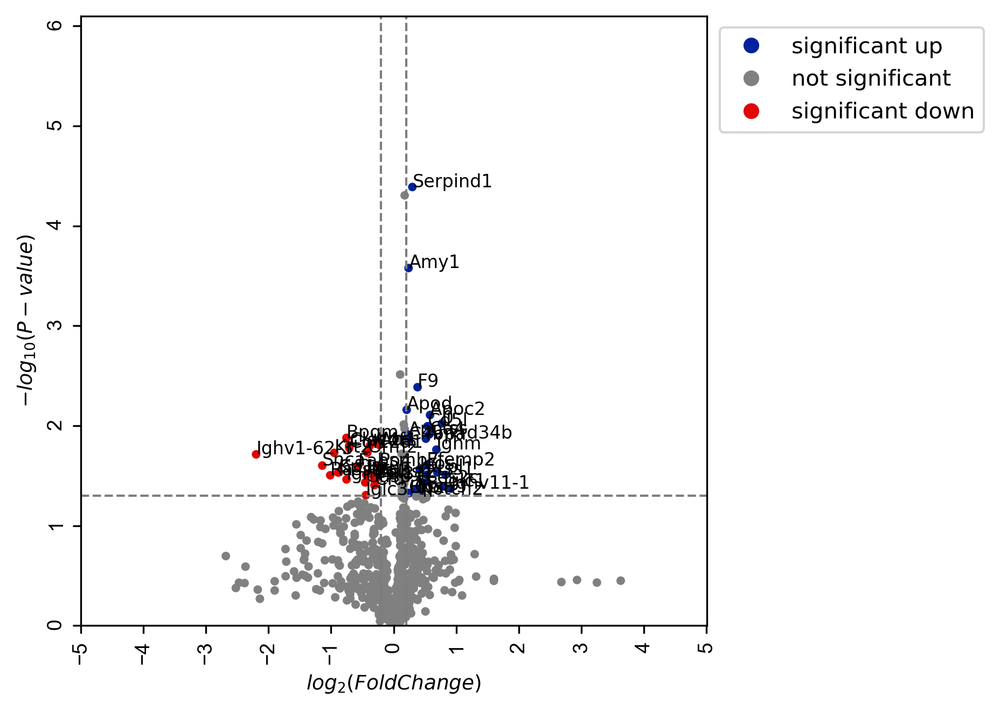

In [213]:
#Visualize 3m vs 6m WT
visuz.gene_exp.volcano(df=dfwt3m6mm, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, legendpos='upper right',  xlm=(-5,5.01,1), ylm=(0,6.1,1),
    legendanchor=(1.46,1))

In [214]:
#import 3m vs 6m appki
dfappki3m6m = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/appki3m6m.xlsx', index_col=0, na_values=0)
dfappki3m6m

,protein,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
E9PZD8,E9PZD8,293.342310,268.481297,343.360049,336.271989,288.754493,79.624544,127.546471,106.074654,88.415010,65.599888,0.581257,0.000002,306.042028,93.452113,0.305357,-1.711431
O08689,O08689,240.046015,203.567601,279.728469,243.475740,241.307305,127.300243,149.554822,162.906346,145.111179,116.664248,0.474934,0.000119,241.625026,140.307368,0.580682,-0.784179
Q8K1I3,Q8K1I3,223.466550,209.211379,246.684451,228.732232,252.364063,133.790008,150.529528,154.108803,131.434257,180.822173,0.818492,0.000122,232.091735,150.136954,0.646886,-0.628416
P01865,P01865,97.761099,91.915232,115.284095,132.433294,153.600885,223.978926,197.112767,197.024850,176.933782,205.590113,0.457166,0.000323,118.198921,200.128088,1.693146,0.759707
D3YZ61,D3YZ61,369.881730,213.275471,278.495693,276.596216,325.412540,139.989713,138.077421,109.842858,72.566196,39.198303,0.577358,0.000364,292.732330,99.934898,0.341387,-1.550522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9JHI0,Q9JHI0,295.211038,149.022851,114.089258,NaN,146.281509,173.692901,NaN,213.935909,138.778819,NaN,0.365335,0.989891,176.151164,175.469210,0.996129,-0.005596
Q9Z2U0,Q9Z2U0,139.080826,177.535300,180.361788,97.345615,165.341787,254.057414,130.485711,192.965840,172.838089,6.933033,0.083774,0.991626,151.933063,151.456017,0.996860,-0.004537
P49722,P49722,138.301824,208.958127,194.375488,NaN,161.067106,143.740649,NaN,207.587405,175.062565,NaN,0.931328,0.993403,175.675636,175.463540,0.998793,-0.001743


In [215]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfappki3m6m = pd.merge(dfappki3m6m, proteinlist, left_index=True, right_index=True)

#replace nan with 0
dfappki3m6mm = dfappki3m6m.fillna(0)

dfappki3m6mm

,protein,3m - appki1,3m - appki2,3m - appki3,3m - appki4,3m - appki5,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,,
E9PZD8,E9PZD8,293.342310,268.481297,343.360049,336.271989,288.754493,79.624544,127.546471,106.074654,88.415010,65.599888,0.581257,0.000002,306.042028,93.452113,0.305357,-1.711431,Cp
O08689,O08689,240.046015,203.567601,279.728469,243.475740,241.307305,127.300243,149.554822,162.906346,145.111179,116.664248,0.474934,0.000119,241.625026,140.307368,0.580682,-0.784179,Mstn
Q8K1I3,Q8K1I3,223.466550,209.211379,246.684451,228.732232,252.364063,133.790008,150.529528,154.108803,131.434257,180.822173,0.818492,0.000122,232.091735,150.136954,0.646886,-0.628416,Spp2
P01865,P01865,97.761099,91.915232,115.284095,132.433294,153.600885,223.978926,197.112767,197.024850,176.933782,205.590113,0.457166,0.000323,118.198921,200.128088,1.693146,0.759707,Igh-1a
D3YZ61,D3YZ61,369.881730,213.275471,278.495693,276.596216,325.412540,139.989713,138.077421,109.842858,72.566196,39.198303,0.577358,0.000364,292.732330,99.934898,0.341387,-1.550522,C1qtnf3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9JHI0,Q9JHI0,295.211038,149.022851,114.089258,0.000000,146.281509,173.692901,0.000000,213.935909,138.778819,0.000000,0.365335,0.989891,176.151164,175.469210,0.996129,-0.005596,Mmp19
Q9Z2U0,Q9Z2U0,139.080826,177.535300,180.361788,97.345615,165.341787,254.057414,130.485711,192.965840,172.838089,6.933033,0.083774,0.991626,151.933063,151.456017,0.996860,-0.004537,Psma7
P49722,P49722,138.301824,208.958127,194.375488,0.000000,161.067106,143.740649,0.000000,207.587405,175.062565,0.000000,0.931328,0.993403,175.675636,175.463540,0.998793,-0.001743,Psma2


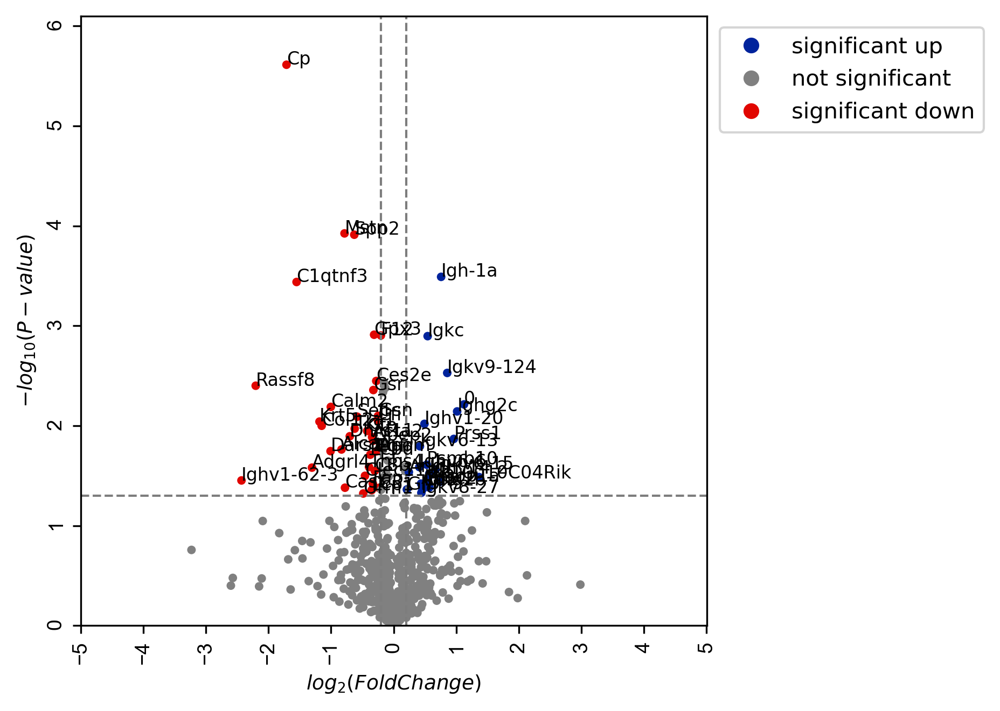

In [216]:
#Visualize 3m vs 6m appki
visuz.gene_exp.volcano(df=dfappki3m6mm, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, xlm=(-5,5.01,1), ylm=(0,6.1,1), legendpos='upper right', 
    legendanchor=(1.46,1))

## Comparing 6m to 12m - wt and appki

In [217]:
#import 6mm vs 12m wt
dfwt6m12m = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/wt6mvs12m.xlsx', index_col=0, na_values=0)
dfwt6m12m

,protein,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,12m - wt1,12m - wt2,12m - wt3,Unnamed: 10,Unnamed: 11,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
A0A075B5M7,A0A075B5M7,111.460404,163.454770,79.922826,134.544725,173.984290,335.309128,471.471854,354.812357,NaN,NaN,0.247807,0.000582,132.673403,387.197780,2.918428,1.545191
P11152,P11152,252.227491,229.841838,298.537865,231.277495,324.695568,148.947744,149.140751,154.614996,NaN,NaN,0.011458,0.003420,267.316051,150.901164,0.564505,-0.824943
P01865,P01865,130.669116,175.279088,110.214051,123.294714,115.610553,218.408731,204.516381,194.163082,NaN,NaN,0.376997,0.003751,131.013504,205.696065,1.570037,0.650799
Q9ET66,Q9ET66,168.754924,192.246967,180.531184,176.083635,200.321605,154.934651,131.119419,140.327088,NaN,NaN,0.950961,0.003842,183.587663,142.127053,0.774165,-0.369288
P70428,P70428,192.910049,189.849585,185.521666,177.576811,187.529563,162.049391,166.416510,140.140658,NaN,NaN,0.127311,0.004381,186.677535,156.202186,0.836749,-0.257134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A075B677,A0A075B677,315.008180,131.486302,121.710332,177.652515,157.337533,294.801958,108.956129,140.266810,NaN,NaN,0.611622,0.991429,180.638972,181.341632,1.003890,0.005601
P01636,P01636,155.482881,138.361838,106.251253,119.381494,241.329303,133.948648,160.582201,161.397310,NaN,NaN,0.161641,0.995625,152.161354,151.976053,0.998782,-0.001758
A0A140T8M4,A0A140T8M4,97.897230,191.255512,104.437043,306.850422,139.364348,142.823415,192.069217,169.695575,NaN,NaN,0.154745,0.996560,167.960911,168.196069,1.001400,0.002018


In [218]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfwt6m12m = pd.merge(dfwt6m12m, proteinlist, left_index=True, right_index=True)

#replace nan with 0
dfwt6m12mm = dfwt6m12m.fillna(0)

dfwt6m12mm

,protein,6m - wt1,6m - wt2,6m - wt3,6m - wt4,6m - wt5,12m - wt1,12m - wt2,12m - wt3,Unnamed: 10,Unnamed: 11,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,,
A0A075B5M7,A0A075B5M7,111.460404,163.454770,79.922826,134.544725,173.984290,335.309128,471.471854,354.812357,0.0,0.0,0.247807,0.000582,132.673403,387.197780,2.918428,1.545191,Igkv5-39
P11152,P11152,252.227491,229.841838,298.537865,231.277495,324.695568,148.947744,149.140751,154.614996,0.0,0.0,0.011458,0.003420,267.316051,150.901164,0.564505,-0.824943,Lpl
P01865,P01865,130.669116,175.279088,110.214051,123.294714,115.610553,218.408731,204.516381,194.163082,0.0,0.0,0.376997,0.003751,131.013504,205.696065,1.570037,0.650799,Igh-1a
Q9ET66,Q9ET66,168.754924,192.246967,180.531184,176.083635,200.321605,154.934651,131.119419,140.327088,0.0,0.0,0.950961,0.003842,183.587663,142.127053,0.774165,-0.369288,Pi16
P70428,P70428,192.910049,189.849585,185.521666,177.576811,187.529563,162.049391,166.416510,140.140658,0.0,0.0,0.127311,0.004381,186.677535,156.202186,0.836749,-0.257134,Ext2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A075B677,A0A075B677,315.008180,131.486302,121.710332,177.652515,157.337533,294.801958,108.956129,140.266810,0.0,0.0,0.611622,0.991429,180.638972,181.341632,1.003890,0.005601,Igkv4-53
P01636,P01636,155.482881,138.361838,106.251253,119.381494,241.329303,133.948648,160.582201,161.397310,0.0,0.0,0.161641,0.995625,152.161354,151.976053,0.998782,-0.001758,0
A0A140T8M4,A0A140T8M4,97.897230,191.255512,104.437043,306.850422,139.364348,142.823415,192.069217,169.695575,0.0,0.0,0.154745,0.996560,167.960911,168.196069,1.001400,0.002018,Igkv8-19


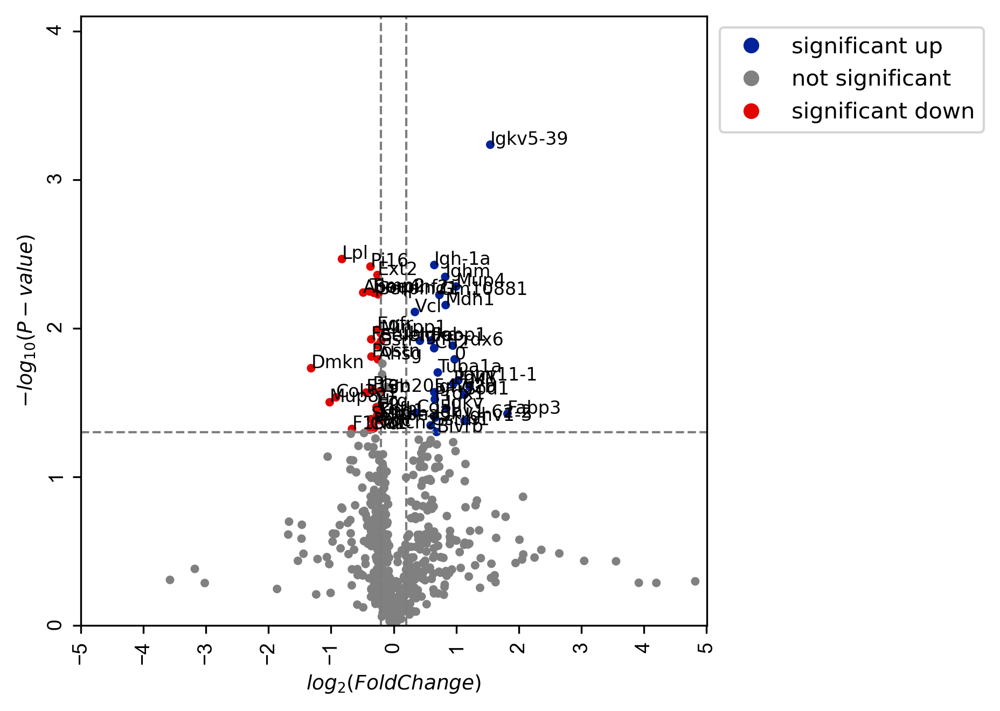

In [219]:
#Visualize 6m vs 12m wt
visuz.gene_exp.volcano(df=dfwt6m12mm, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, xlm=(-5,5.01,1), ylm=(0,4.1,1), legendpos='upper right', 
    legendanchor=(1.46,1))

In [220]:
#import 6mm vs 12m appki
dfappki6m12m = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/appki6mvs12m.xlsx', index_col=0, na_values=0)
dfappki6m12m

,protein,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,12m - appki1,12m - appki2,12m - appki3,12m - appki4,Unnamed: 11,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
Q62009,Q62009,159.650198,182.499744,184.814646,162.747781,181.863181,143.572694,153.198026,138.346878,142.216975,NaN,0.314884,0.002932,174.315110,144.333643,0.828004,-0.272290
P07724,P07724,172.201709,164.626854,168.891171,176.126331,154.750464,149.704311,147.613227,124.772237,135.160357,NaN,0.510152,0.003780,167.319306,139.312533,0.832615,-0.264279
Q07968,Q07968,192.008329,185.392018,204.627178,173.649386,208.718462,122.884902,90.472639,160.133168,148.544084,NaN,0.169983,0.004838,192.879075,130.508698,0.676635,-0.563551
P21180,P21180,158.879007,175.526464,147.849780,178.452672,160.230102,202.657918,205.621135,184.752568,188.501092,NaN,0.763183,0.005399,164.187605,195.383178,1.190000,0.250961
D3YXF5,D3YXF5,174.224573,197.808788,190.604473,197.087328,187.551195,182.096267,139.112820,140.290270,144.102964,NaN,0.172323,0.007535,189.455271,151.400580,0.799136,-0.323487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A075B5R2,A0A075B5R2,171.270177,181.098733,195.395496,115.710552,216.739825,136.709639,163.317268,218.125921,187.165703,NaN,0.922891,0.990984,176.042957,176.329633,1.001628,0.002347
G3X9Z5,G3X9Z5,38.411104,NaN,1.757323,34.935358,NaN,NaN,34.646990,18.924188,21.956892,NaN,0.290515,0.991606,25.034595,25.176023,1.005649,0.008127
P10493,P10493,224.014563,132.337073,150.148898,80.091688,114.139322,147.044437,149.800317,133.490678,131.329278,NaN,0.016495,0.991672,140.146309,140.416177,1.001926,0.002775


In [221]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
dfappki6m12m = pd.merge(dfappki6m12m, proteinlist, left_index=True, right_index=True)

#replace nan with 0
dfappki6m12mm = dfappki6m12m.fillna(0)

dfappki6m12mm

,protein,6m - appki1,6m - appki2,6m - appki3,6m - appki4,6m - appki5,12m - appki1,12m - appki2,12m - appki3,12m - appki4,Unnamed: 11,F TEST,T TEST,WT avg,APP avg,Fold change,Log2FC,Protein
Master Protein,,,,,,,,,,,,,,,,,,
Q62009,Q62009,159.650198,182.499744,184.814646,162.747781,181.863181,143.572694,153.198026,138.346878,142.216975,0.0,0.314884,0.002932,174.315110,144.333643,0.828004,-0.272290,Postn
P07724,P07724,172.201709,164.626854,168.891171,176.126331,154.750464,149.704311,147.613227,124.772237,135.160357,0.0,0.510152,0.003780,167.319306,139.312533,0.832615,-0.264279,Alb
Q07968,Q07968,192.008329,185.392018,204.627178,173.649386,208.718462,122.884902,90.472639,160.133168,148.544084,0.0,0.169983,0.004838,192.879075,130.508698,0.676635,-0.563551,F13b
P21180,P21180,158.879007,175.526464,147.849780,178.452672,160.230102,202.657918,205.621135,184.752568,188.501092,0.0,0.763183,0.005399,164.187605,195.383178,1.190000,0.250961,C2
D3YXF5,D3YXF5,174.224573,197.808788,190.604473,197.087328,187.551195,182.096267,139.112820,140.290270,144.102964,0.0,0.172323,0.007535,189.455271,151.400580,0.799136,-0.323487,C7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A075B5R2,A0A075B5R2,171.270177,181.098733,195.395496,115.710552,216.739825,136.709639,163.317268,218.125921,187.165703,0.0,0.922891,0.990984,176.042957,176.329633,1.001628,0.002347,Ighv7-3
G3X9Z5,G3X9Z5,38.411104,0.000000,1.757323,34.935358,0.000000,0.000000,34.646990,18.924188,21.956892,0.0,0.290515,0.991606,25.034595,25.176023,1.005649,0.008127,Serpina1f
P10493,P10493,224.014563,132.337073,150.148898,80.091688,114.139322,147.044437,149.800317,133.490678,131.329278,0.0,0.016495,0.991672,140.146309,140.416177,1.001926,0.002775,Nid1


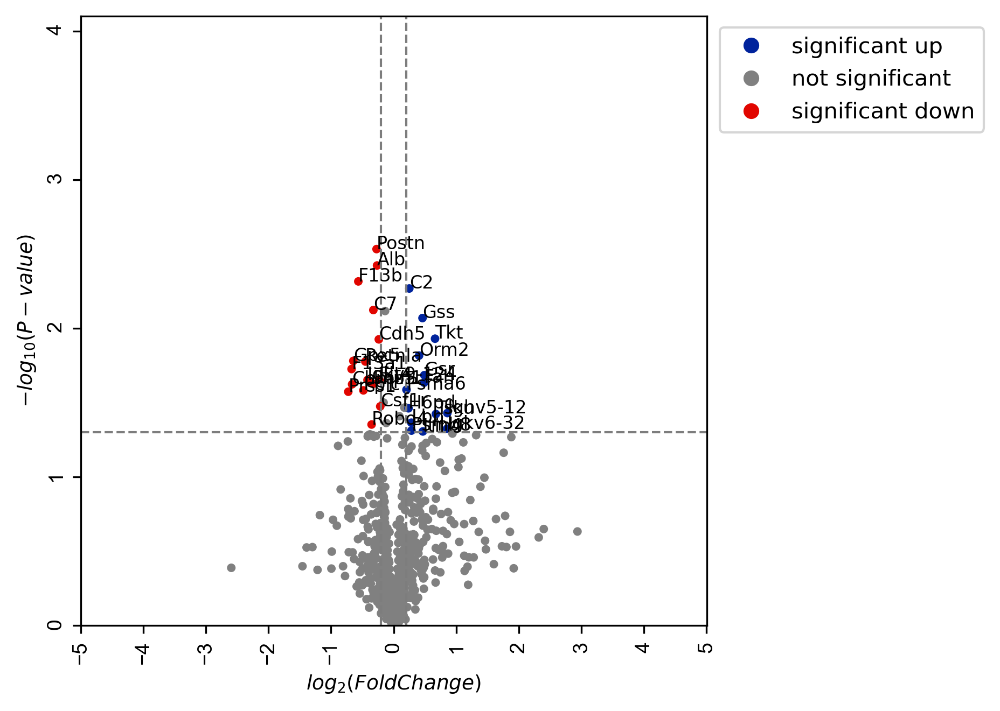

In [222]:
#Visualize 6m vs 12m appki
visuz.gene_exp.volcano(df=dfappki6m12mm, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, xlm=(-5,5.01,1), ylm=(0,4.1,1), sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1))

## Fast Imputation with Random Forests - Imputation by Chained Equations (MICE) - Imputation by group (3mWT, 3mAPPki, 6mWT, 6mAPPki, 12mWT, 12mAPPki)

In [70]:
#Sort the dataframe by column (put them in numerical order)
Normalized_dfsorted = Normalized_df.sort_index(axis=1)
Normalized_dfsorted.head()

,18,19,20,21,22,23,24,25,26,27,...,35,36,37,38,39,40,41,42,44,45
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,...,221.879408,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838,147.155775,125.067905
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,...,217.500829,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125,131.335315,167.574906
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,...,224.137667,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993,143.479821,179.631220
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,...,145.560006,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429,133.953459,109.271285
A0A075B5L3,NaN,NaN,NaN,228.406080,66.670667,65.451233,NaN,NaN,NaN,57.168664,...,NaN,178.754522,NaN,NaN,NaN,NaN,209.578596,72.117660,NaN,NaN


In [71]:
#Make the df3m_Wt group the 3 month mice (WT)
df3m_wt = Normalized_dfsorted.iloc[:, : 5]
df3m_wt.head()

,18,19,20,21,22
Master Protein,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252
A0A075B5L3,NaN,NaN,NaN,228.406080,66.670667


In [72]:
#Make the df6m group the 6 month mice (APPki)
df3m_appki = Normalized_dfsorted.iloc[:, 5:10]
df3m_appki

,23,24,25,26,27
Master Protein,,,,,
A0A075B5K0,112.903267,122.270686,100.466405,117.205388,124.442726
A0A075B5K2,178.041912,91.110384,69.319974,108.579084,135.333896
A0A075B5K6,109.799638,90.643023,112.410310,249.768354,109.195173
A0A075B5L1,91.270391,141.061164,168.980525,127.445550,123.452601
A0A075B5L3,65.451233,NaN,NaN,NaN,57.168664
...,...,...,...,...,...
Q9Z2K1,37.291501,197.816836,154.255451,140.919226,42.667970
Q9Z2L6,271.086037,173.694392,175.017280,179.767682,318.155723
Q9Z2U0,139.080826,177.535300,180.361788,97.345615,165.341787


In [73]:
#Because the wild types at 6m are separated - have to make two separate df and merge them

#Make the df6m_Wt1 group the 6 month mice (WT) - mice 28-30
df6m_wt1 = Normalized_dfsorted.iloc[:, 10: 13]
df6m_wt1.head()


,28,29,30
Master Protein,,,
A0A075B5K0,145.480659,364.338575,220.022180
A0A075B5K2,623.938263,314.600469,129.281858
A0A075B5K6,209.266748,250.808397,126.690255
A0A075B5L1,146.685839,134.925285,395.870746
A0A075B5L3,NaN,133.060455,NaN


In [74]:
#Make the df6m_Wt2 group the 6 month mice (WT) - mice 44 and 45
df6m_wt2 = Normalized_dfsorted.iloc[:, 25: 27]
df6m_wt2.head()

,44,45
Master Protein,,
A0A075B5K0,147.155775,125.067905
A0A075B5K2,131.335315,167.574906
A0A075B5K6,143.479821,179.631220
A0A075B5L1,133.953459,109.271285
A0A075B5L3,NaN,NaN


In [75]:
#join together wt1 and wt2  to make df6mwt group
df6m_wt = df6m_wt1.join(df6m_wt2)
df6m_wt.head()


,28,29,30,44,45
Master Protein,,,,,
A0A075B5K0,145.480659,364.338575,220.022180,147.155775,125.067905
A0A075B5K2,623.938263,314.600469,129.281858,131.335315,167.574906
A0A075B5K6,209.266748,250.808397,126.690255,143.479821,179.631220
A0A075B5L1,146.685839,134.925285,395.870746,133.953459,109.271285
A0A075B5L3,NaN,133.060455,NaN,NaN,NaN


In [76]:
#Make the df6m group the 6 month mice (APPki)
df6m_appki = Normalized_dfsorted.iloc[:, 13:18]
df6m_appki.head()


,31,32,33,34,35
Master Protein,,,,,
A0A075B5K0,500.675708,89.358151,138.240201,127.934449,221.879408
A0A075B5K2,197.801262,238.123864,231.303910,170.392253,217.500829
A0A075B5K6,107.835970,260.021452,156.952938,196.214906,224.137667
A0A075B5L1,122.252164,341.174691,319.192166,96.172195,145.560006
A0A075B5L3,NaN,NaN,470.370640,NaN,NaN


In [77]:
#Make the df12m group the 12 month mice (WT)
df12m_wt = Normalized_dfsorted.iloc[:, 18:21]
df12m_wt.head()

,36,37,38
Master Protein,,,
A0A075B5K0,255.299453,165.889178,174.591700
A0A075B5K2,164.596444,128.407653,138.197279
A0A075B5K6,194.076338,212.844239,186.851484
A0A075B5L1,130.937027,184.181088,55.902964
A0A075B5L3,178.754522,NaN,NaN


In [78]:
#Make the df12m group the 12 month mice (APPki)
df12m_appki = Normalized_dfsorted.iloc[:, 21:25]
df12m_appki.head()

,39,40,41,42
Master Protein,,,,
A0A075B5K0,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,85.443715,68.601525,220.775422,187.671429
A0A075B5L3,NaN,NaN,209.578596,72.117660


In [79]:
#Export dataframes to csv with index - 
df3m_wt.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_3m_WT_total.csv')
df3m_appki.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_3m_APPki_total.csv')
df6m_wt.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_6m_WT_total.csv')
df6m_appki.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_6m_APPki_total.csv')
df12m_wt.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_12m_WT_total.csv')
df12m_appki.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_12m_APPki_total.csv')

## This step is up to the user... Depending upon how many samples you have, you decide how many missing values per row you would like to impute... This can also be changed here at anytime...

In [80]:
##For each of these groups, drop rows that don't have at least 3 values
df3m_wt2 = df3m_wt.dropna(thresh=3)
df3m_appki2 = df3m_appki.dropna(thresh=3)
df6m_wt2 = df6m_wt.dropna(thresh=3)
df6m_appki2 = df6m_appki.dropna(thresh=3)
df12m_appki2 = df12m_appki.dropna(thresh=3)
##For each of these groups, drop rows that don't have at least 2 values
df12m_wt2 = df12m_wt.dropna(thresh=2)


In [81]:
#Export dataframes to csv with index - 
df3m_wt2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_3m_WT_2.csv')
df3m_appki2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_3m_APPki_2.csv')
df6m_wt2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_6m_WT_2.csv')
df6m_appki2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_6m_APPki_2.csv')
df12m_wt2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_12m_WT_2.csv')
df12m_appki2.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/Proteinsformiceforest_12m_APPki_2.csv')

In [82]:
#Reset indexes - must be done individually
df3m_wt2r = df3m_wt2.reset_index()
df3m_wt2r


,Master Protein,18,19,20,21,22
0,A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266
1,A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854
2,A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034
3,A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252
4,A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466
...,...,...,...,...,...,...
645,Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460
646,Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140
647,Q9Z2U0,6.917337,172.130514,6.868211,139.866469,145.515410
648,Q9Z2U1,189.551177,108.888944,170.633984,182.236912,202.094764


In [83]:
#Reset indexes - must be done individually
df3m_appki2r = df3m_appki2.reset_index()
df3m_appki2r

,Master Protein,23,24,25,26,27
0,A0A075B5K0,112.903267,122.270686,100.466405,117.205388,124.442726
1,A0A075B5K2,178.041912,91.110384,69.319974,108.579084,135.333896
2,A0A075B5K6,109.799638,90.643023,112.410310,249.768354,109.195173
3,A0A075B5L1,91.270391,141.061164,168.980525,127.445550,123.452601
4,A0A075B5L7,187.762499,154.143959,130.304196,92.757273,156.880173
...,...,...,...,...,...,...
645,Q9Z2K1,37.291501,197.816836,154.255451,140.919226,42.667970
646,Q9Z2L6,271.086037,173.694392,175.017280,179.767682,318.155723
647,Q9Z2U0,139.080826,177.535300,180.361788,97.345615,165.341787
648,Q9Z2U1,162.145436,174.001283,161.496914,207.640724,176.435919


In [84]:
#Reset indexes - must be done individually
df6m_wt2r = df6m_wt2.reset_index()
df6m_wt2r

,Master Protein,28,29,30,44,45
0,A0A075B5K0,145.480659,364.338575,220.022180,147.155775,125.067905
1,A0A075B5K2,623.938263,314.600469,129.281858,131.335315,167.574906
2,A0A075B5K6,209.266748,250.808397,126.690255,143.479821,179.631220
3,A0A075B5L1,146.685839,134.925285,395.870746,133.953459,109.271285
4,A0A075B5L7,195.988948,151.285490,109.458838,175.823435,245.506064
...,...,...,...,...,...,...
645,Q9Z2K1,111.078350,39.521323,132.195046,162.562763,185.461749
646,Q9Z2L6,164.744994,155.716268,173.758950,155.566052,160.936568
647,Q9Z2U0,160.181635,160.394209,170.523353,140.511273,196.028327
648,Q9Z2U1,205.523658,171.357107,185.248272,154.594436,202.286134


In [85]:
#Reset indexes - must be done individually
df12m_wt2r = df12m_wt2.reset_index()
df12m_wt2r

,Master Protein,36,37,38
0,A0A075B5K0,255.299453,165.889178,174.591700
1,A0A075B5K2,164.596444,128.407653,138.197279
2,A0A075B5K6,194.076338,212.844239,186.851484
3,A0A075B5L1,130.937027,184.181088,55.902964
4,A0A075B5L7,194.747347,254.196834,268.380670
...,...,...,...,...
645,Q9Z2K1,50.430442,209.770156,152.972834
646,Q9Z2L6,136.640537,134.070246,151.010837
647,Q9Z2U0,167.694086,6.260730,170.116475
648,Q9Z2U1,163.303275,329.591862,174.902283


In [86]:
#Reset indexes - must be done individually
df6m_appki2r = df6m_appki2.reset_index()
df6m_appki2r

,Master Protein,31,32,33,34,35
0,A0A075B5K0,500.675708,89.358151,138.240201,127.934449,221.879408
1,A0A075B5K2,197.801262,238.123864,231.303910,170.392253,217.500829
2,A0A075B5K6,107.835970,260.021452,156.952938,196.214906,224.137667
3,A0A075B5L1,122.252164,341.174691,319.192166,96.172195,145.560006
4,A0A075B5L7,147.373215,202.044680,198.986925,187.362298,300.806980
...,...,...,...,...,...,...
645,Q9Z2K1,183.046955,221.929702,43.979228,265.676715,81.688972
646,Q9Z2L6,136.422662,141.580308,215.214448,149.546141,179.392235
647,Q9Z2U0,254.057414,130.485711,192.965840,172.838089,6.933033
648,Q9Z2U1,149.722246,185.645378,183.637853,173.978568,177.368416


In [87]:
#Reset indexes - must be done individually
df12m_appki2r = df12m_appki2.reset_index()
df12m_appki2r

,Master Protein,39,40,41,42
0,A0A075B5K0,106.755853,165.060503,183.975238,178.989838
1,A0A075B5K2,144.908942,127.806684,175.445522,184.328125
2,A0A075B5K6,167.345348,232.885617,192.882902,222.853993
3,A0A075B5L1,85.443715,68.601525,220.775422,187.671429
4,A0A075B5L7,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...
605,Q9Z2K1,150.447283,111.263676,35.878917,28.146328
606,Q9Z2L6,175.746491,164.715267,155.537306,158.183398
607,Q9Z2U0,6.865450,162.181186,185.696159,163.655865
608,Q9Z2U1,208.815769,173.271209,200.873111,170.894231


In [88]:
#Save the proteins column for later
df_3m_wt_proteins = df3m_wt2r["Master Protein"]

#Add the Master Column Header Row Back
df_3m_wt_proteins = pd.DataFrame(df_3m_wt_proteins, columns=['Master Protein'])
df_3m_wt_proteins

,Master Protein
0,A0A075B5K0
1,A0A075B5K2
2,A0A075B5K6
3,A0A075B5L1
4,A0A075B5L7
...,...
645,Q9Z2K1
646,Q9Z2L6
647,Q9Z2U0
648,Q9Z2U1


In [89]:
#Do this for all the others
df_3m_appki_proteins = df3m_appki2r["Master Protein"]
df_3m_appki_proteins = pd.DataFrame(df_3m_appki_proteins, columns=['Master Protein'])
df_6m_wt_proteins = df6m_wt2r["Master Protein"]
df_6m_wt_proteins = pd.DataFrame(df_6m_wt_proteins, columns=['Master Protein'])
df_6m_appki_proteins = df6m_appki2r["Master Protein"]
df_6m_appki_proteins = pd.DataFrame(df_6m_appki_proteins, columns=['Master Protein'])
df_12m_wt_proteins = df12m_wt2r["Master Protein"]
df_12m_wt_proteins = pd.DataFrame(df_12m_wt_proteins, columns=['Master Protein'])
df_12m_appki_proteins = df12m_appki2r["Master Protein"]
df_12m_appki_proteins = pd.DataFrame(df_12m_appki_proteins, columns=['Master Protein'])
#Check on final one
df_12m_appki_proteins

,Master Protein
0,A0A075B5K0
1,A0A075B5K2
2,A0A075B5K6
3,A0A075B5L1
4,A0A075B5L7
...,...
605,Q9Z2K1
606,Q9Z2L6
607,Q9Z2U0
608,Q9Z2U1


In [90]:
#Delete the Master Protein column from all of the datasets
del df3m_wt2r['Master Protein']
del df3m_appki2r['Master Protein']
del df6m_wt2r['Master Protein']
del df6m_appki2r['Master Protein']
del df12m_wt2r['Master Protein']
del df12m_appki2r['Master Protein']

#Check on last one
df3m_appki2r.head()

,23,24,25,26,27
0,112.903267,122.270686,100.466405,117.205388,124.442726
1,178.041912,91.110384,69.319974,108.579084,135.333896
2,109.799638,90.643023,112.410310,249.768354,109.195173
3,91.270391,141.061164,168.980525,127.445550,123.452601
4,187.762499,154.143959,130.304196,92.757273,156.880173


These are the actual imputation steps...

In [91]:
# Create kernels. 
kernel_3m_wt = mf.MultipleImputedKernel(
  data=df3m_wt2r,
  save_all_iterations=True,
  random_state=1991
)

# Create kernels. 
kernel_6m_wt = mf.MultipleImputedKernel(
  data=df6m_wt2r,
  save_all_iterations=True,
  random_state=1991
)

# Create kernels. 
kernel_12m_wt = mf.MultipleImputedKernel(
  data=df12m_wt2r,
  save_all_iterations=True,
  random_state=1991
)

kernel_3m_appki = mf.MultipleImputedKernel(
  data=df3m_appki2r,
  save_all_iterations=True,
  random_state=1991
)

# Create kernels. 
kernel_6m_appki = mf.MultipleImputedKernel(
  data=df6m_appki2r,
  save_all_iterations=True,
  random_state=1991
)

# Create kernels. 
kernel_12m_appki = mf.MultipleImputedKernel(
  data=df12m_appki2r,
  save_all_iterations=True,
  random_state=1991
)

In [92]:
print(kernel_3m_wt)

              Class: MultipleImputedKernel
       Models Saved: Last Iteration
           Datasets: 5
         Iterations: 0
  Imputed Variables: 5
save_all_iterations: True


In [93]:
# Run the MICE algorithm for 5 iterations on each of the datasets in each kernel
kernel_3m_wt.mice(5)

kernel_3m_appki.mice(5)

kernel_6m_wt.mice(5)

kernel_6m_appki.mice(5)

kernel_12m_wt.mice(5)

kernel_12m_appki.mice(5)

#Check on the last one
print(kernel_12m_appki)

              Class: MultipleImputedKernel
       Models Saved: Last Iteration
           Datasets: 5
         Iterations: 5
  Imputed Variables: 2
save_all_iterations: True


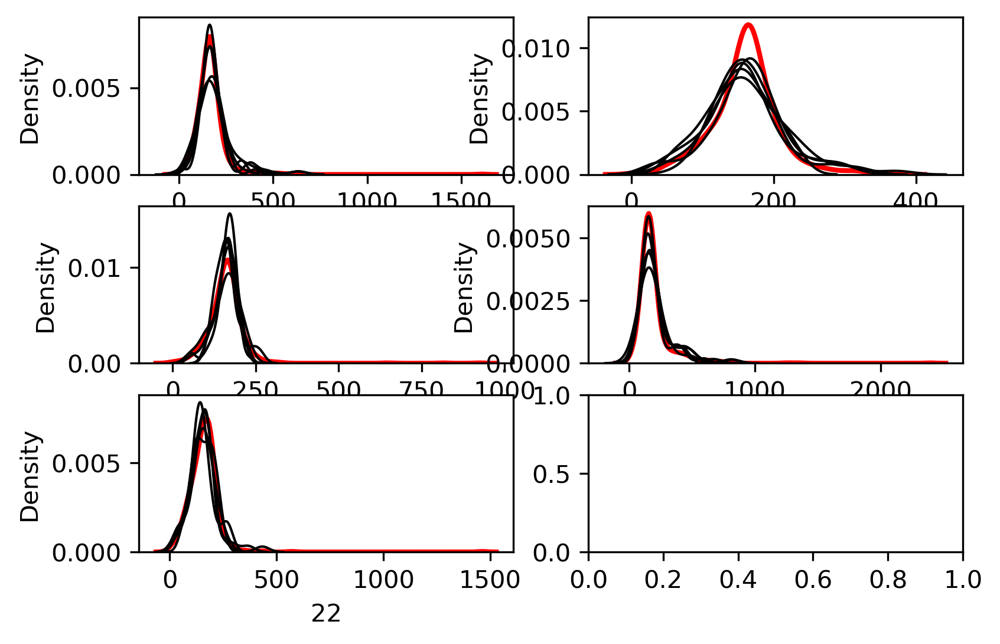

In [94]:
#Red line is original data and black line is the imputed values of the dataset
kernel_3m_wt.plot_imputed_distributions()

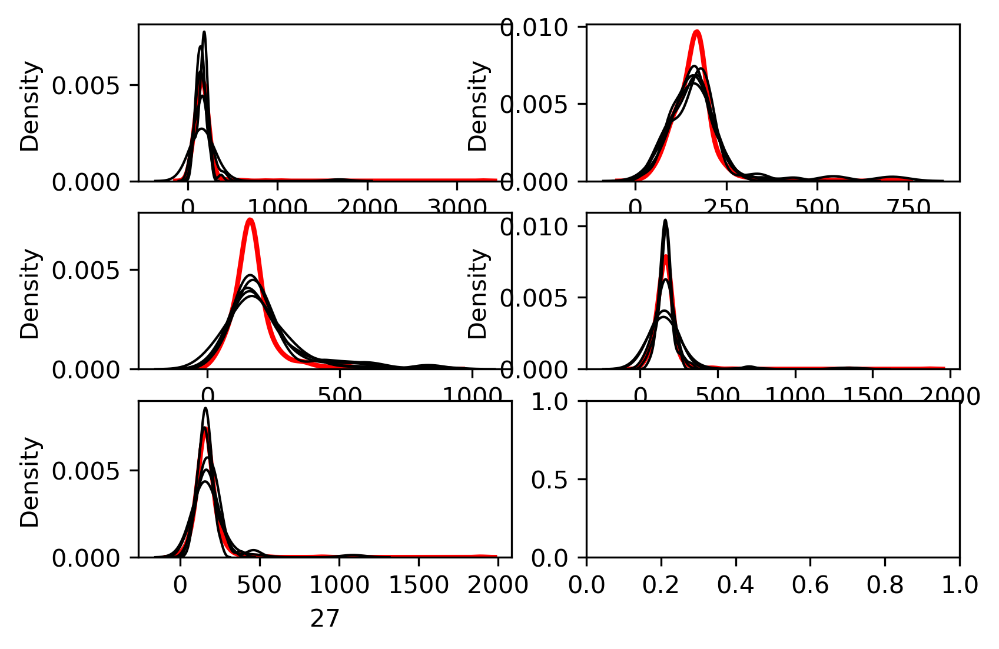

In [95]:
#Red line is original data and black line is the imputed values of the dataset
kernel_3m_appki.plot_imputed_distributions()

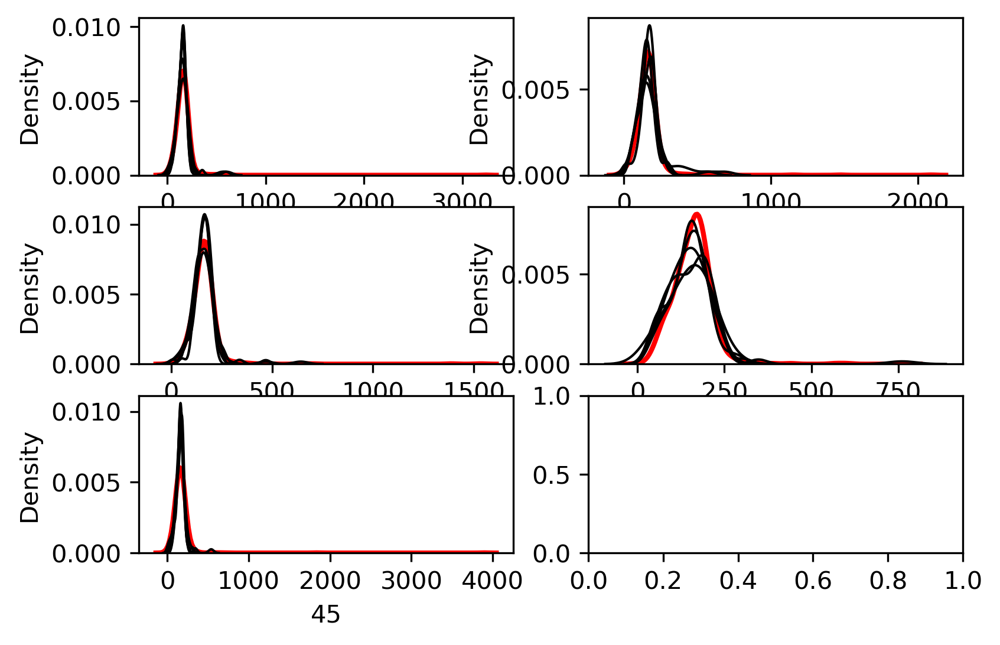

In [96]:
#Red line is original data and black line is the imputed values of the dataset
kernel_6m_wt.plot_imputed_distributions()

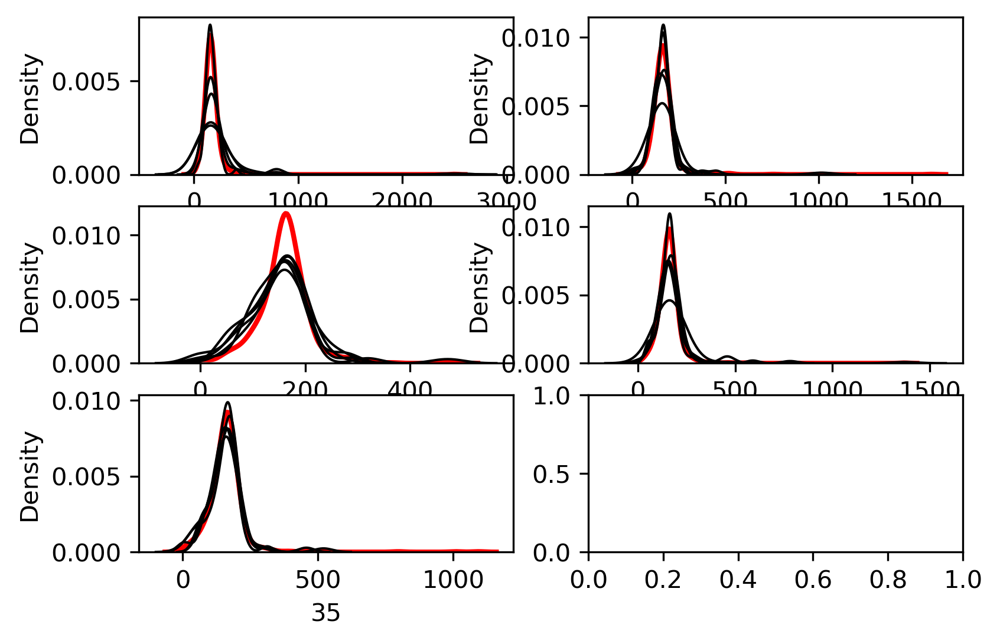

In [97]:
#Red line is original data and black line is the imputed values of the dataset
kernel_6m_appki.plot_imputed_distributions()

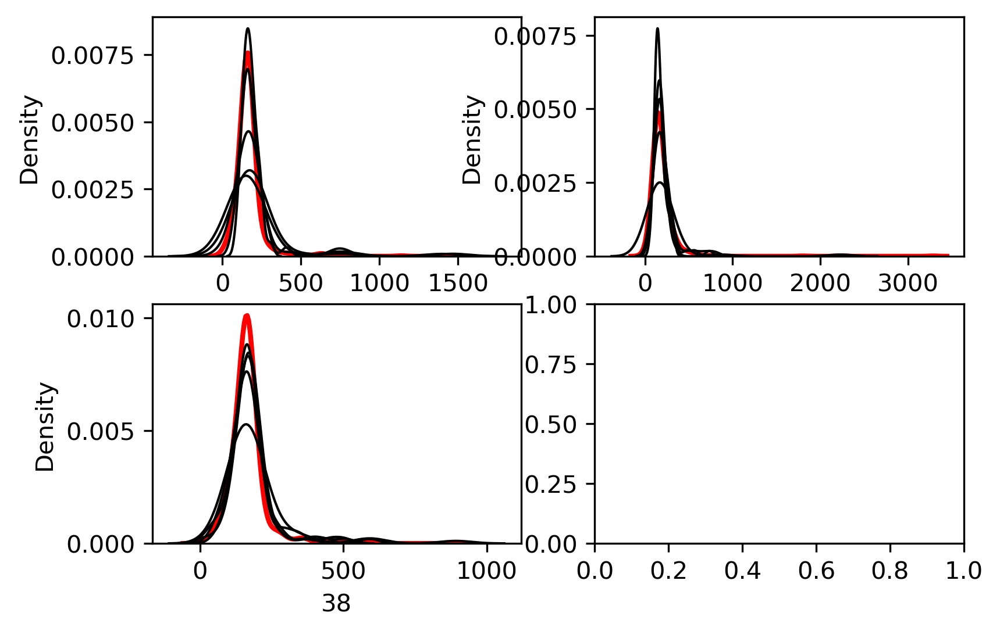

In [98]:
#Red line is original data and black line is the imputed values of the dataset
kernel_12m_wt.plot_imputed_distributions()

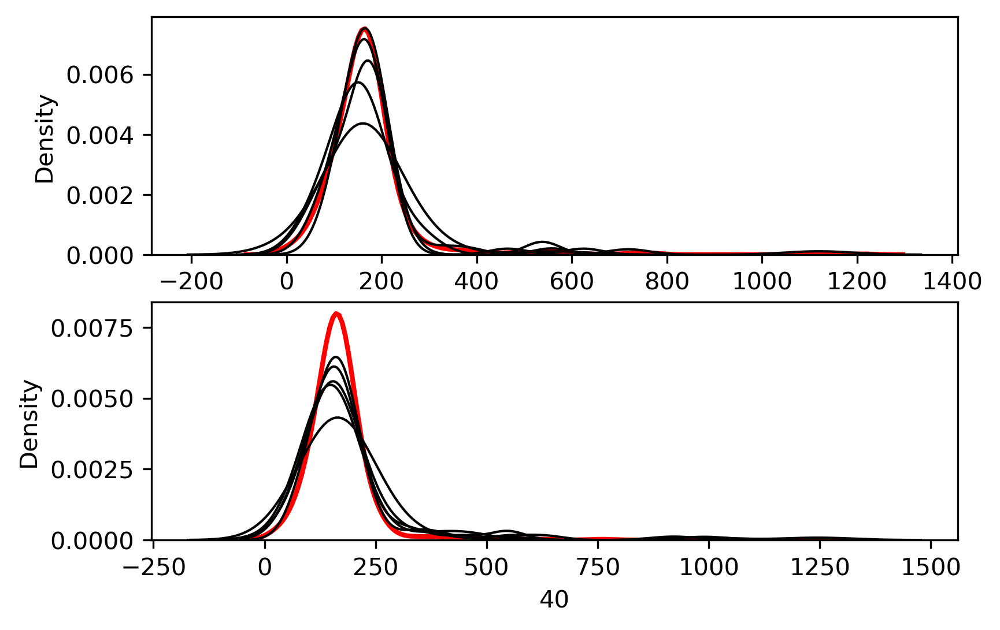

In [99]:
#Red line is original data and black line is the imputed values of the dataset
kernel_12m_appki.plot_imputed_distributions()

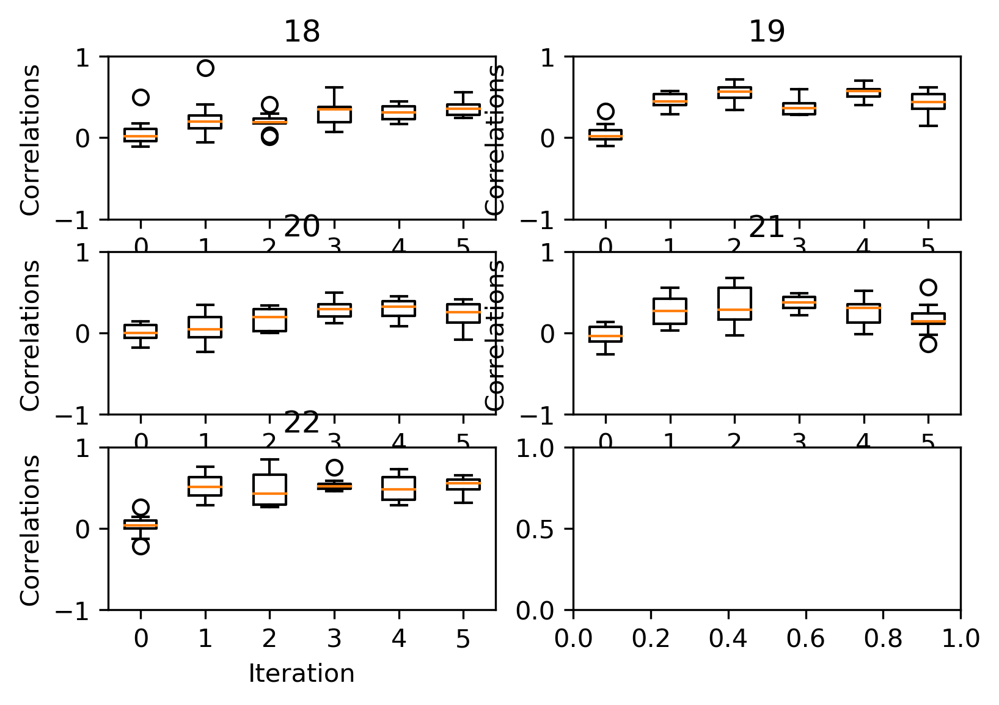

In [100]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_3m_wt.plot_correlations()

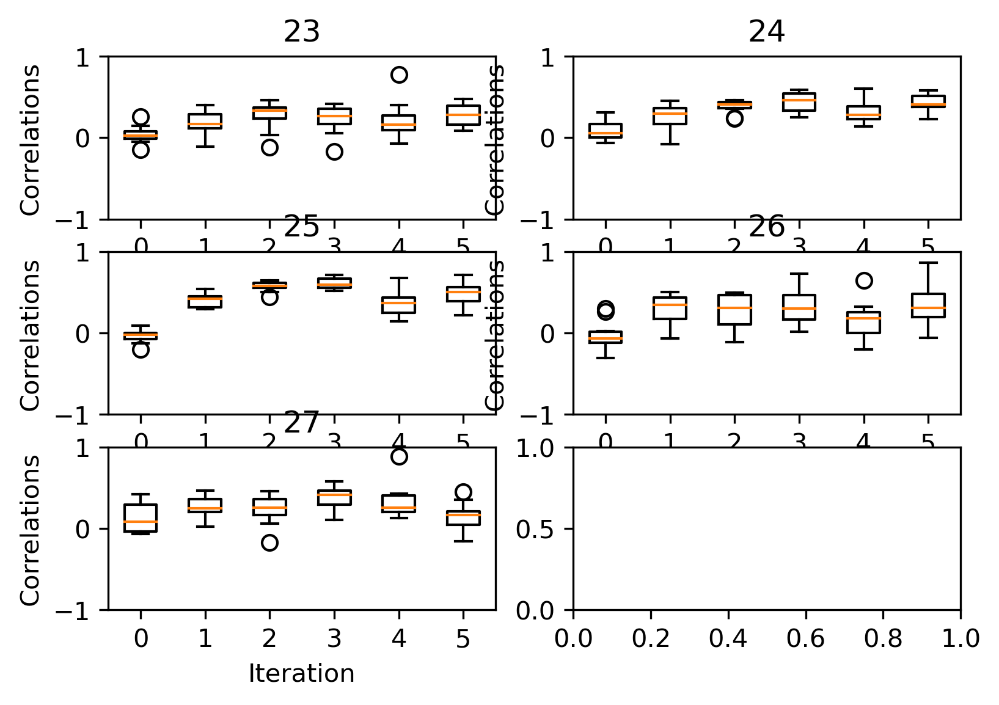

In [101]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_3m_appki.plot_correlations()

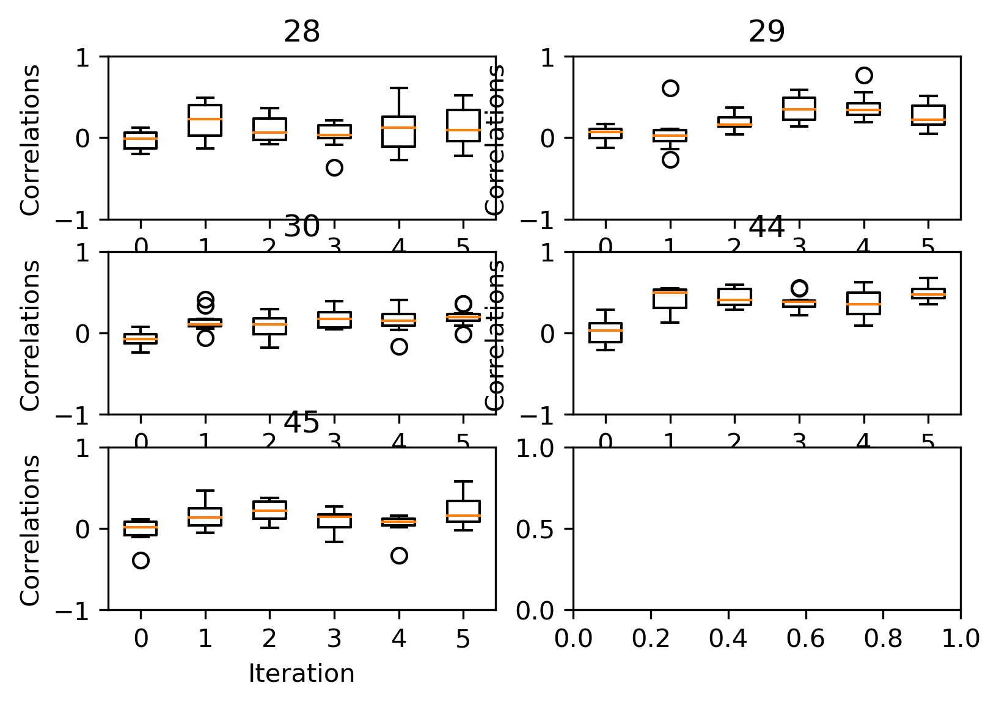

In [102]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_6m_wt.plot_correlations()

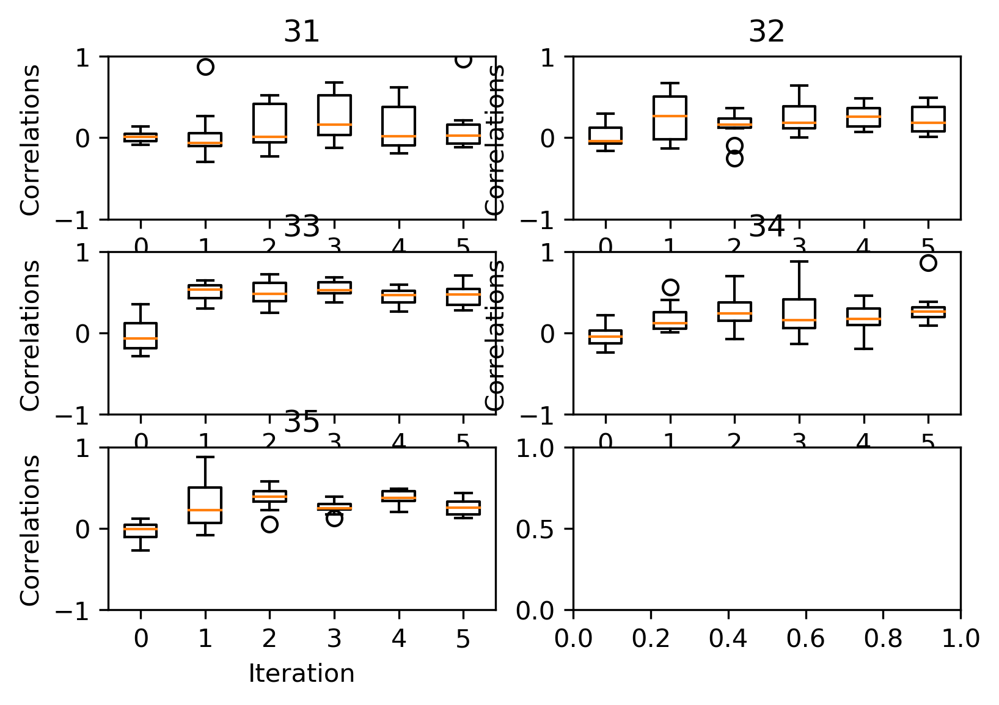

In [103]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_6m_appki.plot_correlations()

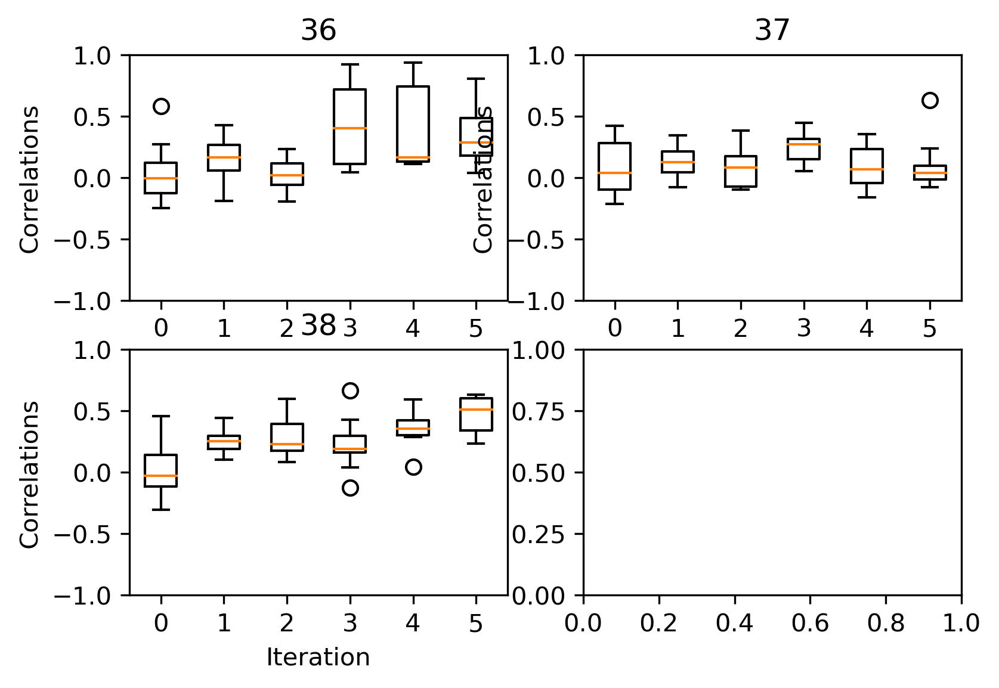

In [104]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_12m_wt.plot_correlations()

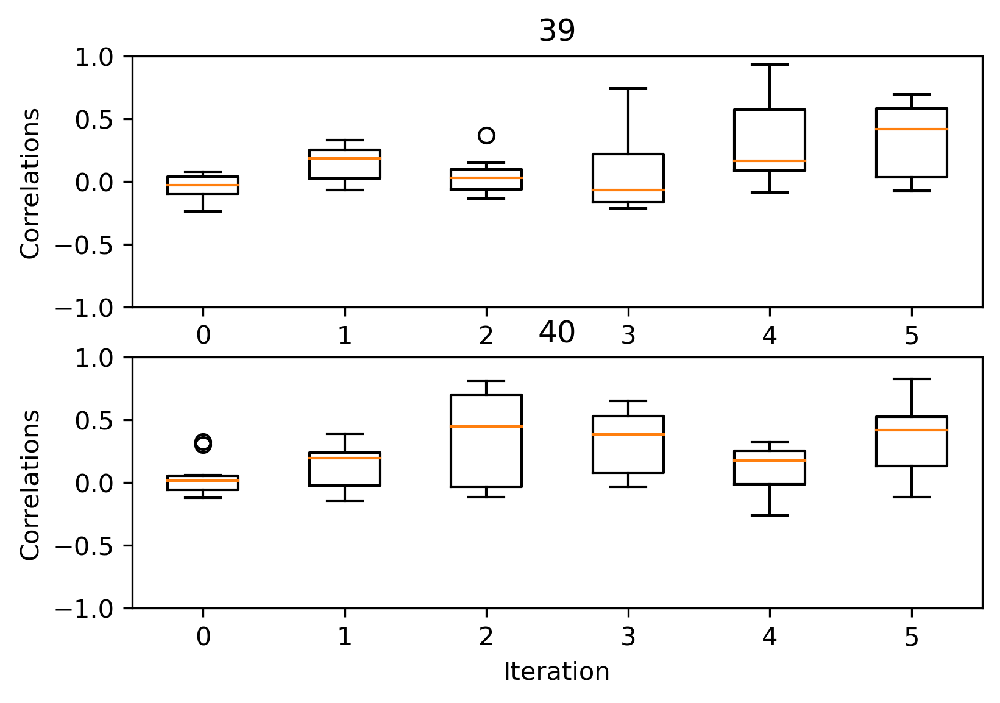

In [105]:
#We are probably interested in knowing how our values between datasets converged over the iterations. The plot_correlations method shows you a boxplot of the correlations between imputed values in every combination of datasets, at each iteration. This allows you to see how correlated the imputations are between datasets, as well as the convergence over iterations:
kernel_12m_appki.plot_correlations()

AxesSubplot(0.125,0.125;0.62x0.755)


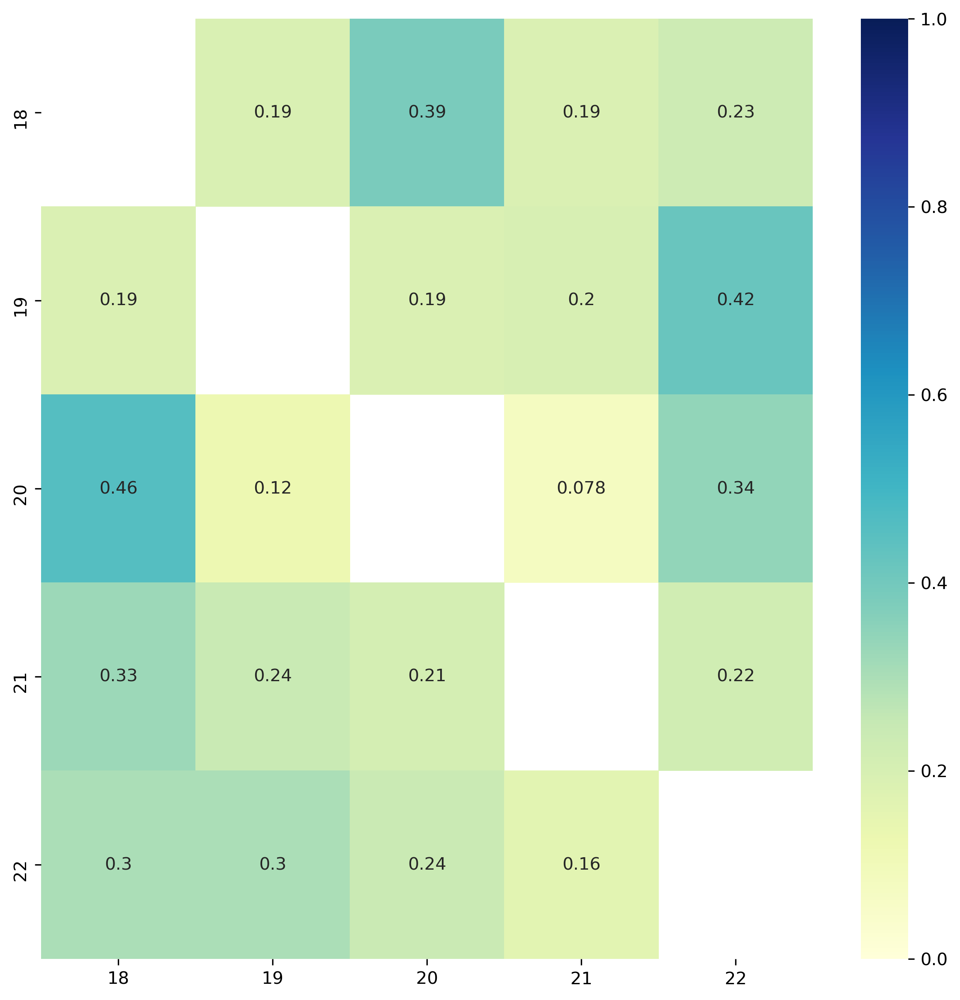

In [106]:
#The numbers shown are returned from the sklearn random forest _feature_importance attribute. Each square represents the importance of the column variable in imputing the row variable.
plt.figure(figsize=(10, 10))
kernel_3m_wt.plot_feature_importance(annot=True,cmap="YlGnBu",vmin=0, vmax=1)
plt.show()

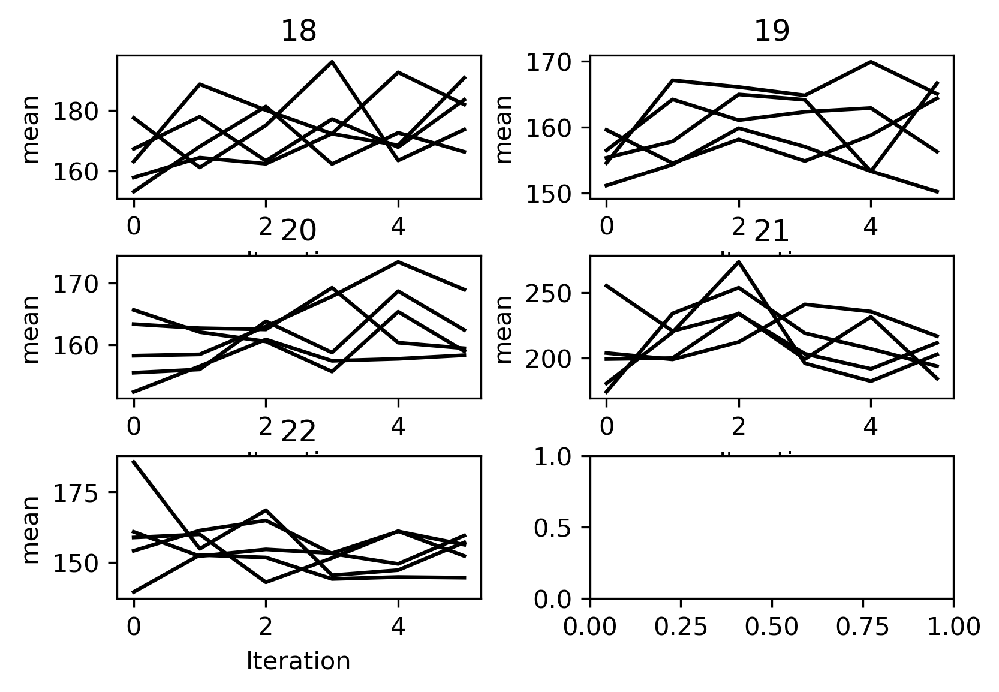

In [107]:
kernel_3m_wt.plot_mean_convergence(wspace=0.3, hspace=0.4)

In [108]:
#Output kernels to dataframe
df_imputed_3m_wt = kernel_3m_wt.complete_data(0)
df_imputed_6m_wt = kernel_6m_wt.complete_data(0)
df_imputed_12m_wt = kernel_12m_wt.complete_data(0)
df_imputed_3m_appki = kernel_3m_appki.complete_data(0)
df_imputed_6m_appki = kernel_6m_appki.complete_data(0)
df_imputed_12m_appki = kernel_12m_appki.complete_data(0)

#check on last one
df_imputed_12m_appki

,39,40,41,42
0,106.755853,165.060503,183.975238,178.989838
1,144.908942,127.806684,175.445522,184.328125
2,167.345348,232.885617,192.882902,222.853993
3,85.443715,68.601525,220.775422,187.671429
4,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...
605,150.447283,111.263676,35.878917,28.146328
606,175.746491,164.715267,155.537306,158.183398
607,6.865450,162.181186,185.696159,163.655865
608,208.815769,173.271209,200.873111,170.894231


In [109]:
#merge with appropriate protein list
df_imputed_3m_wtx = df_imputed_3m_wt.join(df_3m_wt_proteins)
df_imputed_6m_wtx = df_imputed_6m_wt.join(df_6m_wt_proteins)
df_imputed_12m_wtx = df_imputed_12m_wt.join(df_12m_wt_proteins)
df_imputed_3m_appkix = df_imputed_3m_appki.join(df_3m_appki_proteins)
df_imputed_6m_appkix = df_imputed_6m_appki.join(df_6m_appki_proteins)
df_imputed_12m_appkix = df_imputed_12m_appki.join(df_12m_appki_proteins)

#check on the last one
df_imputed_12m_appkix

,39,40,41,42,Master Protein
0,106.755853,165.060503,183.975238,178.989838,A0A075B5K0
1,144.908942,127.806684,175.445522,184.328125,A0A075B5K2
2,167.345348,232.885617,192.882902,222.853993,A0A075B5K6
3,85.443715,68.601525,220.775422,187.671429,A0A075B5L1
4,263.927520,163.402668,318.955238,275.221970,A0A075B5L7
...,...,...,...,...,...
605,150.447283,111.263676,35.878917,28.146328,Q9Z2K1
606,175.746491,164.715267,155.537306,158.183398,Q9Z2L6
607,6.865450,162.181186,185.696159,163.655865,Q9Z2U0
608,208.815769,173.271209,200.873111,170.894231,Q9Z2U1


In [ ]:
df_imputed_3m_wtx = df_imputed_3m_wtx.set_index('Master Protein')
df_imputed_6m_wtx = df_imputed_6m_wtx.set_index('Master Protein')
df_imputed_12m_wtx = df_imputed_12m_wtx.set_index('Master Protein')
df_imputed_3m_appkix = df_imputed_3m_appkix.set_index('Master Protein')
df_imputed_6m_appkix = df_imputed_6m_appkix.set_index('Master Protein')
df_imputed_12m_appkix = df_imputed_12m_appkix.set_index('Master Protein')


In [111]:
#Check on the last one
df_imputed_12m_appkix

,39,40,41,42
Master Protein,,,,
A0A075B5K0,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...
Q9Z2K1,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,6.865450,162.181186,185.696159,163.655865


In [113]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
df_imputed_3m_wtxx = pd.merge(df_imputed_3m_wtx, proteinlist, left_index=True, right_index=True)
df_imputed_6m_wtxx = pd.merge(df_imputed_6m_wtx, proteinlist, left_index=True, right_index=True)
df_imputed_12m_wtxx = pd.merge(df_imputed_12m_wtx, proteinlist, left_index=True, right_index=True)
df_imputed_3m_appkixx = pd.merge(df_imputed_3m_appkix, proteinlist, left_index=True, right_index=True)
df_imputed_6m_appkixx = pd.merge(df_imputed_6m_appkix, proteinlist, left_index=True, right_index=True)
df_imputed_12m_appkixx = pd.merge(df_imputed_12m_appkix, proteinlist, left_index=True, right_index=True)

#check on the last one
df_imputed_12m_appkixx

,39,40,41,42,Protein
Master Protein,,,,,
A0A075B5K0,106.755853,165.060503,183.975238,178.989838,Igkv14-126
A0A075B5K2,144.908942,127.806684,175.445522,184.328125,Igkv9-124
A0A075B5K6,167.345348,232.885617,192.882902,222.853993,Igkv2-109
A0A075B5L1,85.443715,68.601525,220.775422,187.671429,Igkv10-94
A0A075B5L7,263.927520,163.402668,318.955238,275.221970,Igkv4-80
...,...,...,...,...,...
Q9Z2K1,150.447283,111.263676,35.878917,28.146328,Krt16
Q9Z2L6,175.746491,164.715267,155.537306,158.183398,Minpp1
Q9Z2U0,6.865450,162.181186,185.696159,163.655865,Psma7


In [114]:
#Export dataframes to csv with index - 
df_imputed_3m_wtxx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/3m__wt_imputed.csv')
df_imputed_6m_wtxx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/6m_wt_imputed.csv')
df_imputed_12m_wtxx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/12m_wt_imputed.csv')
df_imputed_3m_appkixx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/3m_appki_imputed.csv')
df_imputed_6m_appkixx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/6m_appki_imputed.csv')
df_imputed_12m_appkixx.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/12m_appki_imputed.csv')


In [115]:
#Merge the age groups together
df_imputed_3m_merge = pd.merge(df_imputed_3m_wtx, df_imputed_3m_appkix, left_index=True, right_index=True)
df_imputed_6m_merge = pd.merge(df_imputed_6m_wtx, df_imputed_6m_appkix, left_index=True, right_index=True)
df_imputed_12m_merge = pd.merge(df_imputed_12m_wtx, df_imputed_12m_appkix, left_index=True, right_index=True)

#check on the last one
df_imputed_12m_merge

,36,37,38,39,40,41,42
Master Protein,,,,,,,
A0A075B5K0,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...,...,...
Q9Z2K1,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865


In [116]:
#Add gene names to dataframe by merging with genenames dataframe (df2)
#Merge the age groups together
df_imputed_3m_merge_annot = pd.merge(df_imputed_3m_merge, proteinlist, left_index=True, right_index=True)
df_imputed_6m_merge_annot = pd.merge(df_imputed_6m_merge, proteinlist, left_index=True, right_index=True)
df_imputed_12m_merge_annot = pd.merge(df_imputed_12m_merge, proteinlist, left_index=True, right_index=True)

#check on the last one
df_imputed_12m_merge_annot

,36,37,38,39,40,41,42,Protein
Master Protein,,,,,,,,
A0A075B5K0,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838,Igkv14-126
A0A075B5K2,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125,Igkv9-124
A0A075B5K6,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993,Igkv2-109
A0A075B5L1,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429,Igkv10-94
A0A075B5L7,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970,Igkv4-80
...,...,...,...,...,...,...,...,...
Q9Z2K1,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328,Krt16
Q9Z2L6,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398,Minpp1
Q9Z2U0,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865,Psma7


In [117]:
df_imputed_3m_merge_annot.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/3m__merged_imputed.csv')
df_imputed_6m_merge_annot.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/6m_merged_imputed.csv')
df_imputed_12m_merge_annot.to_csv(r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/12m_merged_imputed.csv')


In [118]:
df_imputed_3m_merge.head()

,18,19,20,21,22,23,24,25,26,27
Master Protein,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173


In [143]:
#rename columns
df_imputed_3m_merge.columns = ['3m wt', '3m wt', '3m wt', '3m wt', '3m wt', '3m appki', '3m appki', '3m appki', '3m appki', '3m appki']
df_imputed_3m_merge

,3m wt,3m wt,3m wt,3m wt,3m wt,3m appki,3m appki,3m appki,3m appki,3m appki
Master Protein,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173
...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460,37.291501,197.816836,154.255451,140.919226,42.667970
Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140,271.086037,173.694392,175.017280,179.767682,318.155723
Q9Z2U0,6.917337,172.130514,6.868211,139.866469,145.515410,139.080826,177.535300,180.361788,97.345615,165.341787


In [120]:
df_imputed_6m_merge.head()

,28,29,30,44,45,31,32,33,34,35
Master Protein,,,,,,,,,,
A0A075B5K0,145.480659,364.338575,220.022180,147.155775,125.067905,500.675708,89.358151,138.240201,127.934449,221.879408
A0A075B5K2,623.938263,314.600469,129.281858,131.335315,167.574906,197.801262,238.123864,231.303910,170.392253,217.500829
A0A075B5K6,209.266748,250.808397,126.690255,143.479821,179.631220,107.835970,260.021452,156.952938,196.214906,224.137667
A0A075B5L1,146.685839,134.925285,395.870746,133.953459,109.271285,122.252164,341.174691,319.192166,96.172195,145.560006
A0A075B5L7,195.988948,151.285490,109.458838,175.823435,245.506064,147.373215,202.044680,198.986925,187.362298,300.806980


In [144]:
#rename columns
df_imputed_6m_merge.columns = ['6m wt', '6m wt', '6m wt', '6m wt', '6m wt', '6m appki', '6m appki', '6m appki', '6m appki', '6m appki']
df_imputed_6m_merge

,6m wt,6m wt,6m wt,6m wt,6m wt,6m appki,6m appki,6m appki,6m appki,6m appki
Master Protein,,,,,,,,,,
A0A075B5K0,145.480659,364.338575,220.022180,147.155775,125.067905,500.675708,89.358151,138.240201,127.934449,221.879408
A0A075B5K2,623.938263,314.600469,129.281858,131.335315,167.574906,197.801262,238.123864,231.303910,170.392253,217.500829
A0A075B5K6,209.266748,250.808397,126.690255,143.479821,179.631220,107.835970,260.021452,156.952938,196.214906,224.137667
A0A075B5L1,146.685839,134.925285,395.870746,133.953459,109.271285,122.252164,341.174691,319.192166,96.172195,145.560006
A0A075B5L7,195.988948,151.285490,109.458838,175.823435,245.506064,147.373215,202.044680,198.986925,187.362298,300.806980
...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,111.078350,39.521323,132.195046,162.562763,185.461749,183.046955,221.929702,43.979228,265.676715,81.688972
Q9Z2L6,164.744994,155.716268,173.758950,155.566052,160.936568,136.422662,141.580308,215.214448,149.546141,179.392235
Q9Z2U0,160.181635,160.394209,170.523353,140.511273,196.028327,254.057414,130.485711,192.965840,172.838089,6.933033


In [122]:
df_imputed_12m_merge.head()

,36,37,38,39,40,41,42
Master Protein,,,,,,,
A0A075B5K0,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970


In [145]:
#rename columns
df_imputed_12m_merge.columns = ['12m wt', '12m wt', '12m wt',  '12m appki', '12m appki', '12m appki', '12m appki']
df_imputed_12m_merge

,12m wt,12m wt,12m wt,12m appki,12m appki,12m appki,12m appki
Master Protein,,,,,,,
A0A075B5K0,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...,...,...
Q9Z2K1,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865


In [146]:
#Merge all the data together
df_imputed_3m6m_merge = pd.merge(df_imputed_3m_merge, df_imputed_6m_merge, left_index=True, right_index=True)
df_imputed_3m6m_merge.head()

,3m wt,3m wt,3m wt,3m wt,3m wt,3m appki,3m appki,3m appki,3m appki,3m appki,6m wt,6m wt,6m wt,6m wt,6m wt,6m appki,6m appki,6m appki,6m appki,6m appki
Master Protein,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,145.480659,364.338575,220.022180,147.155775,125.067905,500.675708,89.358151,138.240201,127.934449,221.879408
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,623.938263,314.600469,129.281858,131.335315,167.574906,197.801262,238.123864,231.303910,170.392253,217.500829
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,209.266748,250.808397,126.690255,143.479821,179.631220,107.835970,260.021452,156.952938,196.214906,224.137667
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,146.685839,134.925285,395.870746,133.953459,109.271285,122.252164,341.174691,319.192166,96.172195,145.560006
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173,195.988948,151.285490,109.458838,175.823435,245.506064,147.373215,202.044680,198.986925,187.362298,300.806980


In [147]:
#Merge all the data together
df_imputed_total_merge = pd.merge(df_imputed_3m6m_merge, df_imputed_12m_merge, left_index=True, right_index=True)
df_imputed_total_merge

,3m wt,3m wt,3m wt,3m wt,3m wt,3m appki,3m appki,3m appki,3m appki,3m appki,...,6m appki,6m appki,6m appki,12m wt,12m wt,12m wt,12m appki,12m appki,12m appki,12m appki
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,...,138.240201,127.934449,221.879408,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,...,231.303910,170.392253,217.500829,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,...,156.952938,196.214906,224.137667,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,...,319.192166,96.172195,145.560006,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173,...,198.986925,187.362298,300.806980,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460,37.291501,197.816836,154.255451,140.919226,42.667970,...,43.979228,265.676715,81.688972,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140,271.086037,173.694392,175.017280,179.767682,318.155723,...,215.214448,149.546141,179.392235,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,6.917337,172.130514,6.868211,139.866469,145.515410,139.080826,177.535300,180.361788,97.345615,165.341787,...,192.965840,172.838089,6.933033,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865


In [148]:
#Transpose data and reset index
dfpca = df_imputed_total_merge.transpose()
dfpcar = dfpca.reset_index()
dfpcar

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z121,Q9Z126,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,Q9Z331
0,3m wt,124.578952,124.843459,197.007588,103.715239,103.093031,133.146670,151.365712,142.073071,50.666628,...,231.919284,117.584651,163.636348,137.392188,219.284377,283.616464,190.181268,6.917337,189.551177,156.314343
1,3m wt,149.455396,167.275585,89.670999,52.255501,120.866463,75.674951,207.165445,120.681545,68.294996,...,134.487588,33.771212,198.378384,137.998991,182.525597,155.662106,141.424181,172.130514,108.888944,169.650364
2,3m wt,102.605754,231.601790,169.174872,109.631772,116.232200,114.910655,97.924822,75.646955,58.824832,...,155.461105,82.388491,178.686354,148.350799,227.753663,199.804524,167.683747,6.868211,170.633984,154.349944
3,3m wt,165.674286,134.813408,148.077972,126.460023,167.238277,50.806058,114.331084,90.434096,118.176151,...,124.168527,489.359280,166.336683,127.679259,185.253666,202.776510,147.438329,139.866469,182.236912,152.792781
4,3m wt,98.758266,82.257854,135.845034,120.367252,161.054466,60.337230,156.063880,115.371748,57.431606,...,140.614873,31.714604,205.536549,146.005228,187.747318,58.515460,248.637140,145.515410,202.094764,206.878537
5,3m appki,112.903267,178.041912,109.799638,91.270391,187.762499,56.443914,73.785179,133.802204,164.238207,...,220.519229,33.113917,210.038071,117.601109,254.485677,37.291501,271.086037,139.080826,162.145436,139.153517
6,3m appki,122.270686,91.110384,90.643023,141.061164,154.143959,85.157358,114.862430,98.351468,49.649125,...,111.432453,90.356388,198.366360,134.456638,162.225457,197.816836,173.694392,177.535300,174.001283,176.971732
7,3m appki,100.466405,69.319974,112.410310,168.980525,130.304196,59.856701,108.021427,106.621553,46.155611,...,93.856790,596.840980,172.533587,135.480684,182.057165,154.255451,175.017280,180.361788,161.496914,223.481676
8,3m appki,117.205388,108.579084,249.768354,127.445550,92.757273,172.912805,337.796318,187.820042,84.405782,...,111.064432,36.894839,175.209991,123.384110,222.318250,140.919226,179.767682,97.345615,207.640724,175.209991
9,3m appki,124.442726,135.333896,109.195173,123.452601,156.880173,53.821960,157.818656,84.597160,130.656244,...,129.277006,49.754406,161.500756,121.633500,219.428020,42.667970,318.155723,165.341787,176.435919,154.232965


In [153]:
#split the index column by space and create two new age and genotype columns at the end
dfidgroup3 = dfpcar
dfidgroup3[['age','genotype']] = dfidgroup3['index'].str.split(' ',expand=True)
dfidgroup3.head()

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,Q9Z331,age,genotype
0,3m wt,124.578952,124.843459,197.007588,103.715239,103.093031,133.146670,151.365712,142.073071,50.666628,...,163.636348,137.392188,219.284377,283.616464,190.181268,6.917337,189.551177,156.314343,3m,wt
1,3m wt,149.455396,167.275585,89.670999,52.255501,120.866463,75.674951,207.165445,120.681545,68.294996,...,198.378384,137.998991,182.525597,155.662106,141.424181,172.130514,108.888944,169.650364,3m,wt
2,3m wt,102.605754,231.601790,169.174872,109.631772,116.232200,114.910655,97.924822,75.646955,58.824832,...,178.686354,148.350799,227.753663,199.804524,167.683747,6.868211,170.633984,154.349944,3m,wt
3,3m wt,165.674286,134.813408,148.077972,126.460023,167.238277,50.806058,114.331084,90.434096,118.176151,...,166.336683,127.679259,185.253666,202.776510,147.438329,139.866469,182.236912,152.792781,3m,wt
4,3m wt,98.758266,82.257854,135.845034,120.367252,161.054466,60.337230,156.063880,115.371748,57.431606,...,205.536549,146.005228,187.747318,58.515460,248.637140,145.515410,202.094764,206.878537,3m,wt


In [157]:
#Assign unique numbers based upon the age column
dfidgroup3['ageid'] = dfidgroup3.groupby(['age']).ngroup()
#Assign unique numbers based upon the genotype column
dfidgroup3['genotypeid'] = dfidgroup3.groupby(['genotype']).ngroup()
dfidgroup3.head()

Master Protein,index,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,...,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,Q9Z331,age,genotype,ageid,genotypeid
0,3m wt,124.578952,124.843459,197.007588,103.715239,103.093031,133.146670,151.365712,142.073071,50.666628,...,219.284377,283.616464,190.181268,6.917337,189.551177,156.314343,3m,wt,1,1
1,3m wt,149.455396,167.275585,89.670999,52.255501,120.866463,75.674951,207.165445,120.681545,68.294996,...,182.525597,155.662106,141.424181,172.130514,108.888944,169.650364,3m,wt,1,1
2,3m wt,102.605754,231.601790,169.174872,109.631772,116.232200,114.910655,97.924822,75.646955,58.824832,...,227.753663,199.804524,167.683747,6.868211,170.633984,154.349944,3m,wt,1,1
3,3m wt,165.674286,134.813408,148.077972,126.460023,167.238277,50.806058,114.331084,90.434096,118.176151,...,185.253666,202.776510,147.438329,139.866469,182.236912,152.792781,3m,wt,1,1
4,3m wt,98.758266,82.257854,135.845034,120.367252,161.054466,60.337230,156.063880,115.371748,57.431606,...,187.747318,58.515460,248.637140,145.515410,202.094764,206.878537,3m,wt,1,1


In [159]:
#set the index back to index
dfidgroups2 = dfidgroup3.set_index('index')
dfidgroups2.head()

Master Protein,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,A0A075B5N3,...,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,Q9Z331,age,genotype,ageid,genotypeid
index,,,,,,,,,,,,,,,,,,,,,
3m wt,124.578952,124.843459,197.007588,103.715239,103.093031,133.146670,151.365712,142.073071,50.666628,127.475008,...,219.284377,283.616464,190.181268,6.917337,189.551177,156.314343,3m,wt,1,1
3m wt,149.455396,167.275585,89.670999,52.255501,120.866463,75.674951,207.165445,120.681545,68.294996,150.636192,...,182.525597,155.662106,141.424181,172.130514,108.888944,169.650364,3m,wt,1,1
3m wt,102.605754,231.601790,169.174872,109.631772,116.232200,114.910655,97.924822,75.646955,58.824832,166.848581,...,227.753663,199.804524,167.683747,6.868211,170.633984,154.349944,3m,wt,1,1
3m wt,165.674286,134.813408,148.077972,126.460023,167.238277,50.806058,114.331084,90.434096,118.176151,64.786158,...,185.253666,202.776510,147.438329,139.866469,182.236912,152.792781,3m,wt,1,1
3m wt,98.758266,82.257854,135.845034,120.367252,161.054466,60.337230,156.063880,115.371748,57.431606,105.619676,...,187.747318,58.515460,248.637140,145.515410,202.094764,206.878537,3m,wt,1,1


In [ ]:
#delete the age and genotype columns
del dfidgroups2['age']
del dfidgroups2['genotype']


In [162]:
dfidgroups2.head()

Master Protein,A0A075B5K0,A0A075B5K2,A0A075B5K6,A0A075B5L1,A0A075B5L7,A0A075B5M1,A0A075B5M3,A0A075B5M4,A0A075B5M7,A0A075B5N3,...,Q9Z1R3,Q9Z1R9,Q9Z1T2,Q9Z2K1,Q9Z2L6,Q9Z2U0,Q9Z2U1,Q9Z331,ageid,genotypeid
index,,,,,,,,,,,,,,,,,,,,,
3m wt,124.578952,124.843459,197.007588,103.715239,103.093031,133.146670,151.365712,142.073071,50.666628,127.475008,...,163.636348,137.392188,219.284377,283.616464,190.181268,6.917337,189.551177,156.314343,1,1
3m wt,149.455396,167.275585,89.670999,52.255501,120.866463,75.674951,207.165445,120.681545,68.294996,150.636192,...,198.378384,137.998991,182.525597,155.662106,141.424181,172.130514,108.888944,169.650364,1,1
3m wt,102.605754,231.601790,169.174872,109.631772,116.232200,114.910655,97.924822,75.646955,58.824832,166.848581,...,178.686354,148.350799,227.753663,199.804524,167.683747,6.868211,170.633984,154.349944,1,1
3m wt,165.674286,134.813408,148.077972,126.460023,167.238277,50.806058,114.331084,90.434096,118.176151,64.786158,...,166.336683,127.679259,185.253666,202.776510,147.438329,139.866469,182.236912,152.792781,1,1
3m wt,98.758266,82.257854,135.845034,120.367252,161.054466,60.337230,156.063880,115.371748,57.431606,105.619676,...,205.536549,146.005228,187.747318,58.515460,248.637140,145.515410,202.094764,206.878537,1,1


Text(0.5, 1.3, 'Hierarchical Clustering of WT and APPki Mouse Plasma Proteomics - With imputation')

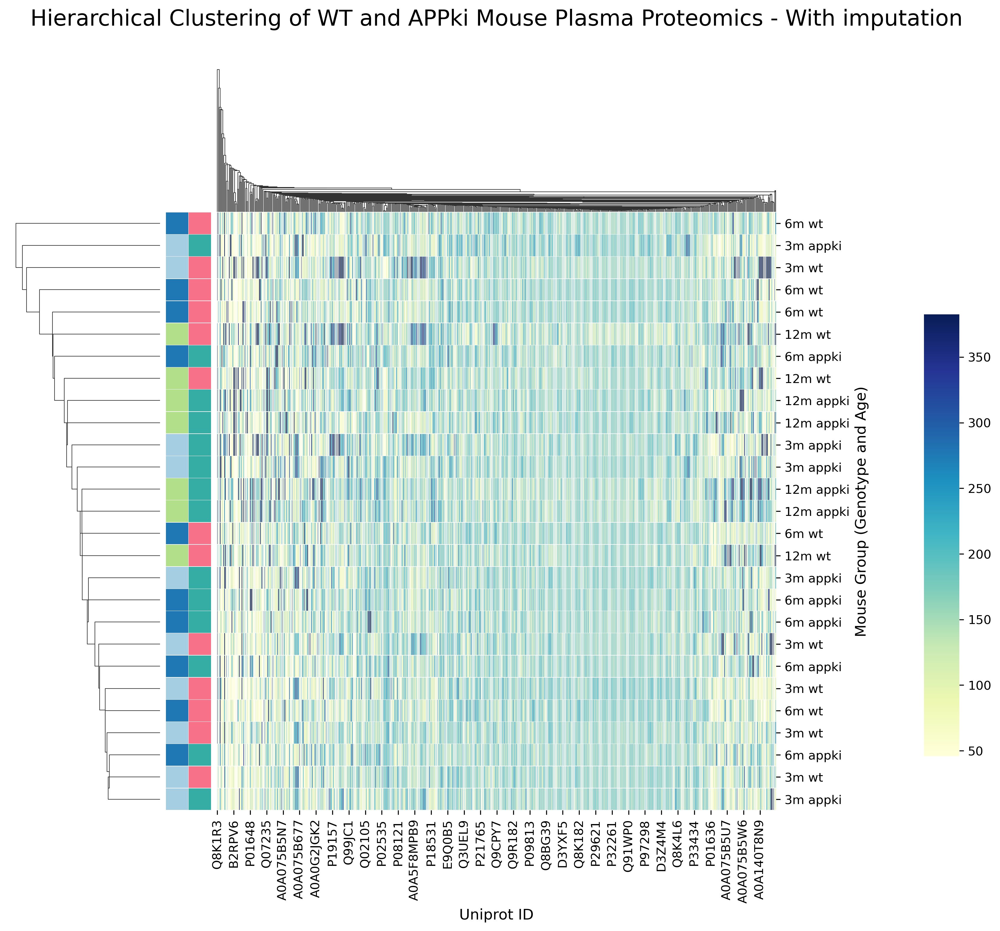

In [169]:
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.color_palette('Paired', len(dfidgroups2.ageid.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(dfidgroups2.ageid.unique(), network_pal))

#get the series of all of the categories
networks = dfidgroups2.ageid

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors = pd.Series(networks).map(network_lut)

#create a second color palette with the same number of colors as unique values in the Source column
network_pal2 = sns.color_palette('husl', len(dfidgroups2.genotypeid.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut2 = dict(zip(dfidgroups2.genotypeid.unique(), network_pal2))

#get the series of all of the categories
networks2 = dfidgroups2.genotypeid

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors2 = pd.Series(networks2).map(network_lut2)

#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column

#Please note, I also checnged the clustering method to centroid (default is average)
g = sns.clustermap(dfidgroups2, method = 'centroid', robust = True, cmap = "YlGnBu", linewidths=0.1, cbar_pos=(1.05, .2, .04, .5), row_colors=[network_colors, network_colors2])
ax = g.ax_heatmap
ax.set_xlabel("Uniprot ID", fontsize = 12)
ax.set_ylabel("Mouse Group (Genotype and Age)", fontsize = 12)
ax.set_title('Hierarchical Clustering of WT and APPki Mouse Plasma Proteomics - With imputation', y=1.3, fontsize = 18)

In [173]:
x = dfpcar.iloc[:, 1: 611].values
y = dfpcar.loc[:,['index']].values
x,y

(array([[124.57895237, 124.84345863, 197.00758767, ...,   6.91733734,
         189.55117673, 156.31434315],
        [149.45539614, 167.27558511,  89.67099909, ..., 172.13051447,
         108.88894369, 169.65036405],
        [102.60575393, 231.60178966, 169.17487161, ...,   6.8682106 ,
         170.63398433, 154.34994359],
        ...,
        [165.06050306, 127.80668355, 232.88561656, ..., 162.18118646,
         173.27120945, 145.32252311],
        [183.97523801, 175.44552164, 192.88290156, ..., 185.69615883,
         200.87311132,  98.24843284],
        [178.98983828, 184.32812522, 222.85399276, ..., 163.65586481,
         170.89423104,  96.29890925]]),
 array([['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m wt'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['3m appki'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m wt'],
        ['6m appki'],
        ['6m ap

In [174]:
x = StandardScaler().fit_transform(x)

In [175]:
x

array([[-0.49711669, -0.52169517,  0.47327   , ..., -1.92676841,
         0.17949786, -0.37574638],
       [-0.21062045, -0.10604081, -1.66037729, ...,  0.53482019,
        -2.09673669, -0.00646243],
       [-0.75017693,  0.52408238, -0.07999147, ..., -1.92750038,
        -0.35433272, -0.43014201],
       ...,
       [-0.03090005, -0.49266817,  1.18645699, ...,  0.38658049,
        -0.27991198, -0.68011773],
       [ 0.18693657, -0.02601019,  0.39127908, ...,  0.73694109,
         0.49899532, -1.98363292],
       [ 0.12952087,  0.06100155,  0.98704739, ...,  0.40855241,
        -0.34698873, -2.03761662]])

In [176]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf.head()

,principal component 1,principal component 2
0,3.093443,10.930706
1,-3.788681,6.668127
2,-1.720539,6.762307
3,20.802425,15.541491
4,-10.358325,10.488024


In [177]:
dfpcar[['index']].head()

Master Protein,index
0,3m wt
1,3m wt
2,3m wt
3,3m wt
4,3m wt


In [178]:
finalDf = pd.concat([principalDf, dfpcar[['index']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,index
0,3.093443,10.930706,3m wt
1,-3.788681,6.668127,3m wt
2,-1.720539,6.762307,3m wt
3,20.802425,15.541491,3m wt
4,-10.358325,10.488024,3m wt


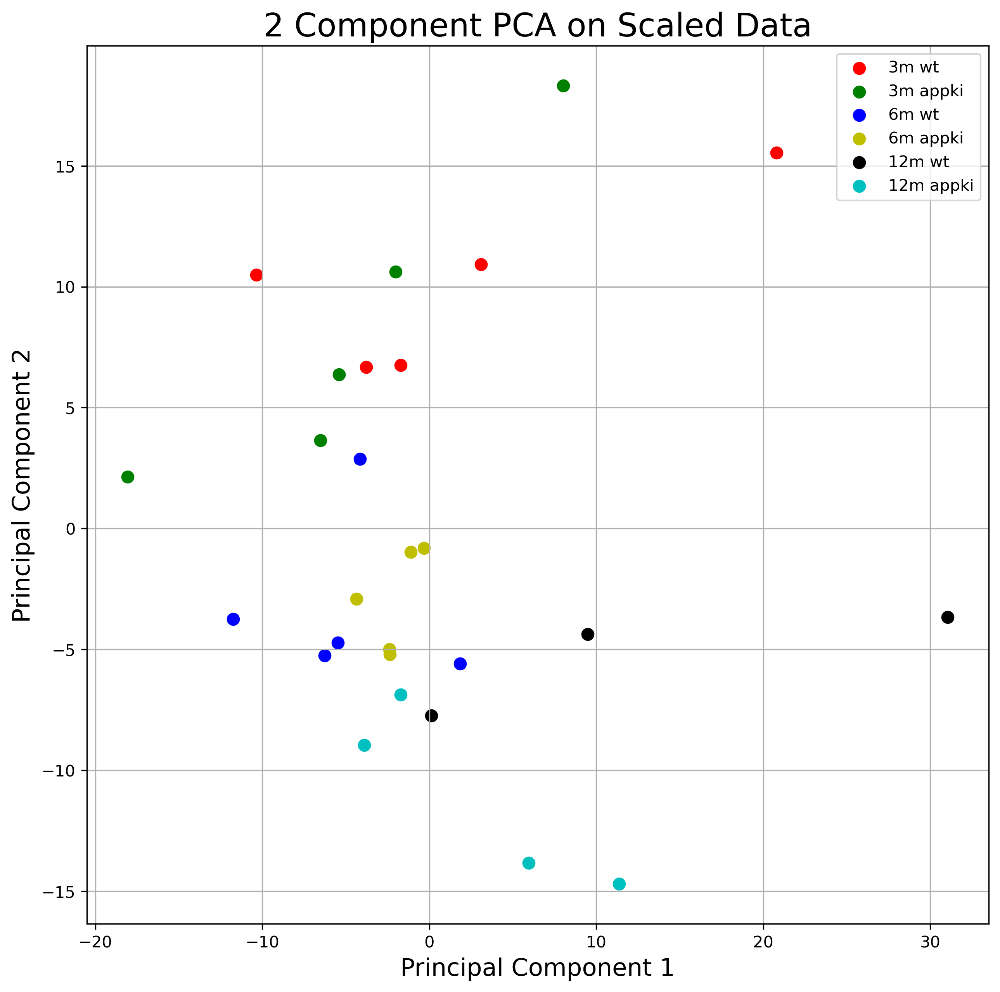

In [180]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA on Scaled Data', fontsize = 20)


targets = ['3m wt', '3m appki', '6m wt', '6m appki', '12m wt', '12m appki']
colors = ['r', 'g', 'b', 'y', 'k', 'c']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['index'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [181]:
#rename columns
df_distribution = df_imputed_total_merge
df_distribution.columns = ['3mwt.1', '3mwt.2', '3mwt.3', '3mwt.4', '3mwt.5', '3mappki.1', '3mappki.2', '3mappki.3', '3mappki.4', '3mappki.5', '6mwt.1', '6mwt.2', '6mwt.3', '6mwt.4', '6mwt.5', '6mappki.1', '6mappki.2', '6mappki.3', '6mappki.4', '6mappki.5', '12mwt.1', '12mwt.2', '12mwt.3',  '12mappki.1', '12mappki.2', '12mappki.3', '12mappki.4']
df_distribution

,3mwt.1,3mwt.2,3mwt.3,3mwt.4,3mwt.5,3mappki.1,3mappki.2,3mappki.3,3mappki.4,3mappki.5,...,6mappki.3,6mappki.4,6mappki.5,12mwt.1,12mwt.2,12mwt.3,12mappki.1,12mappki.2,12mappki.3,12mappki.4
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,124.578952,149.455396,102.605754,165.674286,98.758266,112.903267,122.270686,100.466405,117.205388,124.442726,...,138.240201,127.934449,221.879408,255.299453,165.889178,174.591700,106.755853,165.060503,183.975238,178.989838
A0A075B5K2,124.843459,167.275585,231.601790,134.813408,82.257854,178.041912,91.110384,69.319974,108.579084,135.333896,...,231.303910,170.392253,217.500829,164.596444,128.407653,138.197279,144.908942,127.806684,175.445522,184.328125
A0A075B5K6,197.007588,89.670999,169.174872,148.077972,135.845034,109.799638,90.643023,112.410310,249.768354,109.195173,...,156.952938,196.214906,224.137667,194.076338,212.844239,186.851484,167.345348,232.885617,192.882902,222.853993
A0A075B5L1,103.715239,52.255501,109.631772,126.460023,120.367252,91.270391,141.061164,168.980525,127.445550,123.452601,...,319.192166,96.172195,145.560006,130.937027,184.181088,55.902964,85.443715,68.601525,220.775422,187.671429
A0A075B5L7,103.093031,120.866463,116.232200,167.238277,161.054466,187.762499,154.143959,130.304196,92.757273,156.880173,...,198.986925,187.362298,300.806980,194.747347,254.196834,268.380670,263.927520,163.402668,318.955238,275.221970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,283.616464,155.662106,199.804524,202.776510,58.515460,37.291501,197.816836,154.255451,140.919226,42.667970,...,43.979228,265.676715,81.688972,50.430442,209.770156,152.972834,150.447283,111.263676,35.878917,28.146328
Q9Z2L6,190.181268,141.424181,167.683747,147.438329,248.637140,271.086037,173.694392,175.017280,179.767682,318.155723,...,215.214448,149.546141,179.392235,136.640537,134.070246,151.010837,175.746491,164.715267,155.537306,158.183398
Q9Z2U0,6.917337,172.130514,6.868211,139.866469,145.515410,139.080826,177.535300,180.361788,97.345615,165.341787,...,192.965840,172.838089,6.933033,167.694086,6.260730,170.116475,6.865450,162.181186,185.696159,163.655865


In [182]:
df_distribution = np.log2(df_distribution) #log2transforms the data
df_distribution 

,3mwt.1,3mwt.2,3mwt.3,3mwt.4,3mwt.5,3mappki.1,3mappki.2,3mappki.3,3mappki.4,3mappki.5,...,6mappki.3,6mappki.4,6mappki.5,12mwt.1,12mwt.2,12mwt.3,12mappki.1,12mappki.2,12mappki.3,12mappki.4
Master Protein,,,,,,,,,,,,,,,,,,,,,
A0A075B5K0,6.960917,7.223571,6.680968,7.372206,6.625830,6.818943,6.933935,6.650569,6.872895,6.959338,...,7.111033,6.999261,7.793632,7.996047,7.374076,7.447841,6.738171,7.366851,7.523368,7.483734
A0A075B5K2,6.963976,7.386083,7.855503,7.074820,6.362082,7.476073,6.509544,6.115199,6.762602,7.080379,...,7.853646,7.412716,7.764877,7.362789,7.004587,7.110585,7.179003,6.997819,7.454879,7.526132
A0A075B5K6,7.622107,6.486570,7.402371,7.210213,7.085818,6.778729,6.502124,6.812631,7.964447,6.770765,...,7.294188,7.616291,7.808241,7.600480,7.733654,7.545748,7.386685,7.863478,7.591581,7.799955
A0A075B5L1,6.696484,5.707511,6.776522,6.982538,6.911299,6.512075,7.140177,7.400713,6.993737,6.947813,...,8.318281,6.587548,7.185470,7.032729,7.524981,5.804853,6.416902,6.100169,7.786436,7.552065
A0A075B5L7,6.687803,6.917270,6.860866,7.385761,7.331405,7.552765,7.268135,7.025740,6.535389,7.293519,...,7.636530,7.549687,8.232694,7.605460,7.989802,8.068137,8.043998,7.352288,8.317210,8.104452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9Z2K1,8.147797,7.282274,7.642445,7.663747,5.870746,5.220775,7.628021,7.269178,7.138725,5.415082,...,5.458750,8.053528,6.352069,5.656223,7.712666,7.257132,7.233114,6.797839,5.165064,4.814875
Q9Z2L6,7.571231,7.143885,7.389599,7.203968,7.957898,8.082607,7.440407,7.451354,7.489990,8.313589,...,7.749631,7.224447,7.486974,7.094242,7.066845,7.238508,7.457352,7.363830,7.281117,7.305454
Q9Z2U0,2.790217,7.427359,2.779934,7.127906,7.185028,7.119780,7.471962,7.494750,6.605044,7.369308,...,7.592202,7.433277,2.793487,7.389688,2.646331,7.410379,2.779354,7.341463,7.536800,7.354521


array([[<AxesSubplot:title={'center':'3mwt.1'}>,
        <AxesSubplot:title={'center':'3mwt.2'}>,
        <AxesSubplot:title={'center':'3mwt.3'}>,
        <AxesSubplot:title={'center':'3mwt.4'}>,
        <AxesSubplot:title={'center':'3mwt.5'}>],
       [<AxesSubplot:title={'center':'3mappki.1'}>,
        <AxesSubplot:title={'center':'3mappki.2'}>,
        <AxesSubplot:title={'center':'3mappki.3'}>,
        <AxesSubplot:title={'center':'3mappki.4'}>,
        <AxesSubplot:title={'center':'3mappki.5'}>],
       [<AxesSubplot:title={'center':'6mwt.1'}>,
        <AxesSubplot:title={'center':'6mwt.2'}>,
        <AxesSubplot:title={'center':'6mwt.3'}>,
        <AxesSubplot:title={'center':'6mwt.4'}>,
        <AxesSubplot:title={'center':'6mwt.5'}>],
       [<AxesSubplot:title={'center':'6mappki.1'}>,
        <AxesSubplot:title={'center':'6mappki.2'}>,
        <AxesSubplot:title={'center':'6mappki.3'}>,
        <AxesSubplot:title={'center':'6mappki.4'}>,
        <AxesSubplot:title={'center':'6

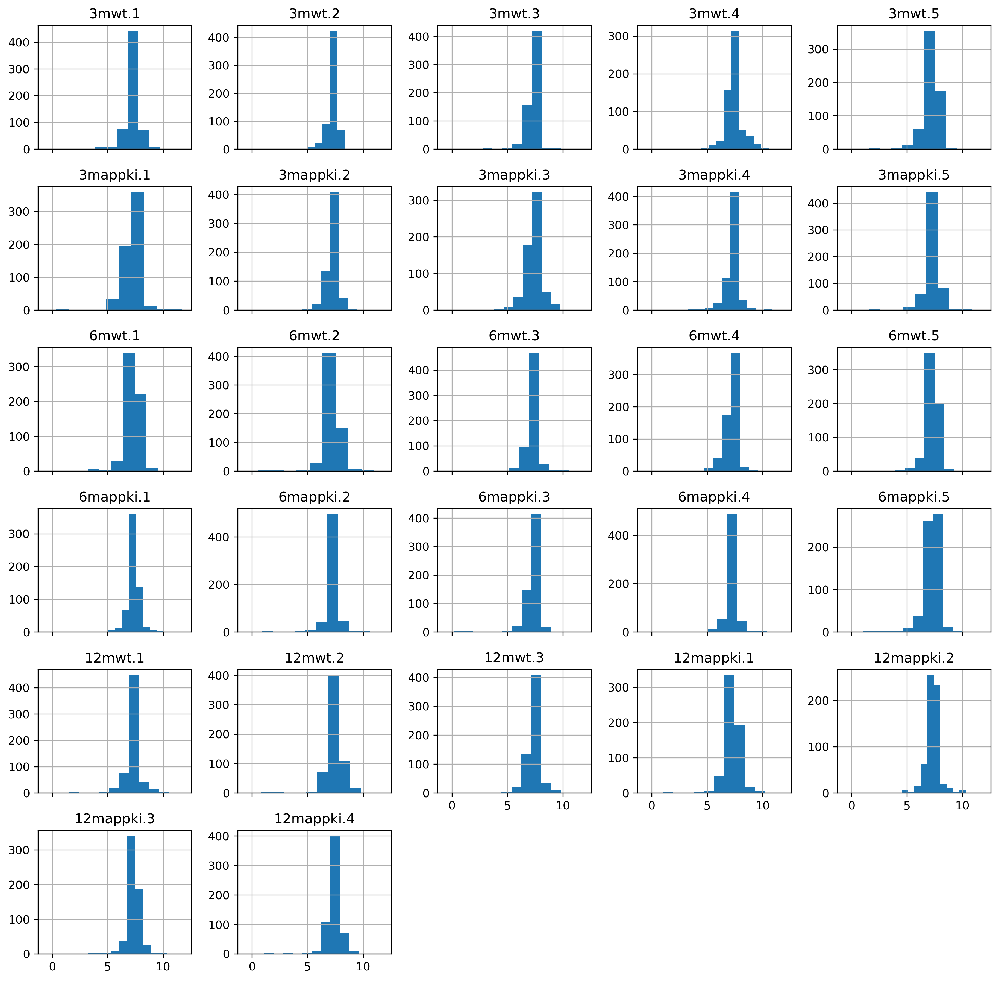

In [183]:
df_distribution.hist(figsize=(15,15), sharex = True)

## Binary comparisons

Should be noted that I am still doing my binary statistics (f test, t test, FC, Log2FC) in excel... I have also not performed FDR correction yet...


In [188]:
#Import 3m group (both WT and APPki) as dataframe df3m, with Master Protein set to index column
df3m = pd.read_excel (r'/Users/jonathanokerblom/Dropbox/My Mac (Jonathan’s MacBook Air)/Documents/Head Proteomics/3m__merged_imputed_binary.xlsx', index_col=0) 

#View dataframe df3m
df3m 

,18,19,20,21,22,23,24,25,26,27,Protein,F TEST,T TEST,Avg wt,avg appki,FC,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
P11438,182.281187,202.088726,184.153897,154.631504,183.345955,106.234494,156.395500,157.179436,135.219239,126.802433,Lamp1,0.665697,0.006274,181.300254,136.366220,0.752157,-0.410895
A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,Ighg3,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902
P01741,169.779805,118.807605,131.159970,186.665547,103.688485,69.809873,77.906757,63.058879,128.575266,63.397157,NaN,0.653980,0.014906,142.020282,80.549586,0.567170,-0.818148
A0A140T8P5,135.085861,177.422536,158.870171,131.569288,140.614873,77.644110,152.392091,77.396898,113.059798,65.005047,Igkv8-24,0.255581,0.021637,148.712546,97.099589,0.652935,-0.614989
P70195,205.186096,198.676662,204.325441,204.666819,153.054211,163.034445,164.080859,147.817022,175.662776,160.813055,Psmb7,0.140321,0.023179,193.181846,162.281631,0.840046,-0.251460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P26262,156.432345,165.044860,166.594667,180.723655,218.197903,169.278065,179.315995,173.307956,179.668197,186.120716,Klkb1,0.024710,0.990669,177.398686,177.538186,1.000786,0.001134
P14847,157.546046,159.987815,148.460496,155.805246,195.850748,186.761086,168.623625,152.578629,161.445163,147.727703,Crp,0.718735,0.992615,163.530070,163.427241,0.999371,-0.000907
P07724,169.877420,158.707228,154.812436,180.261803,209.061532,147.065187,178.118456,186.777059,195.532866,165.794983,Alb,0.797282,0.993180,174.544084,174.657710,1.000651,0.000939


In [191]:
#replace nan with 0
df3mg = df3m.fillna(0)
df3mg

,18,19,20,21,22,23,24,25,26,27,Protein,F TEST,T TEST,Avg wt,avg appki,FC,Log2FC
Master Protein,,,,,,,,,,,,,,,,,
P11438,182.281187,202.088726,184.153897,154.631504,183.345955,106.234494,156.395500,157.179436,135.219239,126.802433,Lamp1,0.665697,0.006274,181.300254,136.366220,0.752157,-0.410895
A0A1Y7VJN6,161.740990,148.535593,165.928878,139.420488,155.381667,82.491290,142.423971,114.693575,91.514366,129.426672,Ighg3,0.121684,0.008667,154.201523,112.109975,0.727035,-0.459902
P01741,169.779805,118.807605,131.159970,186.665547,103.688485,69.809873,77.906757,63.058879,128.575266,63.397157,0,0.653980,0.014906,142.020282,80.549586,0.567170,-0.818148
A0A140T8P5,135.085861,177.422536,158.870171,131.569288,140.614873,77.644110,152.392091,77.396898,113.059798,65.005047,Igkv8-24,0.255581,0.021637,148.712546,97.099589,0.652935,-0.614989
P70195,205.186096,198.676662,204.325441,204.666819,153.054211,163.034445,164.080859,147.817022,175.662776,160.813055,Psmb7,0.140321,0.023179,193.181846,162.281631,0.840046,-0.251460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P26262,156.432345,165.044860,166.594667,180.723655,218.197903,169.278065,179.315995,173.307956,179.668197,186.120716,Klkb1,0.024710,0.990669,177.398686,177.538186,1.000786,0.001134
P14847,157.546046,159.987815,148.460496,155.805246,195.850748,186.761086,168.623625,152.578629,161.445163,147.727703,Crp,0.718735,0.992615,163.530070,163.427241,0.999371,-0.000907
P07724,169.877420,158.707228,154.812436,180.261803,209.061532,147.065187,178.118456,186.777059,195.532866,165.794983,Alb,0.797282,0.993180,174.544084,174.657710,1.000651,0.000939


## 3m WT vs APPki - imputed

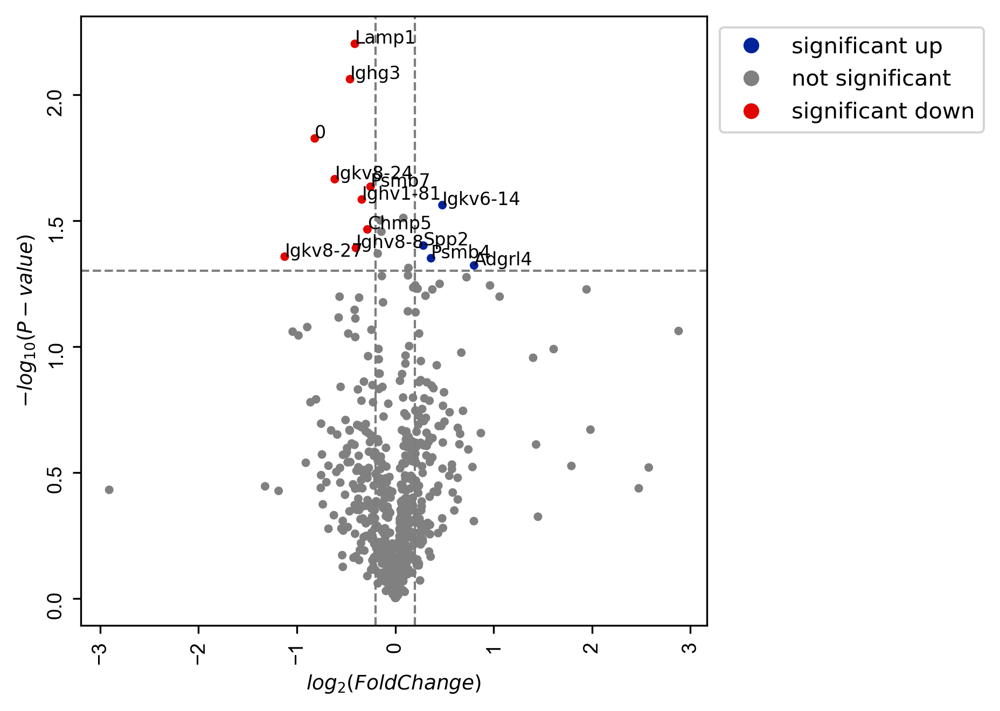

In [192]:
#Visualize binary comparison of 3m group (WT vs APPki)
visuz.gene_exp.volcano(df=df3mg, show = True, lfc='Log2FC', pv='T TEST', geneid="Protein", lfc_thr=(.2, .2), pv_thr=(0.05, 0.05), genenames = 'deg',
    color=("#00239CFF", "grey", "#E10600FF"), plotlegend=True, gstyle=1, sign_line=True, legendpos='upper right', 
    legendanchor=(1.46,1), r=1200)


## This code can be modifed and applied towards TMT 16plex...